# EDA

In [1]:
import pandas as pd
import random
import math
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, log_loss, roc_auc_score, f1_score
from sklearn.model_selection import RandomizedSearchCV, train_test_split, cross_val_score
from scipy.stats import randint, uniform
from sklearn.utils.class_weight import compute_class_weight

In [2]:
pd.set_option('display.max_columns', 30)

In [3]:
def seed_everything(seed):
    random.seed(seed) #파이썬 자체 모듈 random 모듈의 시드 고정
    os.environ['PYTHONHASHSEED'] = str(seed) 
    np.random.seed(seed)
    
seed_everything(37)

In [4]:
# 한글 폰트 설정
import matplotlib.pyplot as plt
import platform

path = "c:/Windows/Fonts/malgun.ttf"
from matplotlib import font_manager, rc

if platform.system() == 'Darwin':
    plt.rcParams["font.family"] = 'AppleGothic'

elif platform.system() == 'Windows':
    font_name = font_manager.FontProperties(fname=path).get_name()
    plt.rcParams["font.family"] = font_name
elif platform.system() == 'Linux':
    plt.rcParams['font.family'] = 'NanumGothic'


plt.rcParams['axes.unicode_minus'] = False

In [5]:
train = pd.read_csv('../data/train.csv')

# 데이터 살펴보기

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2452 entries, 0 to 2451
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      2452 non-null   object 
 1   매물확인방식  2452 non-null   object 
 2   보증금     2452 non-null   float64
 3   월세      2452 non-null   int64  
 4   전용면적    1665 non-null   float64
 5   해당층     2223 non-null   float64
 6   총층      2436 non-null   float64
 7   방향      2452 non-null   object 
 8   방수      2436 non-null   float64
 9   욕실수     2434 non-null   float64
 10  주차가능여부  2452 non-null   object 
 11  총주차대수   1756 non-null   float64
 12  관리비     2452 non-null   int64  
 13  중개사무소   2452 non-null   object 
 14  제공플랫폼   2452 non-null   object 
 15  게재일     2452 non-null   object 
 16  허위매물여부  2452 non-null   int64  
dtypes: float64(7), int64(3), object(7)
memory usage: 325.8+ KB


In [7]:
train.head()

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
0,TRAIN_0000,현장확인,402500000.0,470000,NaN,NaN,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0
1,TRAIN_0001,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0
2,TRAIN_0002,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0
3,TRAIN_0003,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0
4,TRAIN_0004,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1


In [8]:
train.describe()

,보증금,월세,전용면적,해당층,총층,방수,욕실수,총주차대수,관리비,허위매물여부
count,2.452000e+03,2452.000000,1665.000000,2223.000000,2436.000000,2436.000000,2434.000000,1756.000000,2452.000000,2452.000000
mean,1.574188e+08,380420.065253,27.009628,4.848403,8.052545,1.378079,1.034511,20.332574,5.477977,0.121533
std,1.212794e+08,206425.413601,7.951757,3.543348,4.920112,0.485007,0.182575,28.939900,5.631185,0.326813
min,5.000000e+06,0.000000,17.500000,1.000000,2.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,7.500000e+07,200000.000000,19.800000,2.000000,4.000000,1.000000,1.000000,4.000000,0.000000,0.000000
50%,1.325000e+08,380000.000000,26.400000,4.000000,6.000000,1.000000,1.000000,10.000000,5.000000,0.000000
75%,1.890000e+08,550000.000000,32.110000,6.000000,10.000000,2.000000,1.000000,31.000000,9.000000,0.000000
max,4.090000e+08,750000.000000,49.970000,21.000000,21.000000,2.000000,2.000000,590.000000,96.000000,1.000000


In [9]:
train.describe(include = 'object')

,ID,매물확인방식,방향,주차가능여부,중개사무소,제공플랫폼,게재일
count,2452,2452,2452,2452,2452,2452,2452
unique,2452,3,8,2,279,13,534
top,TRAIN_0000,현장확인,남향,가능,G52Iz8V2B9,A플랫폼,2024-11-08
freq,1,1705,610,1237,799,958,19


In [10]:
train[train.총주차대수==590]

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
1154,TRAIN_1154,전화확인,402500000.0,300000,23.1,NaN,5.0,남향,1.0,1.0,가능,590.0,10,N45gM0M7R0,E플랫폼,2024-12-21,0


In [11]:
train.sort_values(by="총주차대수", ascending=False).head(10)

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
1154,TRAIN_1154,전화확인,402500000.0,300000,23.10,NaN,5.0,남향,1.0,1.0,가능,590.0,10,N45gM0M7R0,E플랫폼,2024-12-21,0
2087,TRAIN_2087,현장확인,140500000.0,460000,29.36,NaN,9.0,동향,2.0,1.0,가능,260.0,9,r82ax9M3U3,B플랫폼,2024-10-05,0
470,TRAIN_0470,현장확인,101500000.0,380000,29.36,NaN,9.0,동향,2.0,1.0,가능,260.0,2,r82ax9M3U3,B플랫폼,2025-01-15,0
2192,TRAIN_2192,현장확인,387000000.0,470000,29.36,NaN,9.0,동향,2.0,1.0,가능,260.0,7,r82ax9M3U3,B플랫폼,2024-06-10,0
142,TRAIN_0142,서류확인,106000000.0,450000,17.50,9.0,21.0,남동향,1.0,1.0,가능,238.0,14,n74bA7B3O7,G플랫폼,2024-11-28,0
2010,TRAIN_2010,현장확인,27500000.0,260000,18.04,NaN,15.0,남향,1.0,1.0,가능,200.0,6,G38pb6B9C7,C플랫폼,2024-12-06,0
275,TRAIN_0275,현장확인,178500000.0,720000,17.50,9.0,21.0,동향,1.0,1.0,가능,166.0,6,h01gF5M7X6,D플랫폼,2024-12-27,0
559,TRAIN_0559,전화확인,325000000.0,430000,17.50,NaN,21.0,동향,1.0,1.0,가능,166.0,0,G38pb6B9C7,C플랫폼,2024-09-19,0
1916,TRAIN_1916,전화확인,399500000.0,580000,17.50,16.0,21.0,동향,1.0,1.0,가능,166.0,11,h01gF5M7X6,D플랫폼,2024-11-11,0
1652,TRAIN_1652,현장확인,400000000.0,280000,22.99,NaN,21.0,동향,1.0,1.0,가능,166.0,7,u56qH5I5H8,B플랫폼,2024-07-03,0


In [12]:
# 매물확인방식별 허위매물 비율 계산
train.groupby('매물확인방식')['허위매물여부'].mean()

매물확인방식
서류확인    0.104110
전화확인    0.094241
현장확인    0.131378
Name: 허위매물여부, dtype: float64

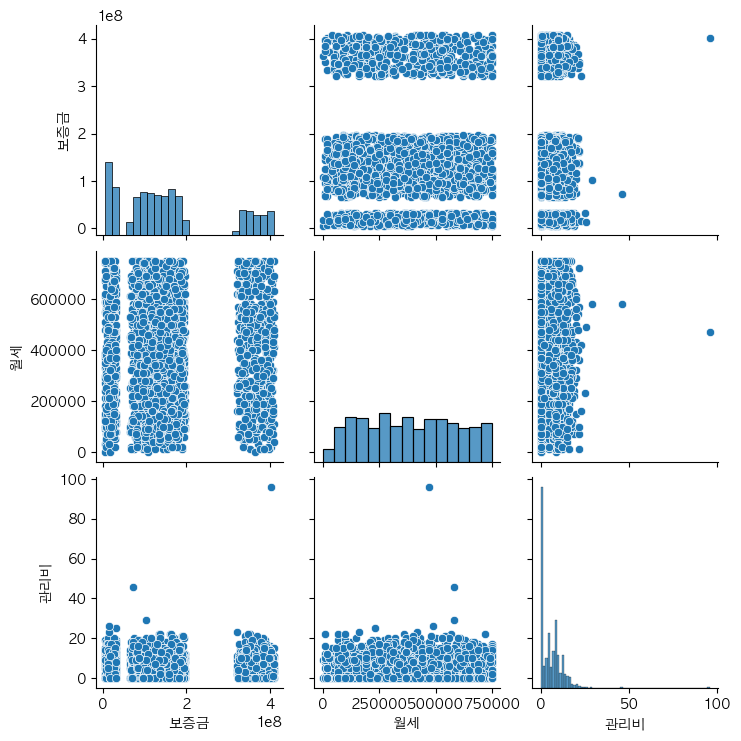

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

features = ['보증금', '월세', '관리비']

# pairplot으로 변수 간 관계 시각화 (2개 변수 조합에 대해 산점도로 표현하고 같은 변수끼리는 히스토그램)
df_subset = train[features]
sns.pairplot(df_subset)
plt.show()

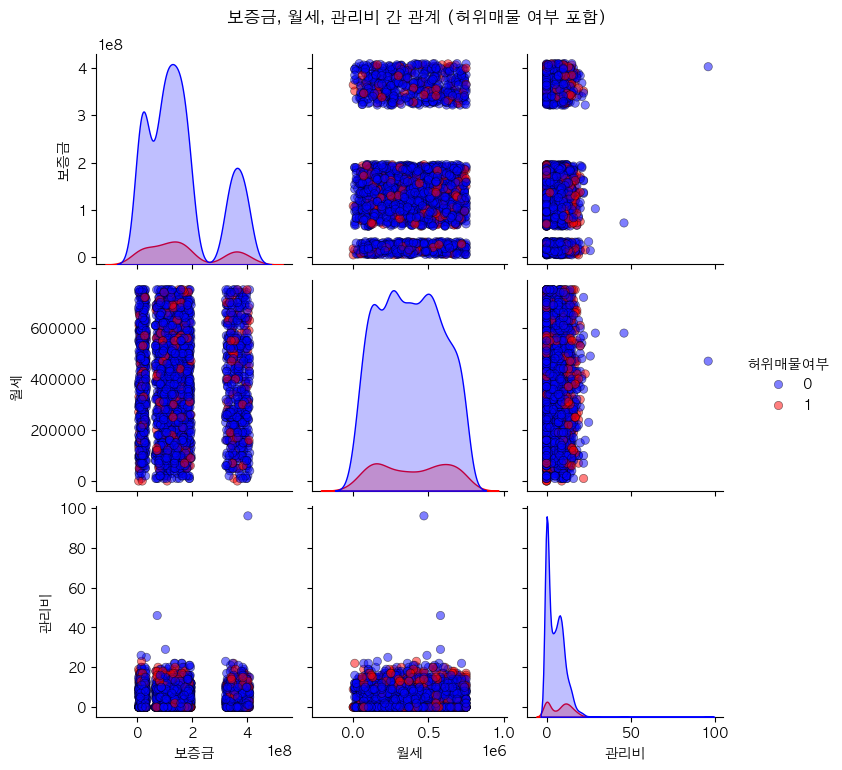

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

features = ['보증금', '월세', '관리비', '허위매물여부']  # 허위매물여부 추가
df_subset = train[features]

def custom_pairplot(data):
    palette = {0: "blue", 1: "red"}
    
    g = sns.pairplot(data, hue="허위매물여부", palette=palette, plot_kws={'alpha': 0.5, 'edgecolor': 'k'})  

    g.fig.suptitle("보증금, 월세, 관리비 간 관계 (허위매물 여부 포함)", y=1.02)

    return g


custom_pairplot(df_subset)
plt.show()


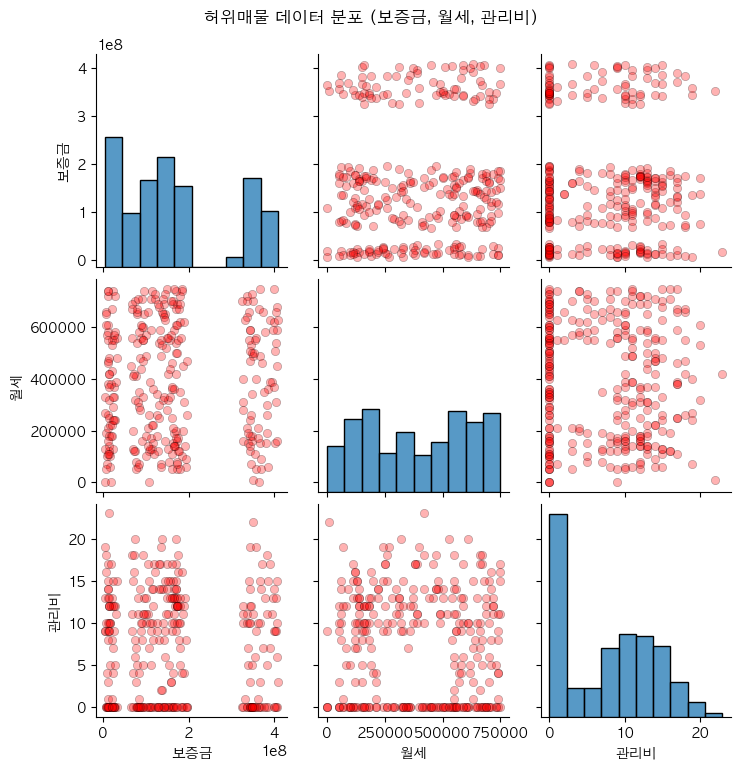

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

features = ['보증금', '월세', '관리비', '허위매물여부']
df_subset = train[features]

# 허위매물(1)인 데이터만 필터링
df_fake = df_subset[df_subset['허위매물여부'] == 1]

def custom_pairplot(data):
    data = data.drop(columns = ['허위매물여부'], axis = 1)
    g = sns.pairplot(data, plot_kws={'color': 'red', 'alpha': 0.3, 'edgecolor': 'k'})  
    g.fig.suptitle("허위매물 데이터 분포 (보증금, 월세, 관리비)", y=1.02)

    return g

custom_pairplot(df_fake)
plt.show()

In [16]:
train[train["월세"]==0] #전세 매물존재 - 모두 허위매물이다.

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
188,TRAIN_0188,현장확인,5000000.0,0,NaN,4.0,4.0,동향,1.0,1.0,불가능,1.0,9,Z18up3D1C3,A플랫폼,2024-08-27,1
725,TRAIN_0725,서류확인,364000000.0,0,17.50,10.0,16.0,북동향,1.0,1.0,가능,34.0,0,R17wi5N4M8,D플랫폼,2024-05-19,1
809,TRAIN_0809,현장확인,108500000.0,0,18.87,NaN,16.0,동향,1.0,1.0,가능,54.0,0,G38pb6B9C7,C플랫폼,2024-07-16,1
1305,TRAIN_1305,현장확인,18000000.0,0,17.50,NaN,17.0,남동향,1.0,1.0,가능,99.0,0,y86qM5T6T6,A플랫폼,2024-05-16,1


In [38]:
train[train["관리비"]==0] 

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
1,TRAIN_0001,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0
2,TRAIN_0002,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0
4,TRAIN_0004,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1
5,TRAIN_0005,전화확인,153000000.0,530000,29.50,NaN,3.0,남향,2.0,1.0,가능,1.0,0,Q42YF3Y0I2,A플랫폼,2024-09-12,0
6,TRAIN_0006,현장확인,348500000.0,400000,NaN,2.0,3.0,북동향,1.0,1.0,불가능,NaN,0,A72Mx9C8U2,D플랫폼,2024-08-23,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2433,TRAIN_2433,현장확인,96500000.0,310000,17.50,3.0,10.0,남동향,2.0,2.0,가능,48.0,0,G52Iz8V2B9,K플랫폼,2025-01-15,0
2437,TRAIN_2437,현장확인,151500000.0,650000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,L27JO3N6S2,C플랫폼,2024-12-15,0
2443,TRAIN_2443,현장확인,16500000.0,370000,NaN,4.0,9.0,남향,1.0,1.0,불가능,6.0,0,S06Ox3K4D9,A플랫폼,2024-11-13,0
2444,TRAIN_2444,현장확인,31000000.0,370000,17.50,2.0,7.0,남서향,1.0,1.0,가능,50.0,0,G52Iz8V2B9,A플랫폼,2024-08-27,0


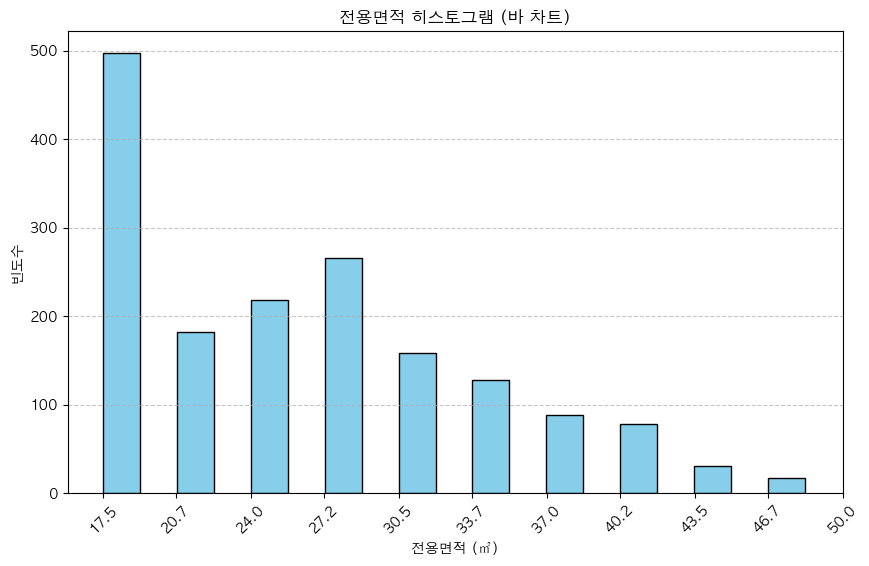

NaN 값 개수: 787개


In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

hist_counts, bin_edges = np.histogram(train['전용면적'].dropna(), bins=10) 

plt.figure(figsize=(10, 6))
plt.bar(bin_edges[:-1], hist_counts, width=np.diff(bin_edges)*0.5, align='edge', color='skyblue', edgecolor='black')
plt.xlabel('전용면적 (㎡)')
plt.ylabel('빈도수')
plt.title('전용면적 히스토그램 (바 차트)')
plt.xticks(bin_edges.round(1), rotation=45)  # X축 레이블을 구간 값으로 설정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

print(f"NaN 값 개수: {train['전용면적'].isna().sum()}개")


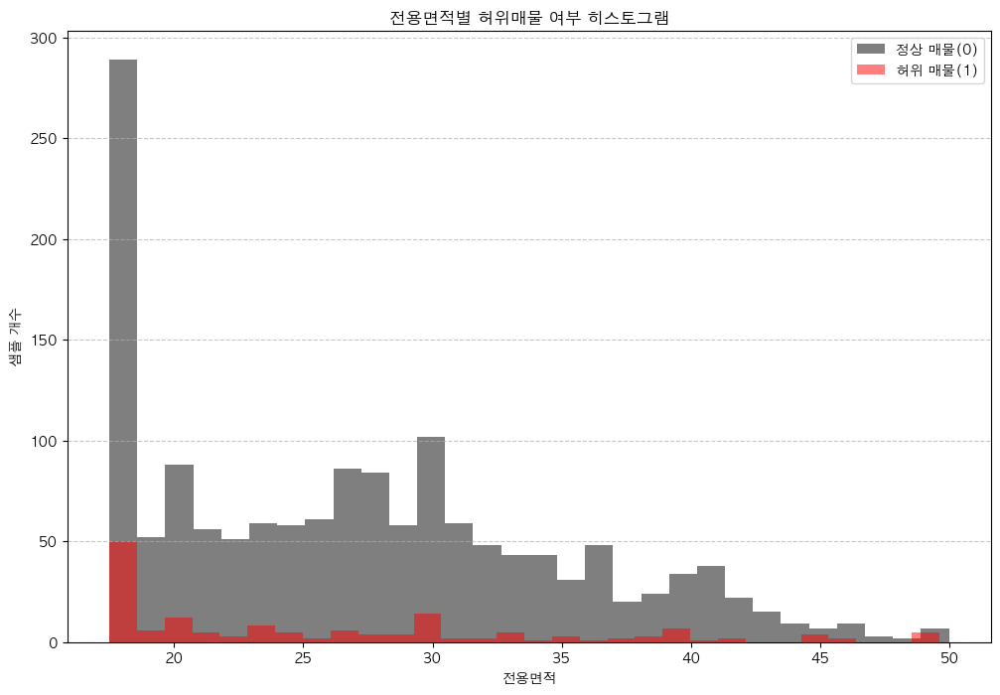

In [290]:
import matplotlib.pyplot as plt

normal_listings = train[train['허위매물여부'] == 0]['전용면적']
fake_listings = train[train['허위매물여부'] == 1]['전용면적']

plt.figure(figsize=(12, 8))
plt.hist(normal_listings, bins=30, alpha=0.5, color='black', label='정상 매물(0)')
plt.hist(fake_listings, bins=30, alpha=0.5, color='red', label='허위 매물(1)')

plt.xlabel('전용면적')
plt.ylabel('샘플 개수')
plt.title('전용면적별 허위매물 여부 히스토그램')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [40]:
train.해당층.value_counts()

해당층
2.0     507
3.0     420
4.0     335
5.0     240
6.0     143
7.0     104
1.0      98
9.0      71
8.0      70
10.0     47
11.0     43
12.0     41
14.0     21
13.0     19
16.0     15
15.0     12
19.0     10
17.0     10
18.0      9
20.0      5
21.0      3
Name: count, dtype: int64

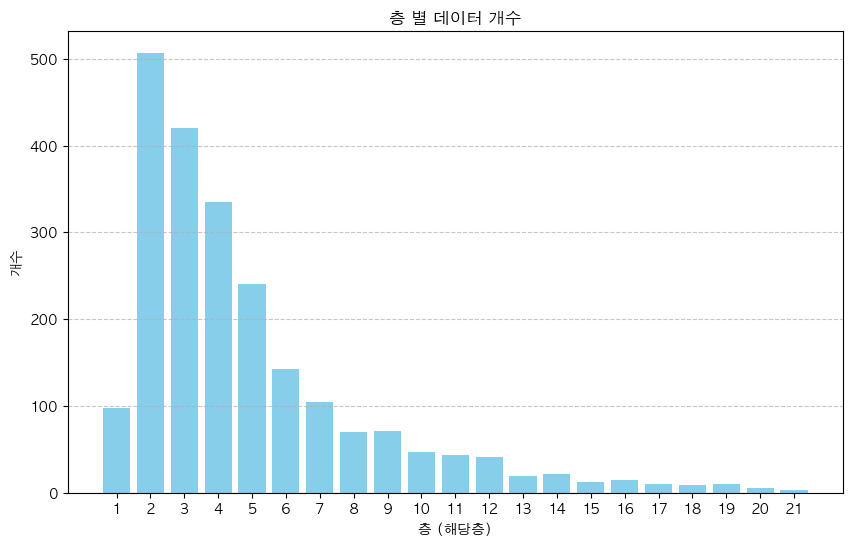

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

floor_counts = train['해당층'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(floor_counts.index, floor_counts.values, color='skyblue')
plt.xlabel('층 (해당층)')
plt.ylabel('개수')
plt.title('층 별 데이터 개수')
plt.xticks(floor_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


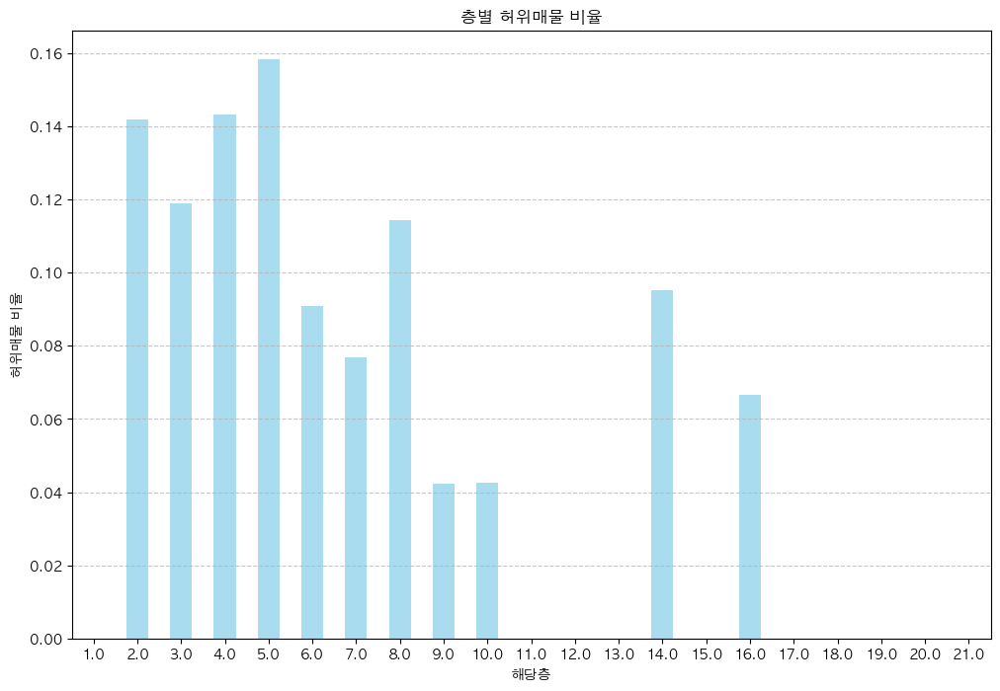

In [43]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby('해당층')['허위매물여부'].mean()

plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', color='skyblue', alpha=0.7)

plt.xlabel('해당층')
plt.ylabel('허위매물 비율')
plt.title('층별 허위매물 비율')
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [279]:
train[train.해당층.isnull()] #해당층 결측치 229개

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
0,TRAIN_0000,현장확인,402500000.0,470000,NaN,NaN,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0
5,TRAIN_0005,전화확인,153000000.0,530000,29.50,NaN,3.0,남향,2.0,1.0,가능,1.0,0,Q42YF3Y0I2,A플랫폼,2024-09-12,0
20,TRAIN_0020,전화확인,12500000.0,50000,29.88,NaN,10.0,남서향,2.0,1.0,가능,34.0,14,r82ax9M3U3,B플랫폼,2024-10-29,0
28,TRAIN_0028,현장확인,354500000.0,750000,19.83,NaN,5.0,남향,1.0,1.0,불가능,NaN,0,Q42YF3Y0I2,A플랫폼,2025-01-02,0
37,TRAIN_0037,현장확인,25000000.0,520000,NaN,NaN,NaN,동향,NaN,NaN,불가능,NaN,4,k74XT0T1B8,D플랫폼,2024-10-06,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2346,TRAIN_2346,현장확인,340500000.0,270000,17.52,NaN,5.0,남향,1.0,1.0,가능,8.0,3,M92wE9E7E5,A플랫폼,2024-08-23,0
2347,TRAIN_2347,현장확인,30500000.0,470000,41.65,NaN,9.0,동향,2.0,1.0,가능,50.0,15,r82ax9M3U3,B플랫폼,2024-11-13,0
2364,TRAIN_2364,현장확인,183000000.0,560000,NaN,NaN,5.0,남향,2.0,1.0,가능,3.0,0,G56AC9J0D6,A플랫폼,2024-09-05,1
2397,TRAIN_2397,현장확인,96000000.0,240000,NaN,NaN,5.0,동향,2.0,1.0,불가능,NaN,0,S14na8Q8K2,A플랫폼,2024-11-16,0


In [44]:
train.총층.unique()

array([15.,  4.,  3.,  9.,  2.,  5., 18., 10.,  8.,  6., 14., 11., 21.,
       nan,  7., 13., 16., 12., 19., 20., 17.])

In [45]:
train.총층.value_counts()

총층
6.0     368
3.0     302
4.0     291
5.0     275
7.0     214
9.0     138
8.0     133
10.0    102
14.0     77
11.0     70
21.0     56
17.0     55
16.0     52
18.0     47
19.0     47
15.0     46
12.0     44
13.0     41
2.0      39
20.0     39
Name: count, dtype: int64

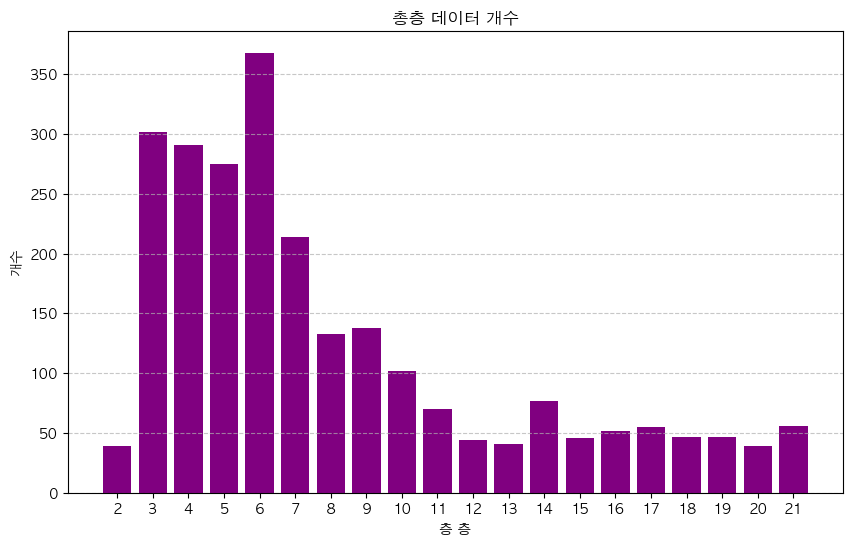

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

totalFloor_counts = train['총층'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(totalFloor_counts.index, totalFloor_counts.values, color='purple')
plt.xlabel('층 층')
plt.ylabel('개수')
plt.title('총층 데이터 개수')
plt.xticks(totalFloor_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

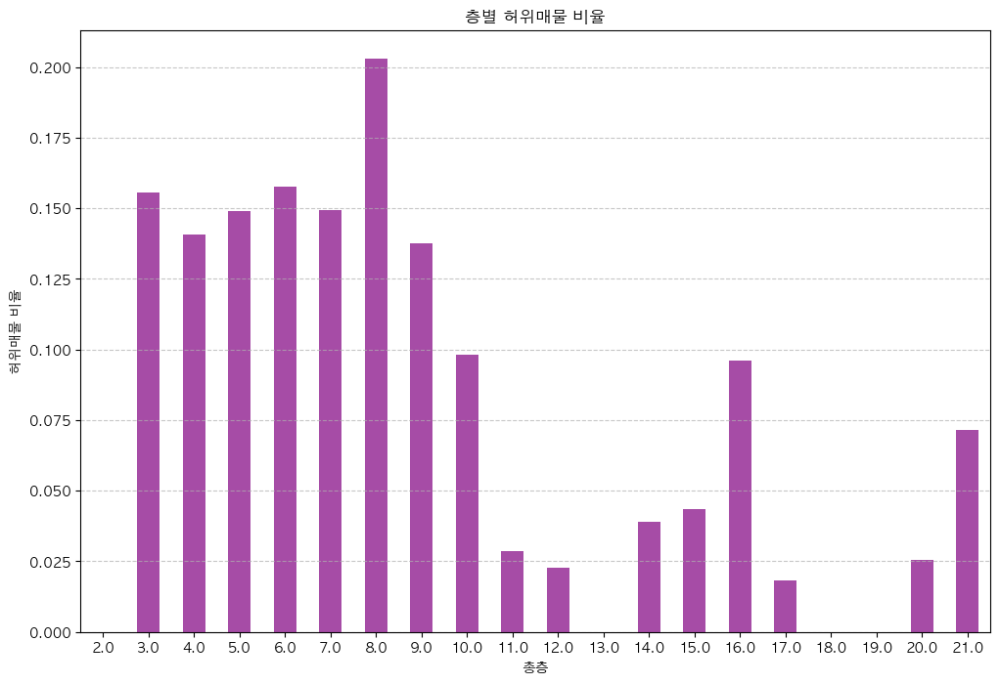

In [47]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby('총층')['허위매물여부'].mean()

plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', color='purple', alpha=0.7)

plt.xlabel('총층')
plt.ylabel('허위매물 비율')
plt.title('층별 허위매물 비율')
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [283]:
train[train.총층.isnull()] # 총층 결측치 16개

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
37,TRAIN_0037,현장확인,25000000.0,520000,NaN,NaN,NaN,동향,NaN,NaN,불가능,NaN,4,k74XT0T1B8,D플랫폼,2024-10-06,0
76,TRAIN_0076,전화확인,81000000.0,70000,NaN,NaN,NaN,남향,NaN,NaN,불가능,NaN,0,K48zc2G4K8,D플랫폼,2025-01-04,0
88,TRAIN_0088,현장확인,151000000.0,50000,NaN,NaN,NaN,서향,NaN,NaN,불가능,NaN,0,M02bn7Y4P0,D플랫폼,2025-01-16,0
153,TRAIN_0153,현장확인,167000000.0,380000,NaN,NaN,NaN,동향,NaN,NaN,가능,1.0,0,c14YI4Z7E6,D플랫폼,2024-08-29,0
339,TRAIN_0339,서류확인,194000000.0,360000,NaN,NaN,NaN,남향,NaN,NaN,불가능,NaN,0,M02bn7Y4P0,D플랫폼,2025-01-13,0
456,TRAIN_0456,전화확인,65500000.0,100000,NaN,NaN,NaN,북서향,NaN,NaN,가능,4.0,9,l84az9J6A2,C플랫폼,2024-10-15,0
515,TRAIN_0515,전화확인,189500000.0,500000,NaN,NaN,NaN,북서향,NaN,NaN,불가능,NaN,0,M02bn7Y4P0,D플랫폼,2024-07-25,0
546,TRAIN_0546,서류확인,116000000.0,180000,NaN,NaN,NaN,남동향,NaN,NaN,불가능,NaN,9,o07ZC4L7V4,C플랫폼,2024-11-07,0
686,TRAIN_0686,현장확인,181500000.0,520000,NaN,NaN,NaN,서향,NaN,NaN,불가능,NaN,0,M02bn7Y4P0,D플랫폼,2024-08-15,0
952,TRAIN_0952,서류확인,350000000.0,700000,NaN,NaN,NaN,남향,NaN,NaN,불가능,NaN,0,K48zc2G4K8,D플랫폼,2024-07-03,1


<Figure size 2000x1500 with 0 Axes>

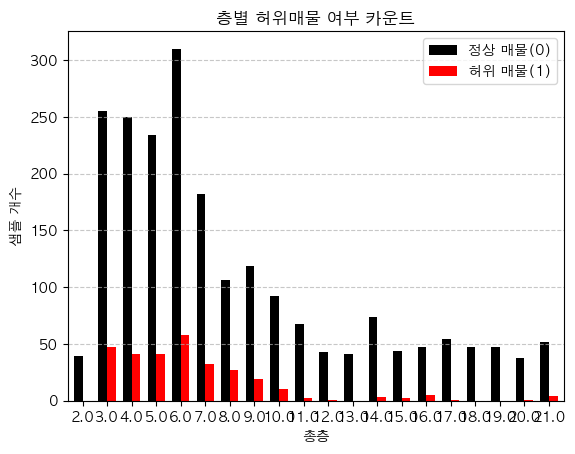

In [52]:
# import matplotlib.pyplot as plt
# import pandas as pd

# count_df = train.groupby(['총층', '허위매물여부']).size().unstack(fill_value=0)

# # 바 차트 그리기
# plt.figure(figsize=(20, 15))
# count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

# # 그래프 스타일 설정
# plt.xlabel('총층')
# plt.ylabel('샘플 개수')
# plt.title('층별 허위매물 여부 카운트')
# plt.legend(['정상 매물(0)', '허위 매물(1)'])
# plt.xticks(rotation=0)  # X축 라벨 가독성 조정
# plt.grid(axis='y', linestyle='--', alpha=0.7)

# # 그래프 표시
# plt.show()

## 해당층과 총층 이용해 분석

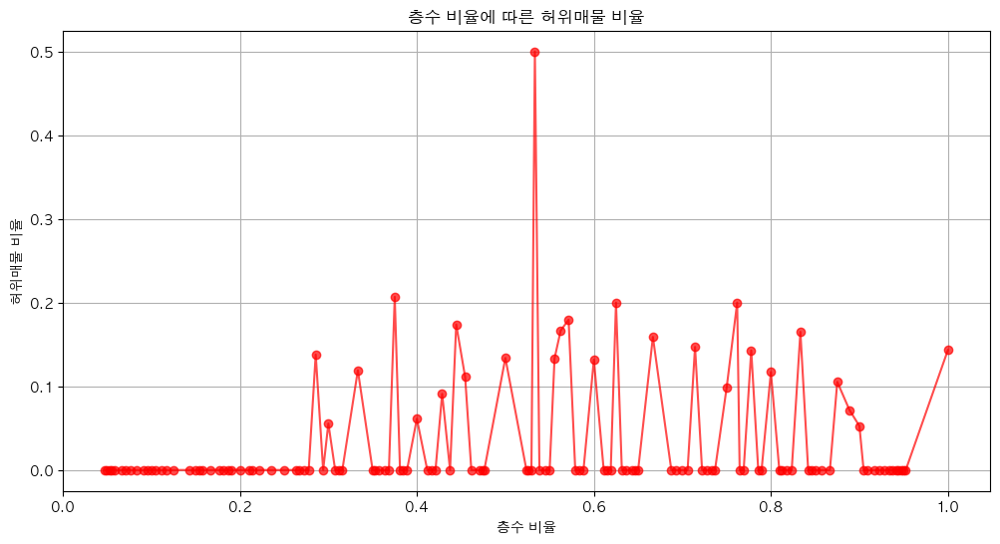

In [48]:
# train["층수비율"] = train["해당층"] / train["총층"]
# count_df = train.groupby("층수비율")["허위매물여부"].mean()

# plt.figure(figsize=(12, 6))
# count_df.plot(kind='line', color='red', marker='o', alpha=0.7)
# plt.xlabel("층수 비율")
# plt.ylabel("허위매물 비율")
# plt.title("층수 비율에 따른 허위매물 비율")
# plt.grid()
# plt.show()

<Figure size 2000x1500 with 0 Axes>

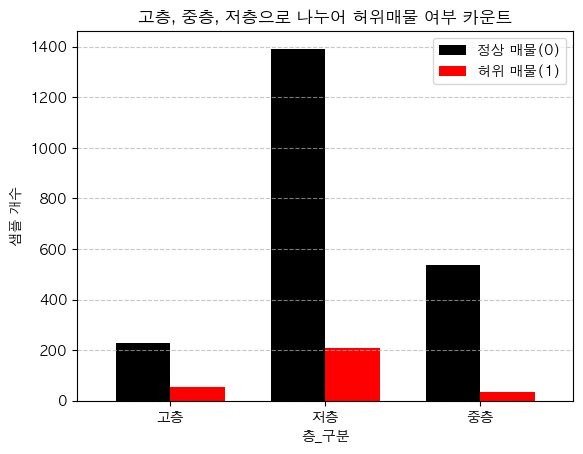

In [51]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby(['층_구분', '허위매물여부']).size().unstack(fill_value=0)

plt.figure(figsize=(20, 15))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

plt.xlabel('층_구분')
plt.ylabel('샘플 개수')
plt.title('고층, 중층, 저층으로 나누어 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

## 방향

In [53]:
train.방향.unique()

array(['서향', '남동향', '동향', '남향', '북동향', '북향', '남서향', '북서향'], dtype=object)

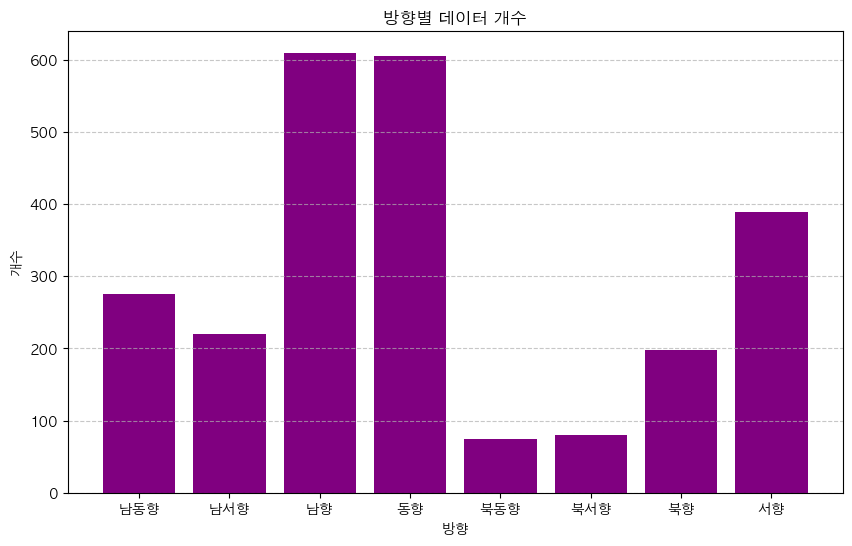

In [59]:
import pandas as pd
import matplotlib.pyplot as plt

direction_counts = train['방향'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(direction_counts.index, direction_counts.values, color='purple')
plt.xlabel('방향')
plt.ylabel('개수')
plt.title('방향별 데이터 개수')
plt.xticks(direction_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<Figure size 2000x1500 with 0 Axes>

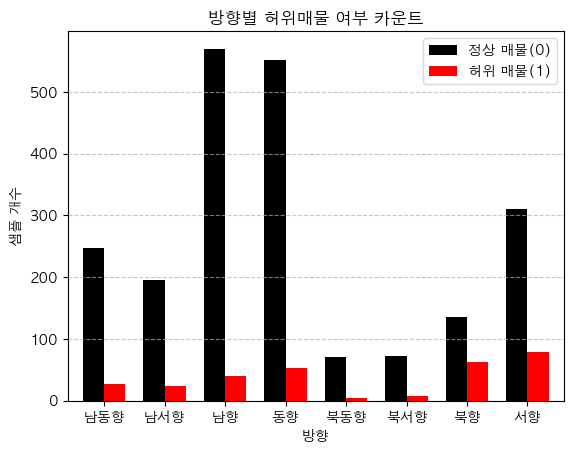

In [57]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby(['방향', '허위매물여부']).size().unstack(fill_value=0)

plt.figure(figsize=(20, 15))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

plt.xlabel('방향')
plt.ylabel('샘플 개수')
plt.title('방향별 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

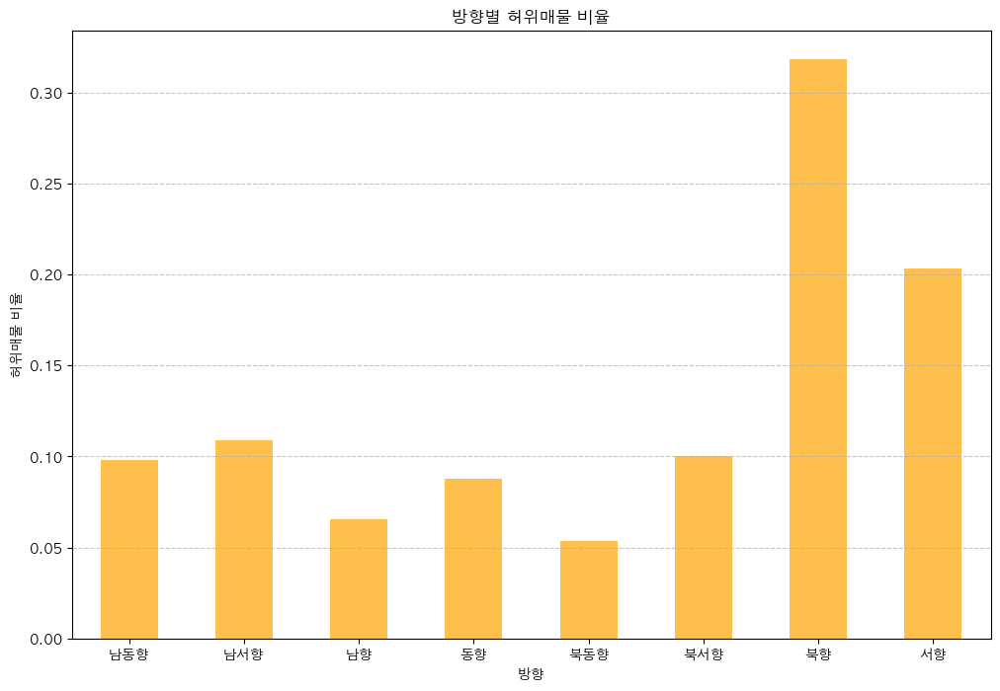

In [58]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby('방향')['허위매물여부'].mean()

plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', color='orange', alpha=0.7)

plt.xlabel('방향')
plt.ylabel('허위매물 비율')
plt.title('방향별 허위매물 비율')
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

<Figure size 2000x1500 with 0 Axes>

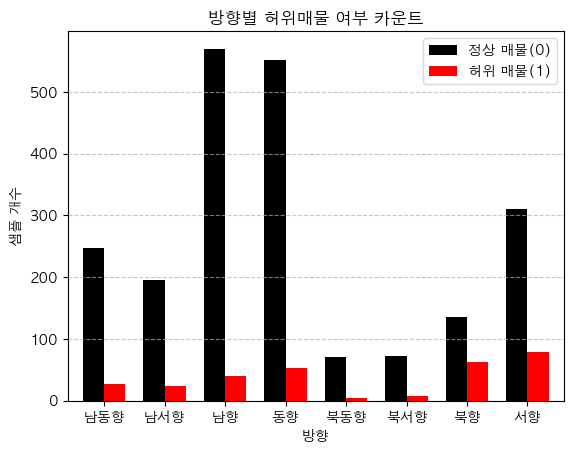

In [56]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby(['방향', '허위매물여부']).size().unstack(fill_value=0)

plt.figure(figsize=(20, 15))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

plt.xlabel('방향')
plt.ylabel('샘플 개수')
plt.title('방향별 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [291]:
train.방수.unique()

array([ 1.,  2., nan])

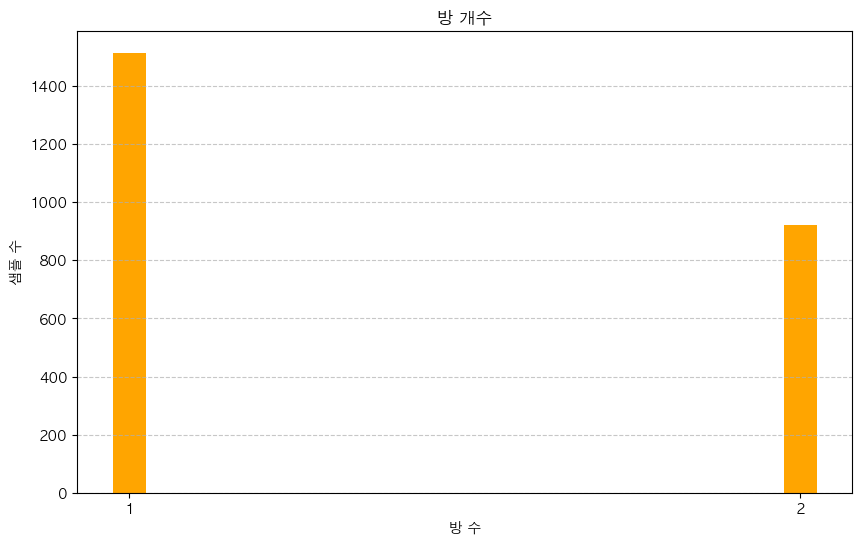

In [292]:
import pandas as pd
import matplotlib.pyplot as plt

room_counts = train['방수'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(room_counts.index, room_counts.values, color='orange', width = 0.05)
plt.xlabel('방 수')
plt.ylabel('샘플 수')
plt.title('방 개수')
plt.xticks(room_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [293]:
len(train[train.방수.isnull()])

16

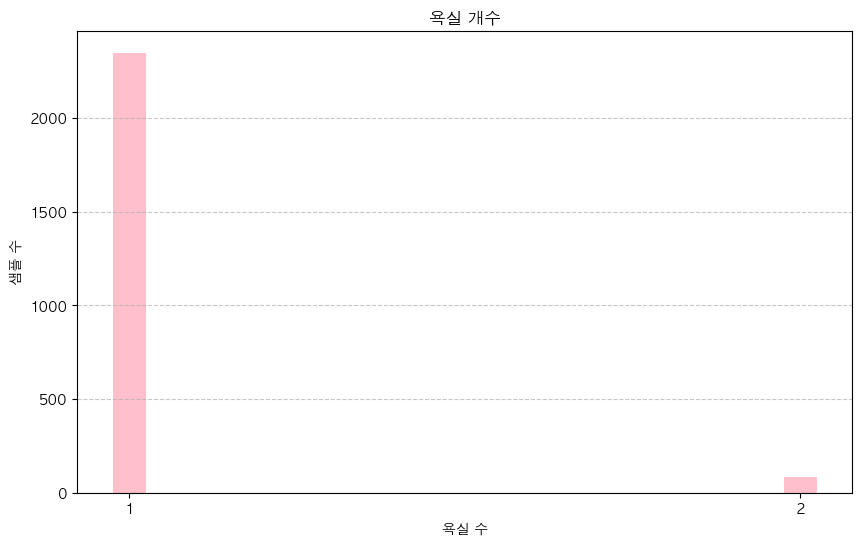

In [294]:
import pandas as pd
import matplotlib.pyplot as plt

room_counts = train['욕실수'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(room_counts.index, room_counts.values, color='pink', width = 0.05)
plt.xlabel('욕실 수')
plt.ylabel('샘플 수')
plt.title('욕실 개수')
plt.xticks(room_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [295]:
train.주차가능여부.value_counts()

주차가능여부
가능     1237
불가능    1215
Name: count, dtype: int64

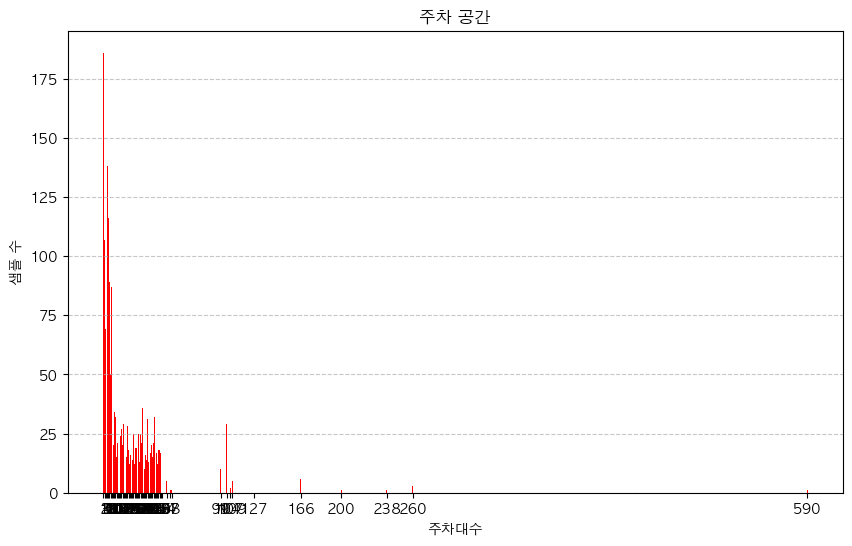

In [296]:
import pandas as pd
import matplotlib.pyplot as plt

parking_counts = train['총주차대수'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(parking_counts.index, parking_counts.values, color='red')
plt.xlabel('주차대수')
plt.ylabel('샘플 수')
plt.title('주차 공간')
plt.xticks(parking_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

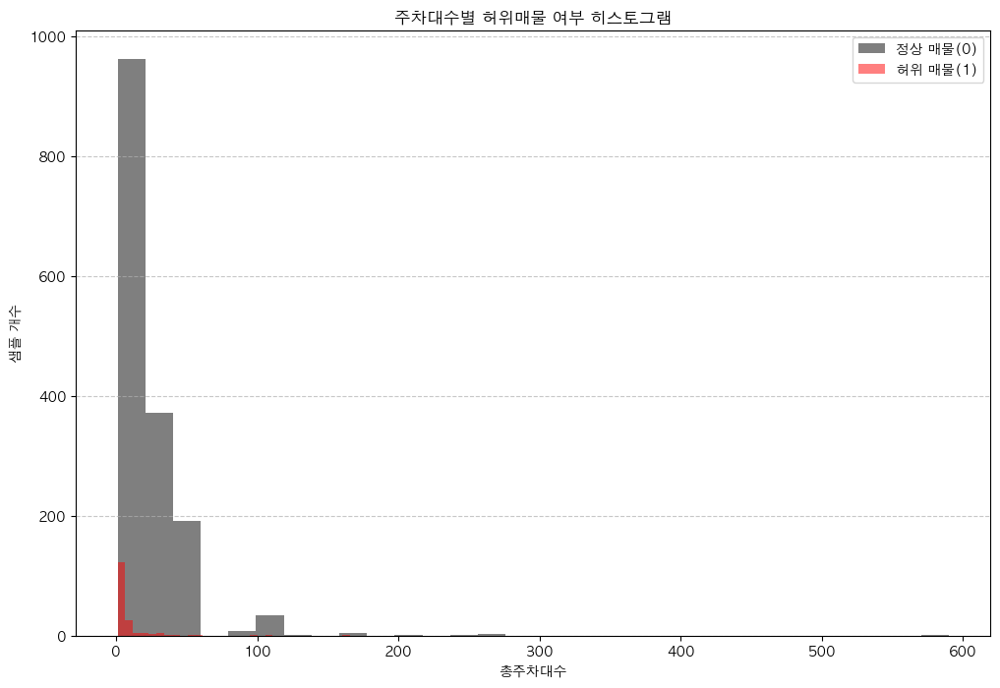

In [297]:
import matplotlib.pyplot as plt

normal_listings = train[train['허위매물여부'] == 0]['총주차대수']
fake_listings = train[train['허위매물여부'] == 1]['총주차대수']

# 히스토그램 그리기
plt.figure(figsize=(12, 8))
plt.hist(normal_listings, bins=30, alpha=0.5, color='black', label='정상 매물(0)')
plt.hist(fake_listings, bins=30, alpha=0.5, color='red', label='허위 매물(1)')

# 그래프 스타일 설정
plt.xlabel('총주차대수')
plt.ylabel('샘플 개수')
plt.title('주차대수별 허위매물 여부 히스토그램')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.show()

In [298]:
train.총주차대수.unique()

array([ 40.,  nan,  13.,   1.,  18.,   2.,  15.,  44.,  46.,   5.,  45.,
        27.,   7.,  34.,  16.,  10.,   8.,  48.,  43.,  38.,   3.,  21.,
        20.,  11.,  31.,   4.,  30.,  12.,  14., 104.,  17.,  50.,  41.,
        33.,   6.,  32.,  23.,  26., 109.,  25.,  19., 238.,   9.,  22.,
        42.,  39., 107.,  36.,  47., 166.,  37.,  28.,  24.,  29., 127.,
        99., 260.,  49.,  54.,  58.,  35., 590.,  57., 200.])

In [299]:
train.총주차대수.isnull().sum()

696

In [300]:
train[train.총주차대수==238.0]

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,층수비율
142,TRAIN_0142,서류확인,106000000.0,450000,17.5,9.0,21.0,남동향,1.0,1.0,가능,238.0,14,n74bA7B3O7,G플랫폼,2024-11-28,0,0.428571


<Figure size 1000x1500 with 0 Axes>

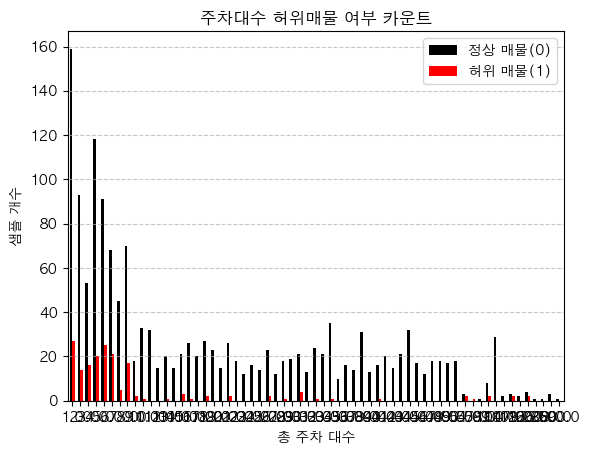

In [301]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby(['총주차대수', '허위매물여부']).size().unstack(fill_value=0)

# 바 차트 그리기
plt.figure(figsize=(10, 15))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

# 그래프 스타일 설정
plt.xlabel('총 주차 대수')
plt.ylabel('샘플 개수')
plt.title('주차대수 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.show()

In [302]:
train.관리비.unique()

array([96,  0, 10,  3,  5,  8,  1,  6, 14,  4,  7, 18, 19,  2, 13, 17, 11,
        9, 16, 15, 20, 12, 22, 46, 21, 25, 29, 23, 26])

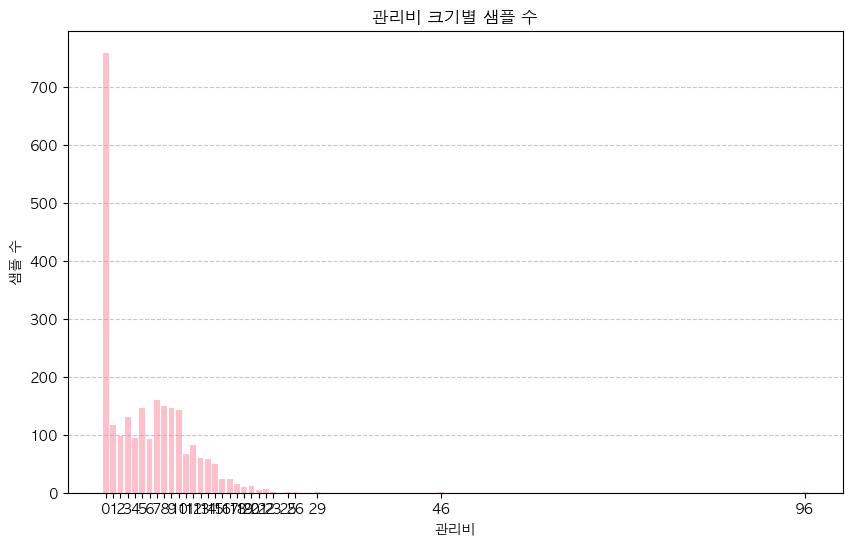

In [303]:
import pandas as pd
import matplotlib.pyplot as plt

manage_counts = train['관리비'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(manage_counts.index, manage_counts.values, color='pink')
plt.xlabel('관리비')
plt.ylabel('샘플 수')
plt.title('관리비 크기별 샘플 수')
plt.xticks(manage_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<Figure size 1000x1500 with 0 Axes>

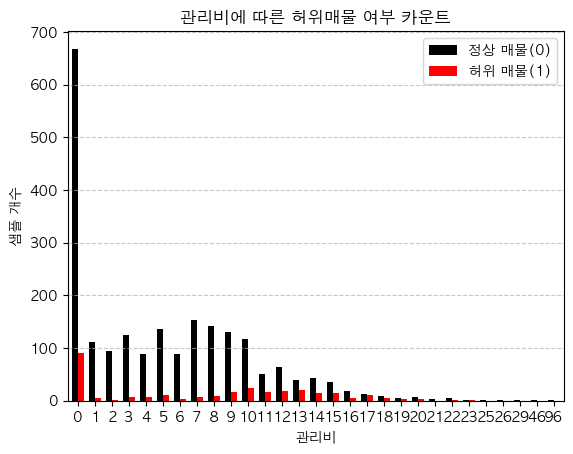

In [8]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby(['관리비', '허위매물여부']).size().unstack(fill_value=0)

# 바 차트 그리기
plt.figure(figsize=(10, 15))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

# 그래프 스타일 설정
plt.xlabel('관리비')
plt.ylabel('샘플 개수')
plt.title('관리비에 따른 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.show()

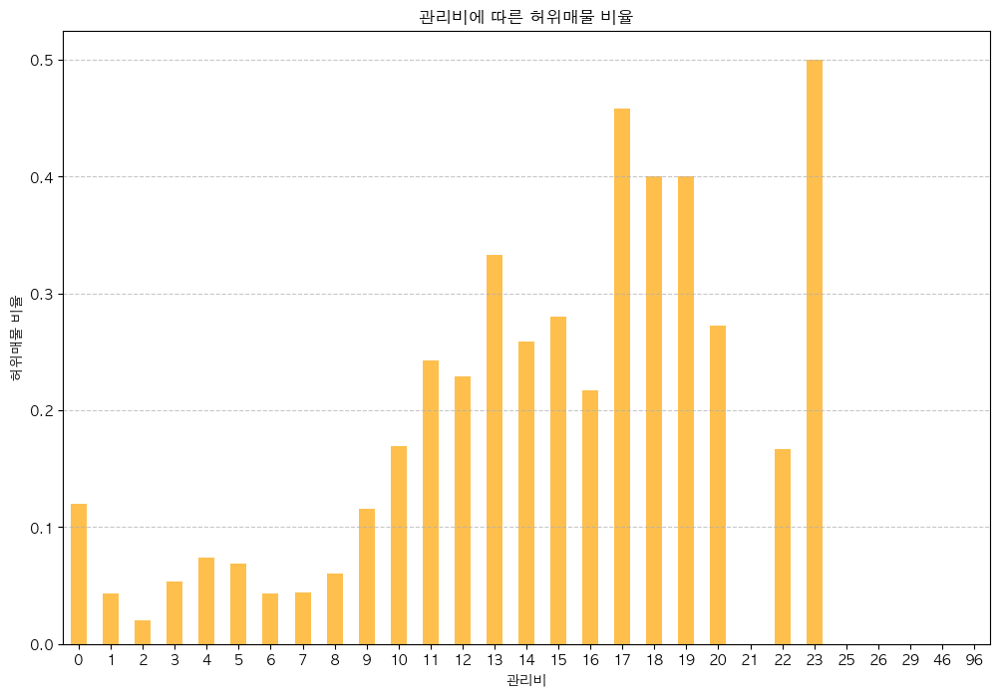

In [22]:
import matplotlib.pyplot as plt
import pandas as pd

# 관리비와 허위매물여부로 그룹화하여 전체 대비 허위매물 비율 계산
count_df = train.groupby('관리비')['허위매물여부'].mean()

# 그래프 그리기
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', color='orange', alpha=0.7)

# 그래프 스타일 설정
plt.xlabel('관리비')
plt.ylabel('허위매물 비율')
plt.title('관리비에 따른 허위매물 비율')
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.show()

In [305]:
len(train.중개사무소.unique())

279

In [306]:
grouped = train.groupby(['중개사무소', '허위매물여부']).count().iloc[:, :1]
grouped

ID
중개사무소      허위매물여부    
A06Nz2Z1R1 0        1
A18IU3D9M4 0        6
           1        1
A21Yr4B1U8 0        1
A24sf9I9O0 0        3
...                ..
z40LO7P9C9 1        3
z54Fl0B2P9 0       15
           1        8
z78FX7A1I1 0        1
z81HE4G4N5 0        2

[406 rows x 1 columns]

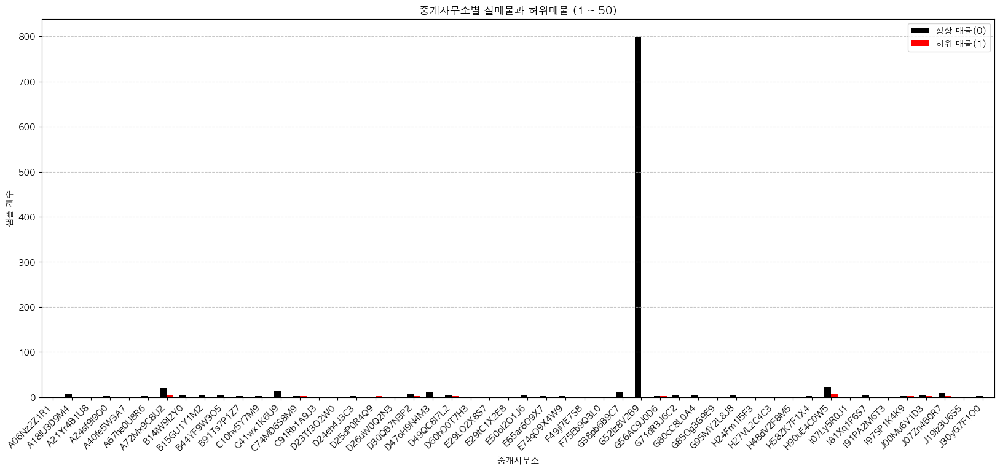

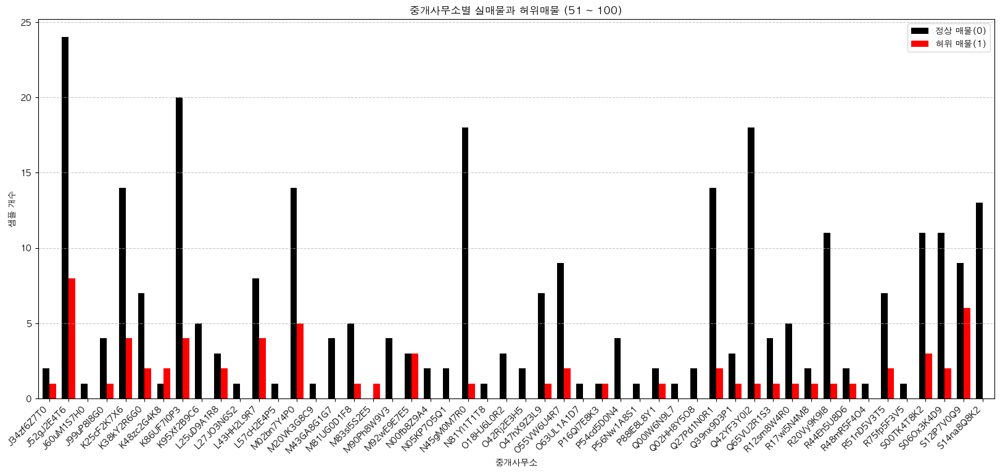

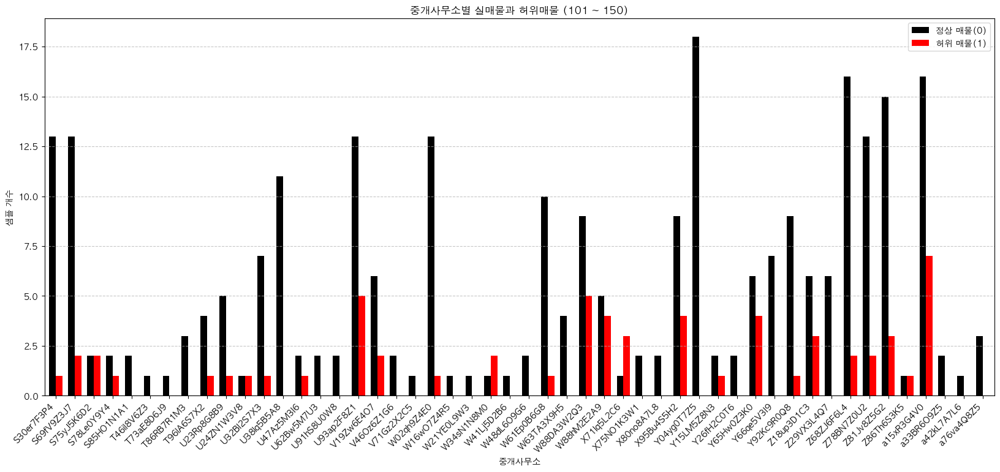

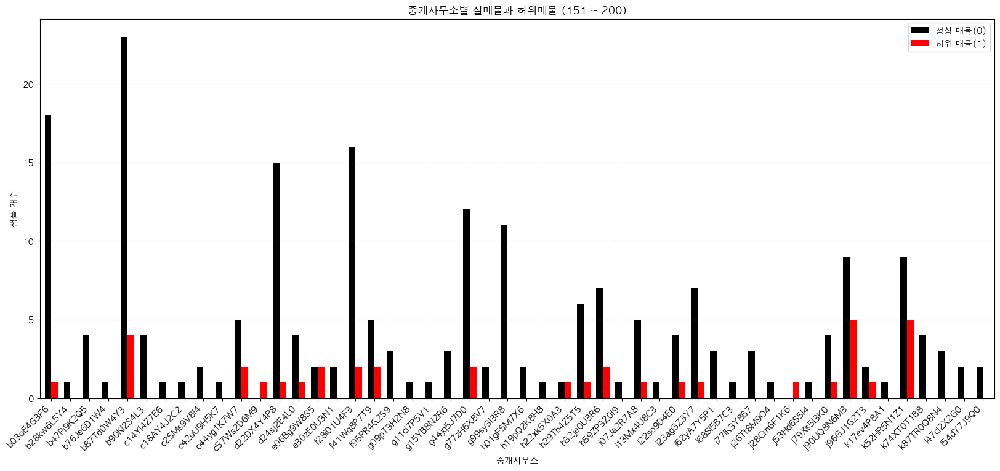

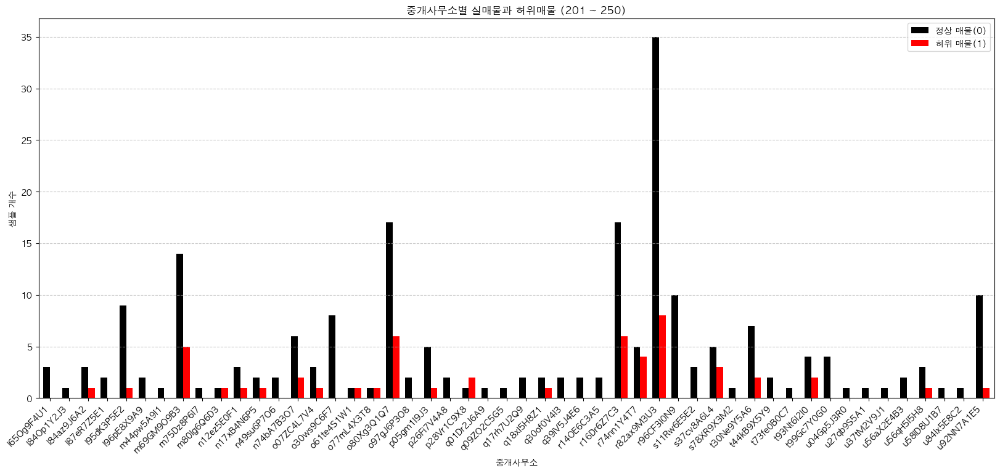

In [34]:
import matplotlib.pyplot as plt
import pandas as pd

# 중개사무소별 허위매물 여부 집계
estateAgent_df = train.groupby(['중개사무소', '허위매물여부']).size().unstack(fill_value=0)

# 정렬 (허위매물이 많은 순)
#estateAgent_df = estateAgent_df.sort_values(by=1, ascending=False)

# 한 번에 표시할 개수
batch_size = 50

# 전체 중개사무소 개수
num_agents = len(estateAgent_df)

# 50개씩 나누어 그래프 생성
for i in range(0, min(num_agents, batch_size * 5), batch_size):
    subset = estateAgent_df.iloc[i:i + batch_size]

    plt.figure(figsize=(20, 8))
    subset.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'], ax=plt.gca())

    plt.xlabel('중개사무소')
    plt.ylabel('샘플 개수')
    plt.title(f'중개사무소별 실매물과 허위매물 ({i + 1} ~ {min(i + batch_size, num_agents)})')
    plt.legend(['정상 매물(0)', '허위 매물(1)'])
    plt.xticks(rotation=45, ha="right")  # X축 라벨 회전
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()


In [35]:
len(train.제공플랫폼.unique())

13

In [36]:
train.groupby(['제공플랫폼', '허위매물여부']).count()

ID  매물확인방식  보증금   월세  전용면적  해당층   총층   방향   방수  욕실수  주차가능여부  \
제공플랫폼 허위매물여부                                                                 
A플랫폼  0       838     838  838  838   609  757  838  838  838  837     838   
      1       120     120  120  120    76   91  120  120  120  120     120   
B플랫폼  0       546     546  546  546   388  501  546  546  546  546     546   
      1        64      64   64   64    30   52   64   64   64   64      64   
C플랫폼  0       303     303  303  303   223  284  300  303  300  300     303   
      1        47      47   47   47    27   46   47   47   47   47      47   
D플랫폼  0       147     147  147  147    70  129  138  147  138  137     147   
      1        37      37   37   37     8   32   33   37   33   33      37   
E플랫폼  0       130     130  130  130    77  124  130  130  130  130     130   
      1        12      12   12   12     6   10   12   12   12   12      12   
F플랫폼  0        60      60   60   60    50   60   60   60   60   60      60   
      1         3       3    3    3     3    2    3    3    3    3       3   
G플랫폼  0        53      53   53   53    41   51   53   53   53   53      53   
      1         6       6    6    6     4    5    6    6    6    6       6   
H플랫폼  0        30      30   30   30    18   28   30   30   30   30      30   
      1         4       4    4    4     2    4    4    4    4    4       4   
I플랫폼  0        19      19   19   19    16   19   19   19   19   19      19   
      1         1       1    1    1     1    1    1    1    1    1       1   
J플랫폼  0        10      10   10   10     5    8   10   10   10   10      10   
      1         2       2    2    2     2    1    2    2    2    2       2   
K플랫폼  0         7       7    7    7     3    7    7    7    7    7       7   
      1         1       1    1    1     0    1    1    1    1    1       1   
L플랫폼  0         9       9    9    9     5    8    9    9    9    9       9   
      1         1       1    1    1     0    0    1    1    1    1       1   
M플랫폼  0         2       2    2    2     1    2    2    2    2    2       2   

              총주차대수  관리비  중개사무소  게재일  
제공플랫폼 허위매물여부                          
A플랫폼  0         638  838    838  838  
      1          79  120    120  120  
B플랫폼  0         331  546    546  546  
      1          30   64     64   64  
C플랫폼  0         253  303    303  303  
      1          33   47     47   47  
D플랫폼  0          92  147    147  147  
      1          11   37     37   37  
E플랫폼  0         110  130    130  130  
      1          11   12     12   12  
F플랫폼  0          54   60     60   60  
      1           2    3      3    3  
G플랫폼  0          47   53     53   53  
      1           5    6      6    6  
H플랫폼  0          22   30     30   30  
      1           2    4      4    4  
I플랫폼  0          14   19     19   19  
      1           0    1      1    1  
J플랫폼  0           6   10     10   10  
      1           2    2      2    2  
K플랫폼  0           3    7      7    7  
      1           0    1      1    1  
L플랫폼  0           9    9      9    9  
      1           1    1      1    1  
M플랫폼  0           1    2      2    2

In [37]:
train[train.허위매물여부==1] #298개

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
4,TRAIN_0004,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1
12,TRAIN_0012,전화확인,348500000.0,180000,23.14,2.0,5.0,동향,1.0,1.0,불가능,NaN,0,J30yG7F1O0,C플랫폼,2024-07-15,1
22,TRAIN_0022,현장확인,24500000.0,740000,29.50,7.0,8.0,남서향,1.0,1.0,가능,1.0,4,W88DA3W2Q3,A플랫폼,2024-05-12,1
31,TRAIN_0031,현장확인,132000000.0,540000,NaN,2.0,3.0,서향,1.0,1.0,불가능,NaN,8,Z18up3D1C3,A플랫폼,2024-07-10,1
47,TRAIN_0047,현장확인,76000000.0,700000,NaN,3.0,5.0,서향,1.0,1.0,불가능,NaN,6,m69GM9O9B3,B플랫폼,2023-12-19,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2408,TRAIN_2408,현장확인,81500000.0,310000,NaN,4.0,6.0,북향,2.0,1.0,불가능,4.0,13,j96GJ1G2T3,D플랫폼,2023-08-16,1
2411,TRAIN_2411,현장확인,341000000.0,550000,NaN,5.0,6.0,남서향,1.0,1.0,불가능,NaN,15,S12iP7V0Q9,A플랫폼,2024-06-18,1
2415,TRAIN_2415,현장확인,26500000.0,570000,NaN,3.0,4.0,북동향,2.0,1.0,불가능,NaN,0,D25dP0R4Q9,D플랫폼,2024-05-06,1
2418,TRAIN_2418,전화확인,343000000.0,470000,21.70,2.0,7.0,남향,1.0,1.0,불가능,NaN,14,a15xR3G4V0,A플랫폼,2024-07-04,1


In [38]:
train[(train.허위매물여부==1)&(train.전용면적.isnull())] #139개

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
4,TRAIN_0004,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1
31,TRAIN_0031,현장확인,132000000.0,540000,NaN,2.0,3.0,서향,1.0,1.0,불가능,NaN,8,Z18up3D1C3,A플랫폼,2024-07-10,1
47,TRAIN_0047,현장확인,76000000.0,700000,NaN,3.0,5.0,서향,1.0,1.0,불가능,NaN,6,m69GM9O9B3,B플랫폼,2023-12-19,1
93,TRAIN_0093,전화확인,403500000.0,540000,NaN,4.0,5.0,동향,2.0,1.0,가능,5.0,0,Y65Hw0Z3K0,A플랫폼,2024-05-01,1
106,TRAIN_0106,현장확인,12500000.0,470000,NaN,NaN,7.0,동향,2.0,1.0,가능,5.0,14,f41Wq8P7T9,A플랫폼,2024-03-30,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2392,TRAIN_2392,현장확인,130000000.0,250000,NaN,6.0,6.0,남향,1.0,1.0,불가능,NaN,17,W88hM2E2A9,C플랫폼,2024-04-15,1
2403,TRAIN_2403,현장확인,70000000.0,410000,NaN,3.0,4.0,북향,2.0,1.0,불가능,NaN,0,r16Dr6Z7C3,G플랫폼,2024-06-23,1
2408,TRAIN_2408,현장확인,81500000.0,310000,NaN,4.0,6.0,북향,2.0,1.0,불가능,4.0,13,j96GJ1G2T3,D플랫폼,2023-08-16,1
2411,TRAIN_2411,현장확인,341000000.0,550000,NaN,5.0,6.0,남서향,1.0,1.0,불가능,NaN,15,S12iP7V0Q9,A플랫폼,2024-06-18,1


In [39]:
train.전용면적.isnull().sum()

787

In [35]:
import pandas as pd

df_office = train.groupby('중개사무소').agg(
    허위매물비율=('허위매물여부', 'mean'),
    전체매물수=('허위매물여부', 'count')
).sort_values(by='허위매물비율', ascending=False).head(20)

df_office

,허위매물비율,전체매물수
중개사무소,,
c57Ws2D6M9,1.000000,1
A40fe5W3A7,1.000000,1
j28Cm6F1K6,1.000000,1
M83sI5S2E5,1.000000,1
H48dV2F8M5,1.000000,1
X71Iq5L2C6,0.750000,4
D25dP0R4Q9,0.750000,4
W34sN1N8M0,0.666667,3
K48zc2G4K8,0.666667,3


## 임대유형

In [31]:
def categorize_rental(row):
    if row['월세'] == 0:
        return '전세'
    elif row['월세'] * 240 < row['보증금']:
        return '반전세'
    else:
        return '월세'
    

train['임대유형'] = train.apply(categorize_rental, axis=1)
train.head()

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,임대유형
0,TRAIN_0000,현장확인,402500000.0,470000,NaN,NaN,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,반전세
1,TRAIN_0001,현장확인,170500000.0,200000,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0,반전세
2,TRAIN_0002,전화확인,114000000.0,380000,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0,반전세
3,TRAIN_0003,현장확인,163500000.0,30000,36.3,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,반전세
4,TRAIN_0004,현장확인,346000000.0,530000,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1,반전세


<Figure size 2000x1500 with 0 Axes>

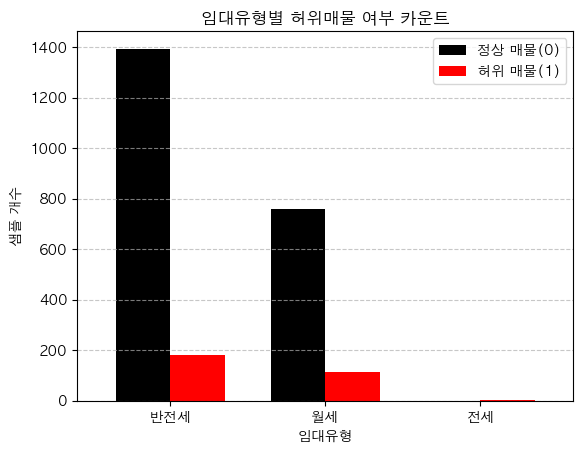

In [32]:
import matplotlib.pyplot as plt
import pandas as pd

count_df = train.groupby(['임대유형', '허위매물여부']).size().unstack(fill_value=0)

# 바 차트 그리기
plt.figure(figsize=(20, 15))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

# 그래프 스타일 설정
plt.xlabel('임대유형')
plt.ylabel('샘플 개수')
plt.title('임대유형별 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.show()

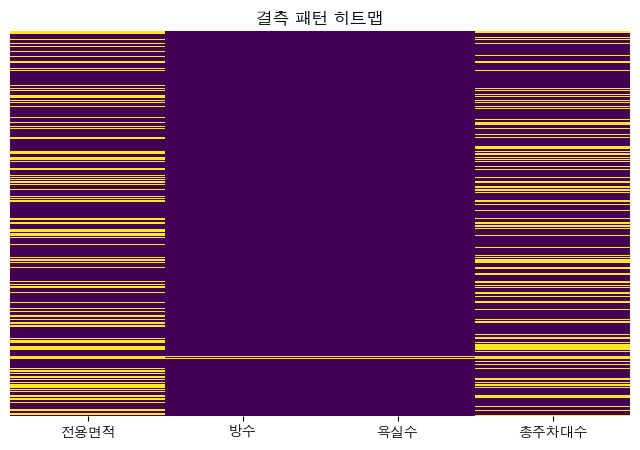

In [40]:
# 결측 여부 히트맵
plt.figure(figsize=(8,5))
sns.heatmap(train[['전용면적', '방수', '욕실수', '총주차대수']].isnull(), cmap="viridis", cbar=False, yticklabels=False)
plt.title("결측 패턴 히트맵")
plt.show()

**-------------------------------------------------------------------------------------------------------------------------------**

## 이상치 분석

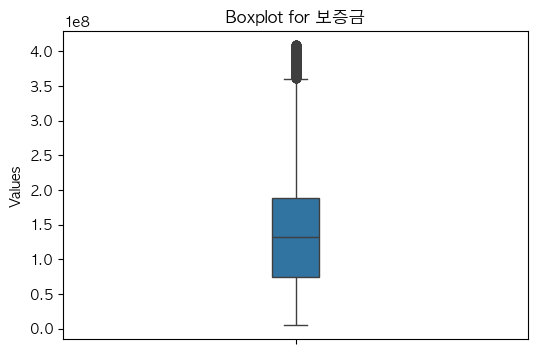

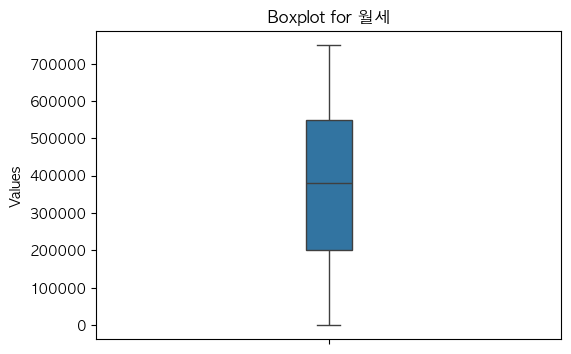

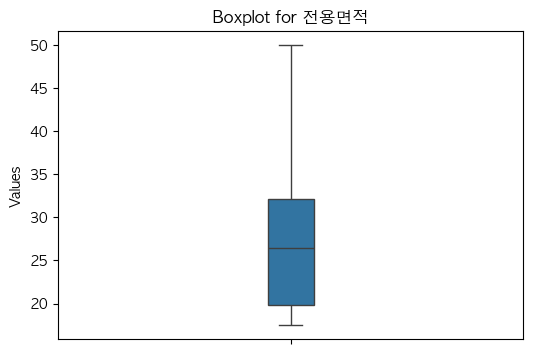

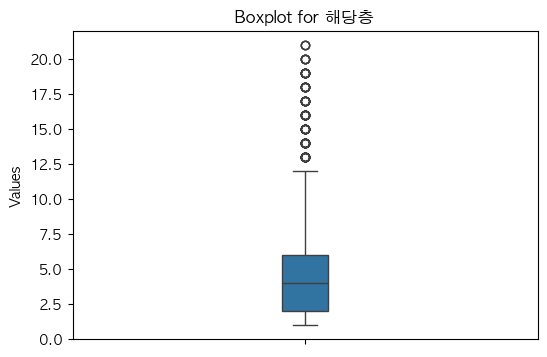

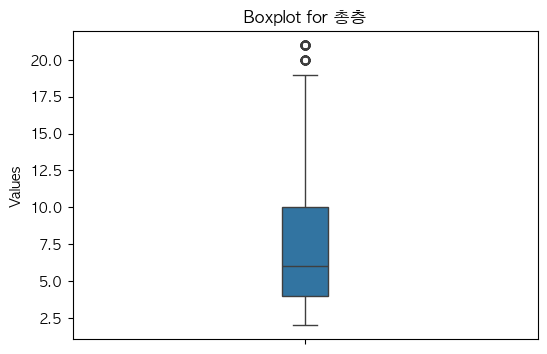

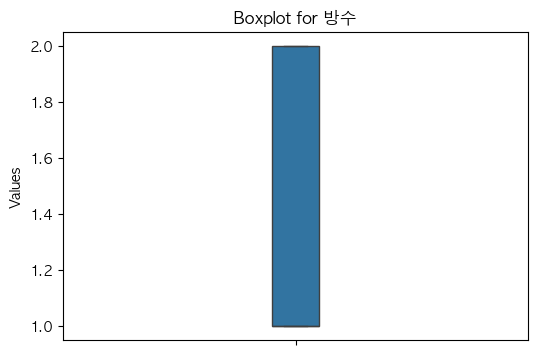

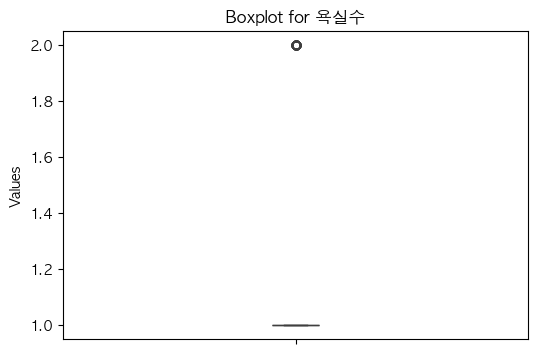

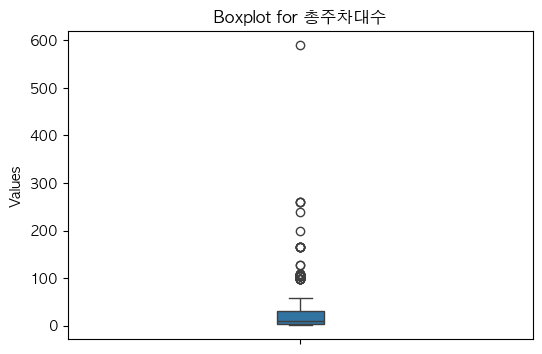

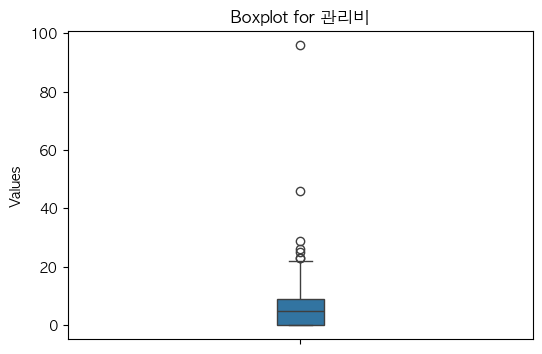

In [41]:
# 데이터 타입 변환 (숫자형 유지, 범주형은 제거)
df = train.drop(['허위매물여부'], axis = 1)
df_numeric = df.select_dtypes(include=[np.number])

# 각 컬럼별로 Boxplot 그리기
for col in df_numeric.columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df_numeric[col], width=0.1)
    plt.title(f"Boxplot for {col}")
    plt.ylabel("Values")
    plt.show()

## 상관관계 분석

먼저, 목표변수와 큰 상관관계를 이루는 변수들을 알아보기 위해 목표변수를 포함해서 히트맵을 시각화합니다.

단순하게 상관관계를 빠르게 확인하기 위함이므로 결측치를 모두 제거하고 진행합니다.

In [42]:
train = pd.read_csv('./data/train.csv')

In [43]:
ttrain = train.copy() #ttrain은 모든 결측치 있는 샘플 제거

In [44]:
ttrain["보증금"] = ttrain["보증금"] / 10000
ttrain["월세"] = ttrain["월세"] / 10000

In [45]:
ttrain = ttrain.dropna()
ttrain

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부
3,TRAIN_0003,현장확인,16350.0,3.0,36.30,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0
8,TRAIN_0008,현장확인,12050.0,44.0,31.55,1.0,2.0,북향,2.0,2.0,가능,18.0,3,G52Iz8V2B9,B플랫폼,2024-05-23,0
9,TRAIN_0009,현장확인,7950.0,26.0,39.66,2.0,3.0,남동향,2.0,1.0,불가능,2.0,0,M90Ph8W9V3,B플랫폼,2024-11-30,0
10,TRAIN_0010,현장확인,18750.0,39.0,23.69,1.0,15.0,남향,1.0,1.0,불가능,15.0,5,G52Iz8V2B9,A플랫폼,2023-12-16,0
11,TRAIN_0011,서류확인,9150.0,75.0,31.32,9.0,15.0,북동향,2.0,2.0,가능,44.0,8,G52Iz8V2B9,B플랫폼,2024-03-25,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2441,TRAIN_2441,현장확인,13650.0,55.0,19.80,3.0,6.0,남향,1.0,1.0,불가능,4.0,2,l84az9J6A2,C플랫폼,2024-05-13,1
2442,TRAIN_2442,현장확인,8350.0,65.0,29.26,3.0,17.0,남동향,1.0,1.0,가능,27.0,16,G52Iz8V2B9,C플랫폼,2024-10-10,0
2444,TRAIN_2444,현장확인,3100.0,37.0,17.50,2.0,7.0,남서향,1.0,1.0,가능,50.0,0,G52Iz8V2B9,A플랫폼,2024-08-27,0
2449,TRAIN_2449,전화확인,32900.0,61.0,17.50,8.0,20.0,남서향,1.0,1.0,가능,29.0,10,G52Iz8V2B9,B플랫폼,2024-05-15,0


In [414]:
ttrain.isnull().sum() #확인용

ID        0
매물확인방식    0
보증금       0
월세        0
전용면적      0
해당층       0
총층        0
방향        0
방수        0
욕실수       0
주차가능여부    0
총주차대수     0
관리비       0
중개사무소     0
제공플랫폼     0
게재일       0
허위매물여부    0
dtype: int64

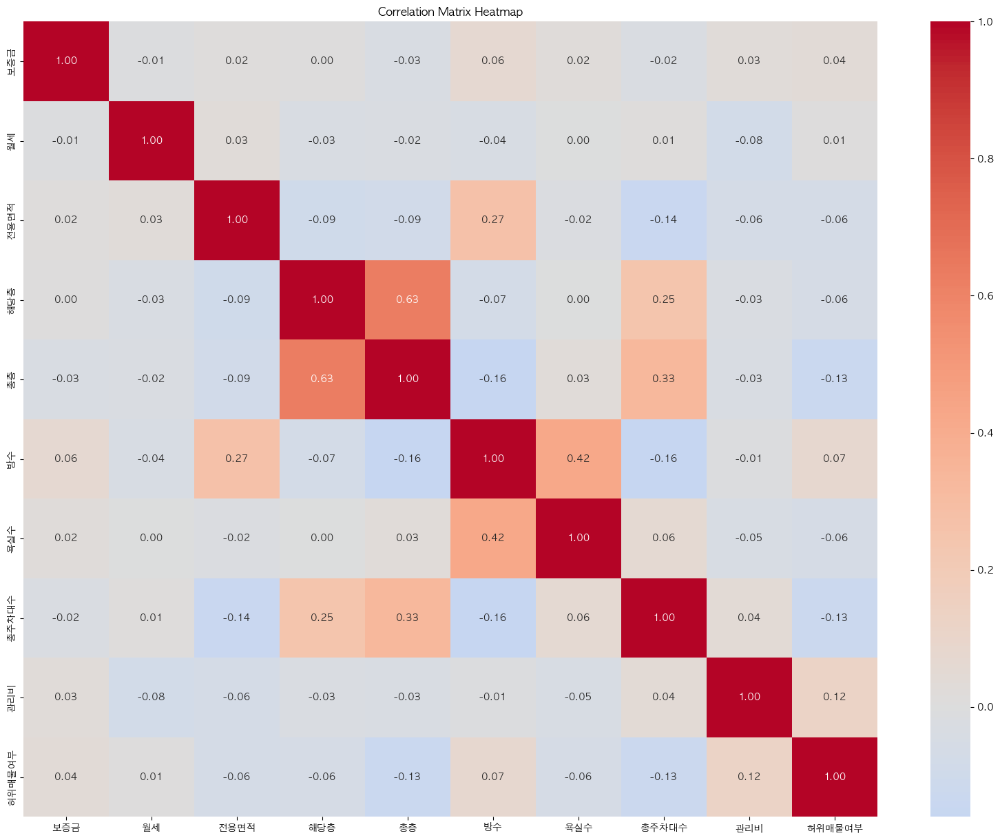

In [415]:
ttrain_cor_df = ttrain.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr()

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/correlation_matrix_heatmap_pearson_250201.png", dpi=300, bbox_inches='tight')
plt.show()

모든 변수들이 허위매물 여부를 강하게 설명하지 못하고 있어, 단순한 선형 상관관계로 허위매물을 판별하기 어렵습니다. 따라서 Feature Transformation을 통해 의미 있는 컬럼을 만들어야 합니다.

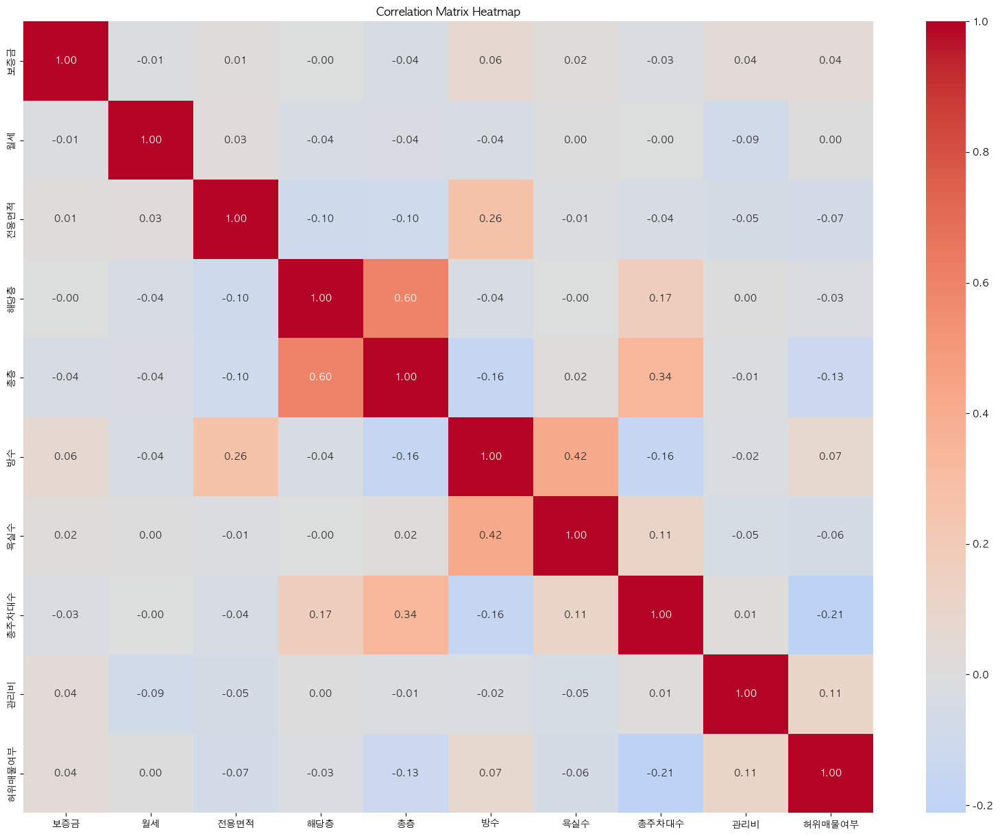

In [416]:
ttrain_cor_df = ttrain.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr(method='spearman')

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/correlation_matrix_heatmap_spearman_250201.png", dpi=300, bbox_inches='tight')
plt.show()

## 추가 분석

In [167]:
ttrain2 = train.copy() #ttrain2는 새로운 컬럼을 만들고 분석하기 위함

In [168]:
ttrain2["보증금"] = ttrain2["보증금"] / 10000
ttrain2["월세"] = ttrain2["월세"] / 10000

In [169]:
ttrain2['월세+관리비'] = ttrain2.월세 + ttrain2.관리비
min_cost = ttrain2['월세+관리비'].min()
ttrain2[ttrain2['월세+관리비'] == min_cost]

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,월세+관리비
725,TRAIN_0725,서류확인,36400.0,0.0,17.50,10.0,16.0,북동향,1.0,1.0,가능,34.0,0,R17wi5N4M8,D플랫폼,2024-05-19,1,0.0
809,TRAIN_0809,현장확인,10850.0,0.0,18.87,NaN,16.0,동향,1.0,1.0,가능,54.0,0,G38pb6B9C7,C플랫폼,2024-07-16,1,0.0
1305,TRAIN_1305,현장확인,1800.0,0.0,17.50,NaN,17.0,남동향,1.0,1.0,가능,99.0,0,y86qM5T6T6,A플랫폼,2024-05-16,1,0.0


In [ ]:
ttrain2["보증금_월세관리비_비율"] = 

In [170]:
ttrain2.게재일.min(), ttrain2.게재일.max()

('2023-04-28', '2025-03-03')

In [171]:
ttrain2['게재일'] = pd.to_datetime(ttrain2['게재일'])
ttrain2['게재월'] = ttrain2['게재일'].dt.month
ttrain2

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,월세+관리비,게재월
0,TRAIN_0000,현장확인,40250.0,47.0,NaN,NaN,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,143.0,10
1,TRAIN_0001,현장확인,17050.0,20.0,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0,20.0,12
2,TRAIN_0002,전화확인,11400.0,38.0,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0,38.0,11
3,TRAIN_0003,현장확인,16350.0,3.0,36.30,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,13.0,11
4,TRAIN_0004,현장확인,34600.0,53.0,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1,53.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,TRAIN_2447,서류확인,15900.0,55.0,48.95,3.0,3.0,남향,2.0,1.0,불가능,NaN,0,d22DX4Y4P8,B플랫폼,2024-11-16,0,55.0,11
2448,TRAIN_2448,서류확인,15850.0,75.0,NaN,2.0,4.0,남향,1.0,1.0,불가능,NaN,2,g99sy3I3R8,A플랫폼,2024-10-06,0,77.0,10
2449,TRAIN_2449,전화확인,32900.0,61.0,17.50,8.0,20.0,남서향,1.0,1.0,가능,29.0,10,G52Iz8V2B9,B플랫폼,2024-05-15,0,71.0,5
2450,TRAIN_2450,현장확인,3100.0,40.0,22.87,8.0,9.0,남동향,2.0,1.0,가능,NaN,8,m69GM9O9B3,B플랫폼,2024-08-06,0,48.0,8


<Figure size 1000x500 with 0 Axes>

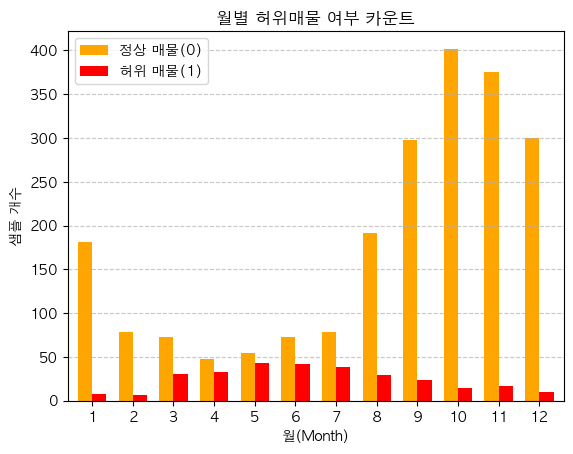

In [172]:
import matplotlib.pyplot as plt
import pandas as pd

# 월별 허위매물 여부(0, 1) 카운트
count_df = ttrain2.groupby(['게재월', '허위매물여부']).size().unstack(fill_value=0)

# 바 차트 그리기
plt.figure(figsize=(10, 5))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['orange', 'red'])

# 그래프 스타일 설정
plt.xlabel('월(Month)')
plt.ylabel('샘플 개수')
plt.title('월별 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.show()

보통 이사를 많이 하는 봄 여름 가을, 특히 봄 여름에 허위매물이 더 많은 경향을 보입니다.

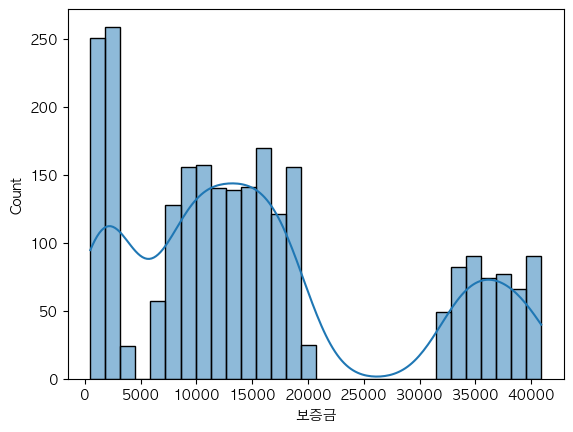

In [173]:
sns.histplot(ttrain2['보증금'], bins=30, kde=True)
plt.show()

보증금 데이터를 보면 이중 봉우리를 보이고 있다. 즉, 2개의 주요 그룹이 있는 분포로 볼 수 있다.

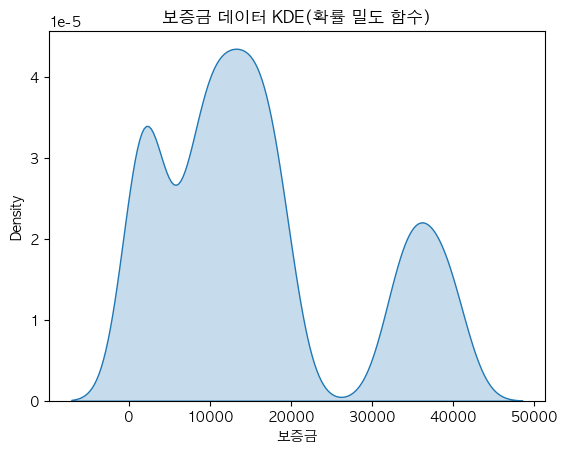

In [174]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.kdeplot(ttrain2['보증금'], fill=True)
plt.title("보증금 데이터 KDE(확률 밀도 함수)")
plt.show()


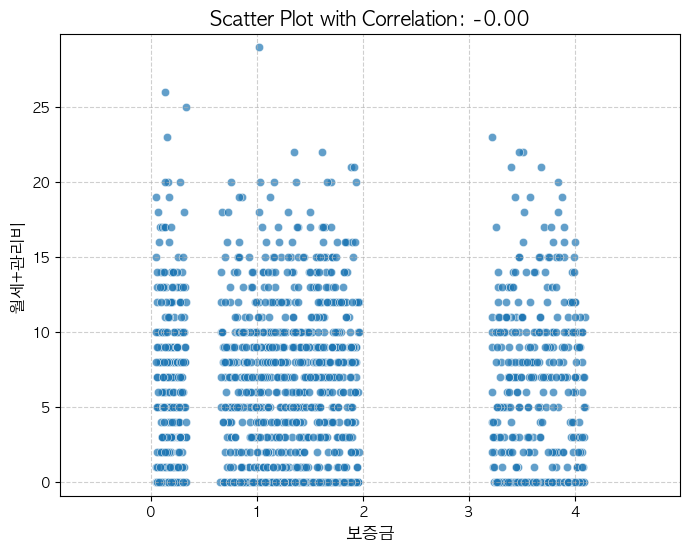

In [445]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ttrain3["log_보증금"] = np.log1p(ttrain3["보증금"])  # log1p(x) = log(x + 1) (0 값 방지)
# ttrain3["log_월세+관리비"] = np.log1p(ttrain3["월세+관리비"])

x_min, x_max = ttrain3["보증금"].min(), ttrain3["보증금"].max()
y_min, y_max = ttrain3["월세+관리비"].min(), ttrain3["월세+관리비"].max()

# 산점도 시각화
plt.figure(figsize=(8, 6))
sns.scatterplot(x=ttrain3["보증금"], y=ttrain3["월세+관리비"], alpha=0.7)

ttrain_cor_df = ttrain3.select_dtypes(include=[np.number])
corr = ttrain_cor_df.corr().iloc[0, 1]

plt.title(f"Scatter Plot with Correlation: {corr:.2f}", fontsize=14)
plt.xlabel("보증금", fontsize=12)
plt.ylabel("월세+관리비", fontsize=12)
plt.xlim(x_min-0.9, x_max+0.9)
plt.ylim(y_min-0.9, y_max+0.9)

plt.grid(True, linestyle="--", alpha=0.6)
plt.savefig('./image/보증금_월세관리비산점도.png')
plt.show()

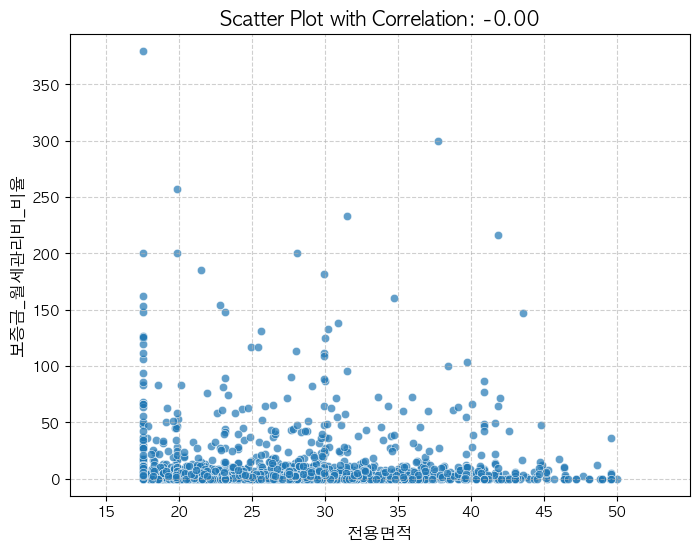

In [440]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ttrain3["log_전용면적"] = np.log1p(ttrain3["전용면적"])  # log1p(x) = log(x + 1) (0 값 방지)
# ttrain3["보증금_월세관리비_비율"] = ttrain3["월세+관리비"]/ttrain3["보증금"]
# ttrain3["log_보증금_월세관리비_비율"] = np.log1p(ttrain3["보증금_월세관리비_비율"])

x_min, x_max = ttrain3["전용면적"].min(), ttrain3["전용면적"].max()
y_min, y_max = ttrain3["보증금_월세관리비_비율"].min(), ttrain3["보증금_월세관리비_비율"].max()

# 산점도 시각화
plt.figure(figsize=(8, 6))
sns.scatterplot(x=ttrain3["전용면적"], y=ttrain3["보증금_월세관리비_비율"], alpha=0.7)

ttrain_cor_df = ttrain3.select_dtypes(include=[np.number])
corr = ttrain_cor_df.corr().iloc[0, 1]

plt.title(f"Scatter Plot with Correlation: {corr:.2f}", fontsize=14)
plt.xlabel("전용면적", fontsize=12)
plt.ylabel("보증금_월세관리비_비율", fontsize=12)

plt.xlim(x_min-5, x_max+5)
plt.ylim(y_min-15, y_max+15)

plt.grid(True, linestyle="--", alpha=0.6)
plt.savefig('./image/전용면적_보증금월세관리비비율산점도.png')
plt.show()

In [55]:
correlation_pearson = ttrain2[['보증금', '월세+관리비']].corr(method='pearson')
print(correlation_pearson)


             보증금    월세+관리비
보증금     1.000000  0.023502
월세+관리비  0.023502  1.000000


In [56]:
correlation_spearman = ttrain2[['보증금', '월세+관리비']].corr(method='spearman')
print(correlation_spearman)


             보증금    월세+관리비
보증금     1.000000  0.020039
월세+관리비  0.020039  1.000000


박스플롯에서 보증금이 크든 작든 월세의 분포가 거의 동일하고, 피어슨 상관계수와 스피어만 상관계수 모두 계산한 결과 0에 가까우므로 결론적으로 데이터 상에서 보증금이 크다고 해서 월세가 반드시 낮아지거나, 보증금이 작다고 해서 월세가 높아지는 것은 아니다라는 결과가 나왔는데 이는 현 실상과 다르다. **지역 정보가 빠져 있기 때문에 지역별 시세 차이가 반영되지 않고 섞여버려서 전체적으로 데이터가 희석되었을 수 있다. 또 소형 매물의 경우, 보증금 대비 월 부담금 비율이 전용면적과 무관하거나 정비례할 수 있기에 위와 같은 시각화 결과가 나타난 것으로 보인다.**

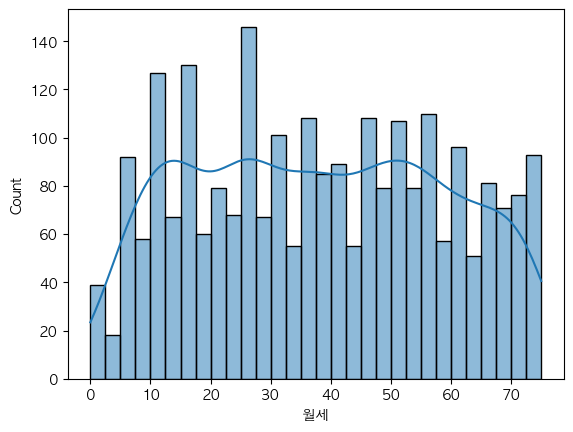

In [57]:
sns.histplot(ttrain2['월세'], bins=30, kde=True)
plt.show()

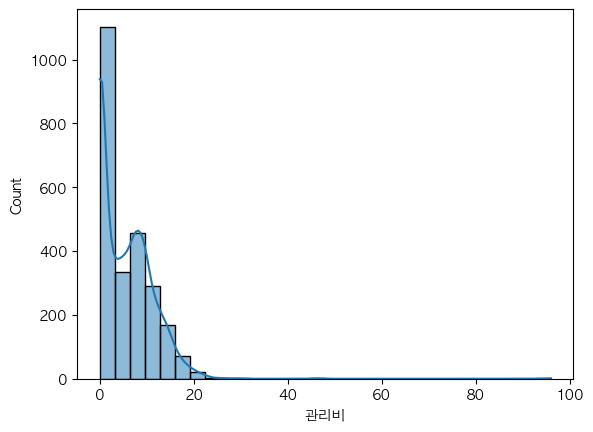

In [58]:
sns.histplot(ttrain2['관리비'], bins=30, kde=True)
plt.show()

### 산점도 분석

<Figure size 1000x500 with 0 Axes>

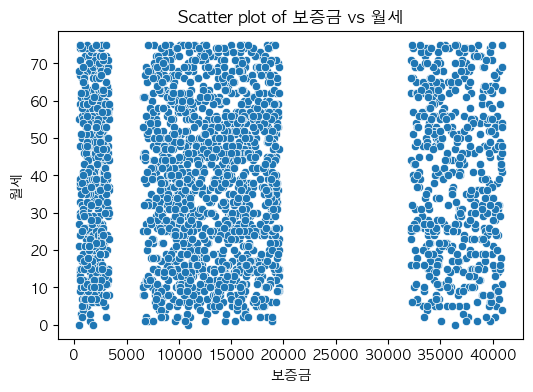

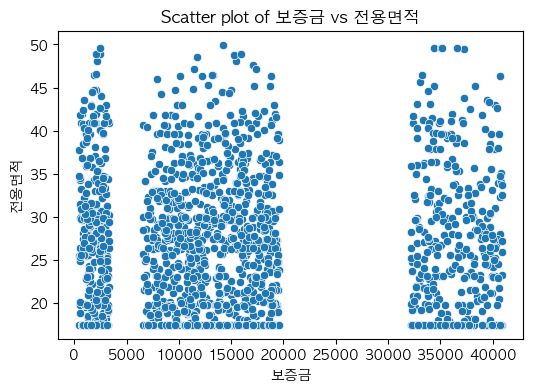

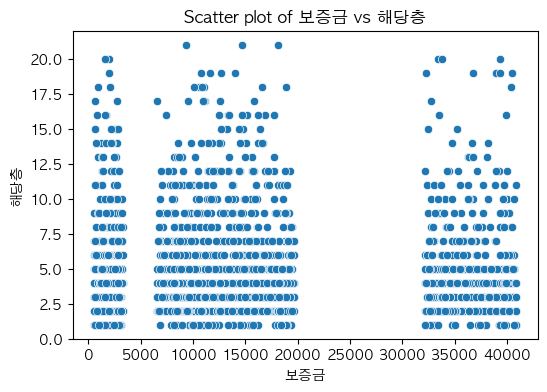

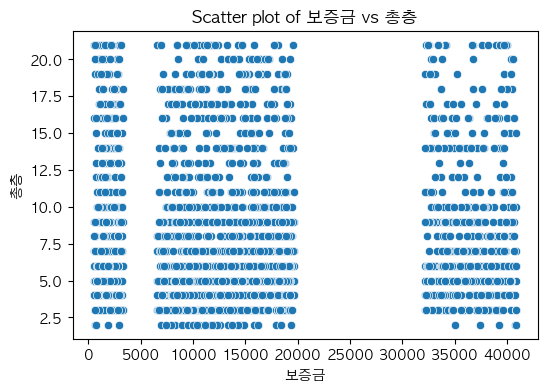

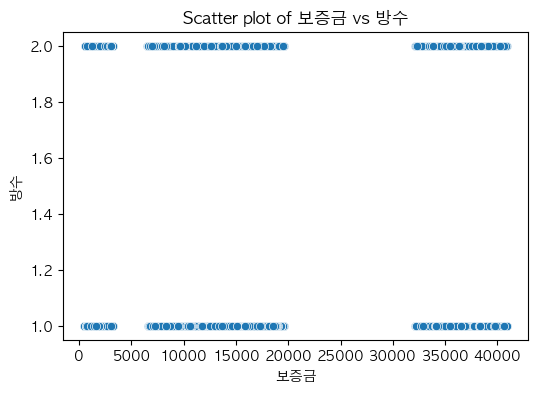

...

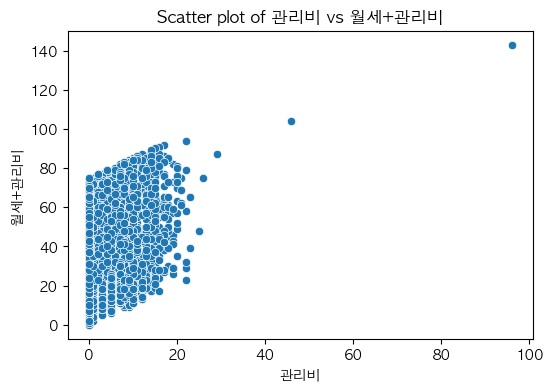

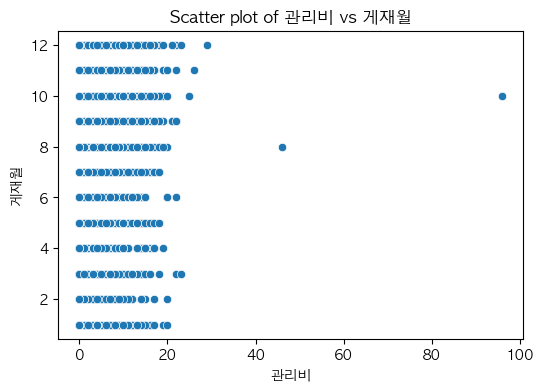

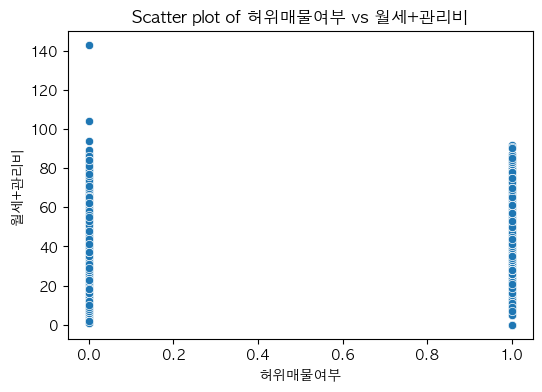

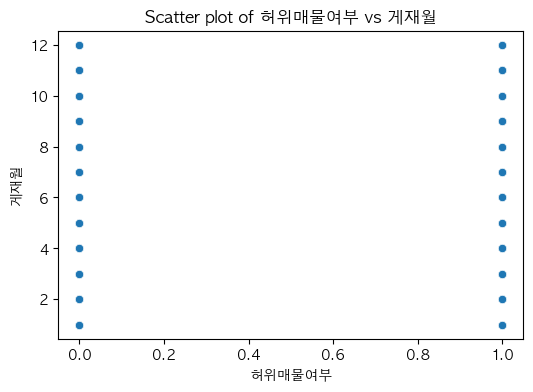

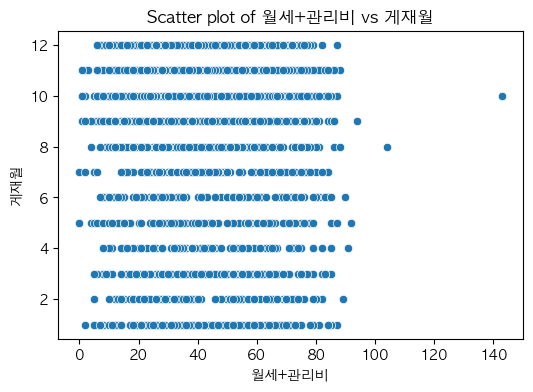

In [431]:
import itertools
import seaborn as sns
import matplotlib.pyplot as plt

# 사용할 컬럼 리스트 (숫자형 변수만 선택)
numeric_cols = ttrain2.select_dtypes(include=['number']).columns

# 컬럼 두 개씩 묶어서 조합 생성
combinations = list(itertools.combinations(numeric_cols, 2))

# 시각화
plt.figure(figsize=(10, 5))  # 기본 figure 사이즈 설정

for i, (col1, col2) in enumerate(combinations):
    plt.figure(figsize=(6, 4))  # 개별 figure 설정
    sns.scatterplot(x=ttrain2[col1], y=ttrain2[col2])
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(f'Scatter plot of {col1} vs {col2}')
    plt.show()  # 그래프 출력


나중에 지역 클러스틀 이용해서 산점도의 색상을 표현하면 시각적으로 데이터의 특징을 파악하기 좋을 것 같음

In [432]:
# ttrain2['보증금_월세관리비_비율'] = ttrain2['월세+관리비'] / ttrain2['보증금']
# ttrain2['전용면적_가격_비율'] = ttrain2['보증금_월세관리비_비율'] / ttrain2['전용면적']
# ttrain2

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,월세+관리비,게재월,보증금_월세관리비_비율,전용면적_가격_비율
0,TRAIN_0000,현장확인,40250.0,47.0,NaN,NaN,15.0,서향,1.0,1.0,가능,40.0,96,t93Nt6I2I0,B플랫폼,2024-10-09,0,143.0,10,0.003553,NaN
1,TRAIN_0001,현장확인,17050.0,20.0,NaN,3.0,4.0,남동향,2.0,1.0,불가능,NaN,0,q39iV5J4E6,D플랫폼,2024-12-26,0,20.0,12,0.001173,NaN
2,TRAIN_0002,전화확인,11400.0,38.0,NaN,2.0,3.0,동향,1.0,1.0,불가능,NaN,0,b03oE4G3F6,A플랫폼,2024-11-28,0,38.0,11,0.003333,NaN
3,TRAIN_0003,현장확인,16350.0,3.0,36.30,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,13.0,11,0.000795,0.000022
4,TRAIN_0004,현장확인,34600.0,53.0,NaN,3.0,3.0,동향,2.0,1.0,불가능,NaN,0,N45gM0M7R0,B플랫폼,2024-06-25,1,53.0,6,0.001532,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,TRAIN_2447,서류확인,15900.0,55.0,48.95,3.0,3.0,남향,2.0,1.0,불가능,NaN,0,d22DX4Y4P8,B플랫폼,2024-11-16,0,55.0,11,0.003459,0.000071
2448,TRAIN_2448,서류확인,15850.0,75.0,NaN,2.0,4.0,남향,1.0,1.0,불가능,NaN,2,g99sy3I3R8,A플랫폼,2024-10-06,0,77.0,10,0.004858,NaN
2449,TRAIN_2449,전화확인,32900.0,61.0,17.50,8.0,20.0,남서향,1.0,1.0,가능,29.0,10,G52Iz8V2B9,B플랫폼,2024-05-15,0,71.0,5,0.002158,0.000123
2450,TRAIN_2450,현장확인,3100.0,40.0,22.87,8.0,9.0,남동향,2.0,1.0,가능,NaN,8,m69GM9O9B3,B플랫폼,2024-08-06,0,48.0,8,0.015484,0.000677


### 컬럼 추가 후 상관관계 히트맵
- 월세 + 관리비
- 보증금 / 월세 + 관리비 (로그변환)
- 게재월

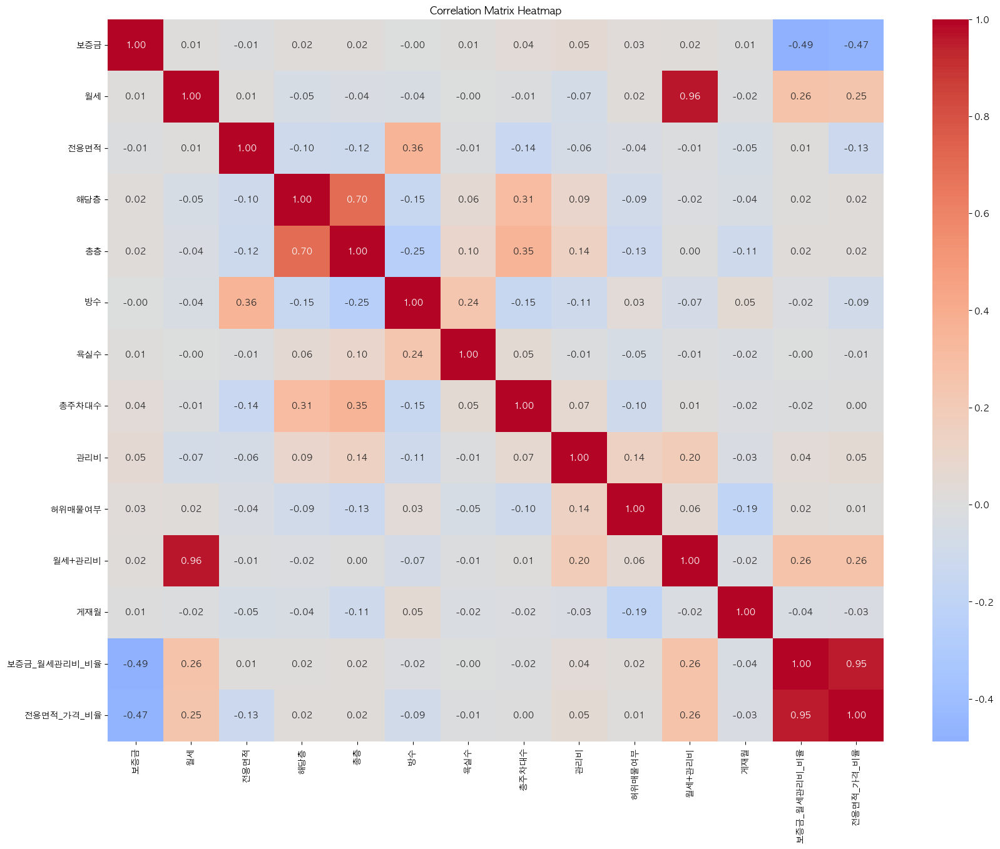

In [433]:
ttrain_cor_df = ttrain2.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr()

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/feature_transformation/correlation_matrix_heatmap_pearson_250202.png", dpi=300, bbox_inches='tight')
plt.show()

모드 변수들이 허위매물 여부를 강하게 설명하지 못하고 있어, 단순한 선형 상관관계로 허위매물을 판별하기 어렵습니다. 따라서 Feature Transformation을 통해 의미 있는 컬럼을 만들어야 합니다.

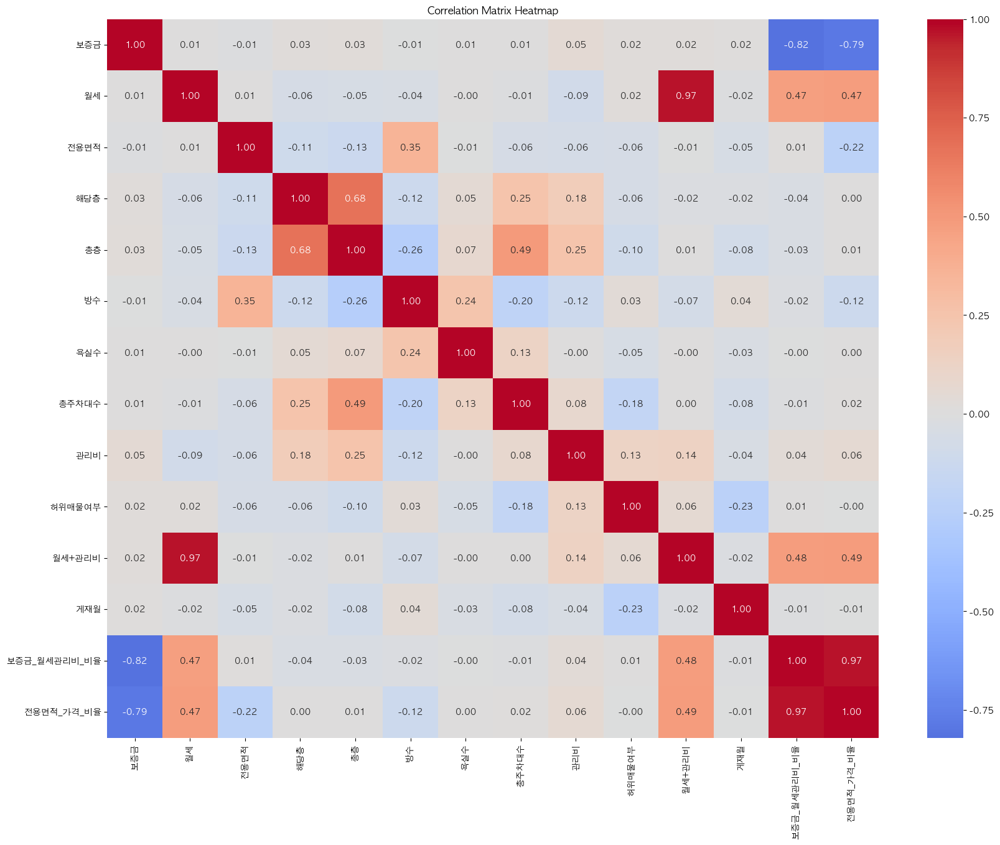

In [434]:
ttrain_cor_df = ttrain2.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr(method='spearman')

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/feature_transformation/correlation_matrix_heatmap_spearman_250202.png", dpi=300, bbox_inches='tight')
plt.show()

# Data Preprocessing

*훈련 데이터에 적용한 feature engineering를 테스트 데이터에 동일하게 적용해야하는 것은 이 아래부터 정리

## 전용면적, 월세, 보증금 결측 샘플 제거

부동산 허위매물을 판별하는데에 가장 중요한 전용면적, 월세, 보증금 3가지는 허위매물을 판단하는데에 핵심적인 요소이므로 없어서는 안되지만 결측치 처리를 하기에는 허위매물과 실매물의 특성이 희석될 수 있을 것이라 판단해 결측 샘플을 제거해야 한다고 생각했습니다.

In [365]:
train = pd.read_csv('./data/train.csv')

In [366]:
ttrain3 = train.copy()

In [367]:
ttrain3.isnull().sum()

ID          0
매물확인방식      0
보증금         0
월세          0
전용면적      787
해당층       229
총층         16
방향          0
방수         16
욕실수        18
주차가능여부      0
총주차대수     696
관리비         0
중개사무소       0
제공플랫폼       0
게재일         0
허위매물여부      0
dtype: int64

전용면적 결측값이 787개나 있다.

In [368]:
ttrain3 = ttrain3.dropna(subset = ['전용면적', '월세', '보증금'], how = 'any')

## 나머지 결측치 처리

In [369]:
ttrain3.isnull().sum()

ID          0
매물확인방식      0
보증금         0
월세          0
전용면적        0
해당층       156
총층          0
방향          0
방수          0
욕실수         1
주차가능여부      0
총주차대수     264
관리비         0
중개사무소       0
제공플랫폼       0
게재일         0
허위매물여부      0
dtype: int64

중앙값 보간

In [370]:
# 숫자형 컬럼만 선택
numeric_cols = ttrain3.select_dtypes(include=['number']).columns
ttrain3[numeric_cols].median()

보증금       135000000.0
월세           370000.0
전용면적             26.4
해당층               4.0
총층                8.0
방수                1.0
욕실수               1.0
총주차대수            17.0
관리비               5.0
허위매물여부            0.0
dtype: float64

In [371]:
ttrain3[numeric_cols] = ttrain3[numeric_cols].fillna(ttrain3[numeric_cols].median())

현재 해당층 156개와 욕실수 1개, 총주차대수 264개의 값이 각 컬럼의 중앙값으로 처리되었습니다.

In [372]:
ttrain3.shape

(1665, 17)

## 지역적 특성을 담는 컬럼 만들기 Feature Transformation

In [373]:
ttrain3["보증금"] = ttrain3["보증금"] / 10000
ttrain3["월세"] = ttrain3["월세"] / 10000

In [374]:
ttrain3['월세+관리비']  = ttrain3['월세'] + ttrain3['관리비']

In [375]:
ttrain3['보증금_월세관리비_비율'] =  ttrain3['월세+관리비'] / ttrain3['보증금']

In [376]:
ttrain3['보증금_월세관리비_비율'] = ttrain3['월세+관리비'] / ttrain3['보증금']
ttrain3['전용면적_가격_비율'] = ttrain3['보증금_월세관리비_비율'] / ttrain3['전용면적']
ttrain3

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,월세+관리비,보증금_월세관리비_비율,전용면적_가격_비율
3,TRAIN_0003,현장확인,16350.0,3.0,36.30,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,13.0,0.000795,0.000022
5,TRAIN_0005,전화확인,15300.0,53.0,29.50,4.0,3.0,남향,2.0,1.0,가능,1.0,0,Q42YF3Y0I2,A플랫폼,2024-09-12,0,53.0,0.003464,0.000117
8,TRAIN_0008,현장확인,12050.0,44.0,31.55,1.0,2.0,북향,2.0,2.0,가능,18.0,3,G52Iz8V2B9,B플랫폼,2024-05-23,0,47.0,0.003900,0.000124
9,TRAIN_0009,현장확인,7950.0,26.0,39.66,2.0,3.0,남동향,2.0,1.0,불가능,2.0,0,M90Ph8W9V3,B플랫폼,2024-11-30,0,26.0,0.003270,0.000082
10,TRAIN_0010,현장확인,18750.0,39.0,23.69,1.0,15.0,남향,1.0,1.0,불가능,15.0,5,G52Iz8V2B9,A플랫폼,2023-12-16,0,44.0,0.002347,0.000099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2446,TRAIN_2446,전화확인,36550.0,19.0,17.50,4.0,14.0,남향,1.0,1.0,가능,104.0,10,G38pb6B9C7,C플랫폼,2024-12-10,0,29.0,0.000793,0.000045
2447,TRAIN_2447,서류확인,15900.0,55.0,48.95,3.0,3.0,남향,2.0,1.0,불가능,17.0,0,d22DX4Y4P8,B플랫폼,2024-11-16,0,55.0,0.003459,0.000071
2449,TRAIN_2449,전화확인,32900.0,61.0,17.50,8.0,20.0,남서향,1.0,1.0,가능,29.0,10,G52Iz8V2B9,B플랫폼,2024-05-15,0,71.0,0.002158,0.000123
2450,TRAIN_2450,현장확인,3100.0,40.0,22.87,8.0,9.0,남동향,2.0,1.0,가능,17.0,8,m69GM9O9B3,B플랫폼,2024-08-06,0,48.0,0.015484,0.000677


데이터의 컬럼들 중, 전용면적, 총층, 방수, 욕실수, 총주차대수, 관리비를 이용해 비슷한 매물끼리 클러스터링합니다.
지역에 따라 가격 차이를 보인다는 가정 하에 클러스터링을 진행하기 때문에 월세와 보증금은 클러스터링을 위한 데이터에 포함하지 않았습니다.
관리비의 경우, 간접적으로 매물의 특성을 반영한다고 생각해 포함합니다.

In [540]:
# from itertools import chain, combinations

# def powerset(iterable):
#     """ 주어진 리스트의 모든 부분집합(공집합 제외) 생성 """
#     s = list(iterable)
#     return list(chain.from_iterable(combinations(s, r) for r in range(1, len(s)+1)))

# columns = ['전용면적', '방수', '욕실수', '해당층', '총주차대수', '관리비']

# all_subsets = powerset(columns)

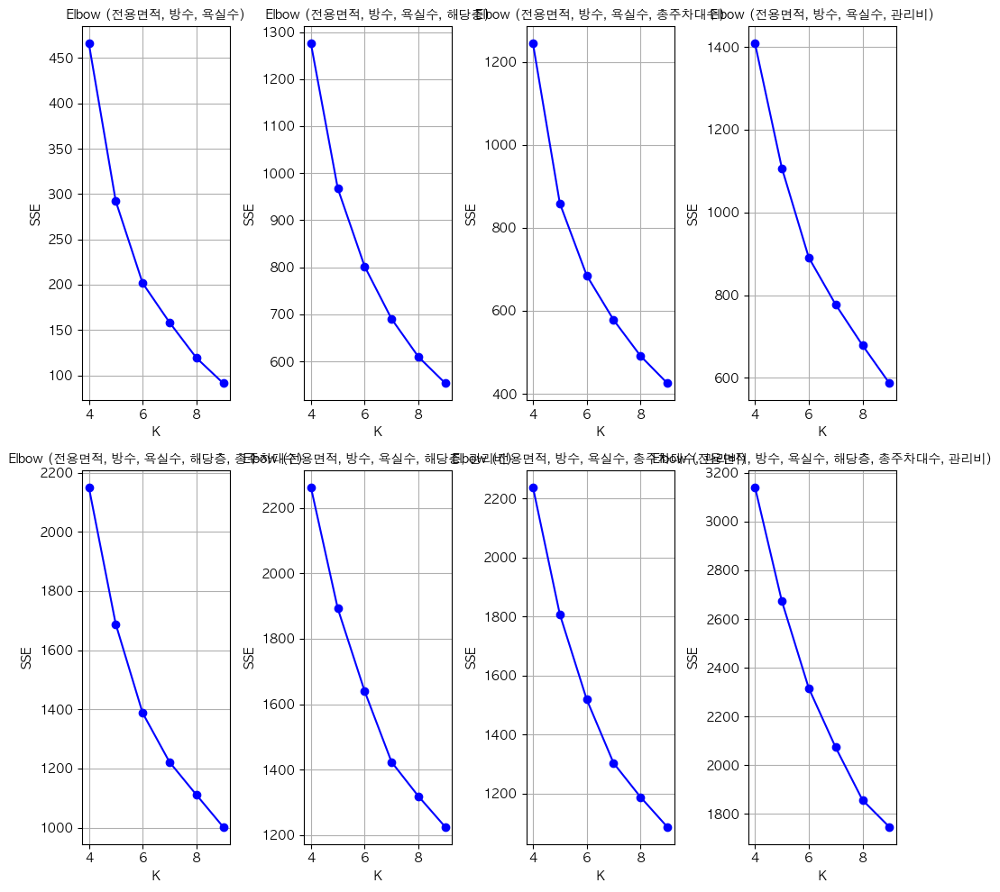

In [541]:
import itertools
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 사용할 컬럼 선택
columns = ['전용면적', '방수', '욕실수', '해당층', '총주차대수', '관리비']

def powerset_with_required(required, optional):
    """필수 컬럼을 포함한 모든 부분집합 생성"""
    subsets = []
    
    # 나머지 선택 컬럼의 모든 부분집합 생성
    for r in range(len(optional) + 1):  # 0개부터 len(optional)개까지 선택
        for combination in itertools.combinations(optional, r):
            subsets.append(tuple(required) + combination)  # 필수 컬럼 + 선택 조합

    return subsets

# 필수 컬럼
required_columns = ['전용면적', '방수', '욕실수']
# 선택 가능 컬럼
optional_columns = ['해당층', '총주차대수', '관리비']

# 필수 컬럼을 포함한 멱집합 생성
all_subsets = powerset_with_required(required_columns, optional_columns)

# 3x3 subplot 생성
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10, 10))

scaler = StandardScaler()

for ax, subset in zip(axes.flat, all_subsets):
    subset = list(subset)
    X_m = ttrain3[subset].dropna().sample(n=1000, random_state=42)  # 1000개 샘플 사용

    # 데이터 스케일링
    X_m_scaled = scaler.fit_transform(X_m)

    # 최적의 K값 찾기 (Elbow Method)
    sse = []
    for k in range(4, 10):  # K 범위를 줄여 속도 개선
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(X_m_scaled)
        sse.append(kmeans.inertia_)

    # Elbow Plot 그리기
    ax.plot(range(4, 10), sse, marker='o', linestyle='-', color='b')
    ax.set_xlabel('K')
    ax.set_ylabel('SSE')
    ax.set_title(f'Elbow ({", ".join(subset)})', fontsize=10)
    ax.grid(True)

# 그래프 정렬
plt.tight_layout()
plt.show()


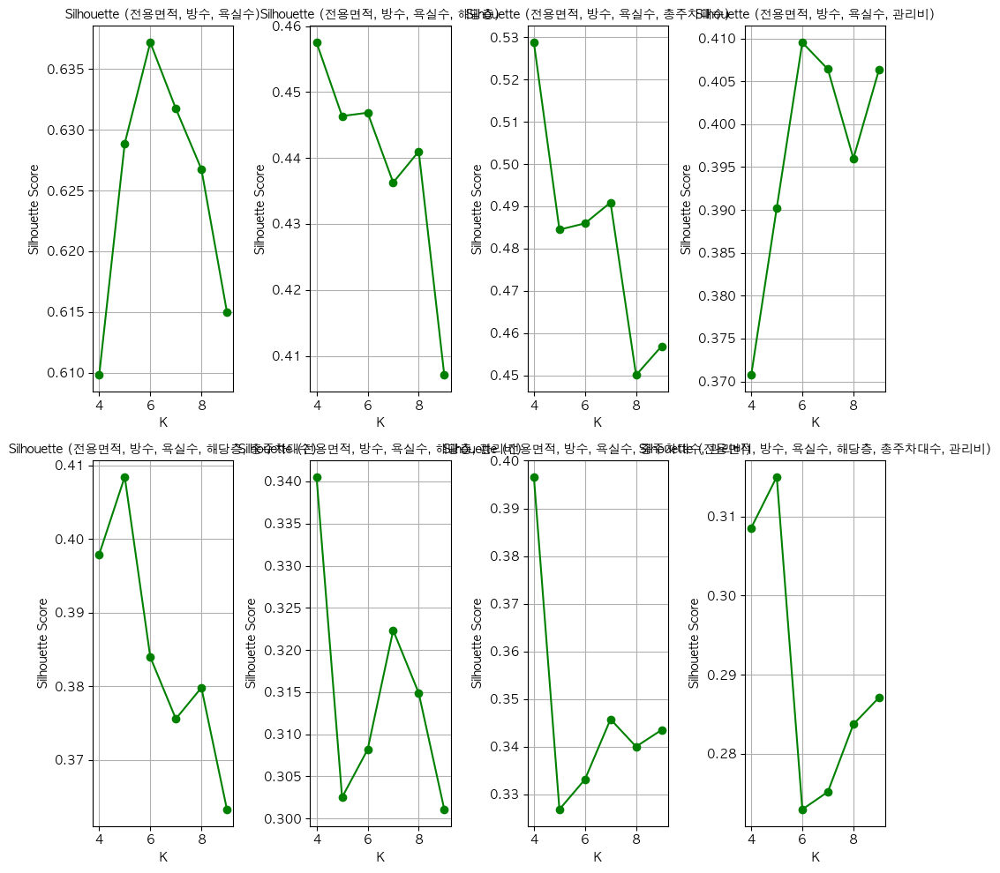

In [542]:
import itertools
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 사용할 컬럼 선택
columns = ['전용면적', '방수', '욕실수', '해당층', '총주차대수', '관리비']

def powerset_with_required(required, optional):
    """필수 컬럼을 포함한 모든 부분집합 생성"""
    subsets = []
    
    # 나머지 선택 컬럼의 모든 부분집합 생성
    for r in range(len(optional) + 1):  # 0개부터 len(optional)개까지 선택
        for combination in itertools.combinations(optional, r):
            subsets.append(tuple(required) + combination)  # 필수 컬럼 + 선택 조합

    return subsets

# 필수 컬럼
required_columns = ['전용면적', '방수', '욕실수']
# 선택 가능 컬럼
optional_columns = ['해당층', '총주차대수', '관리비']

# 필수 컬럼을 포함한 멱집합 생성
all_subsets = powerset_with_required(required_columns, optional_columns)

# 3x3 subplot 생성
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10, 10))

scaler = StandardScaler()

for ax, subset in zip(axes.flat, all_subsets):
    subset = list(subset)
    X_m = ttrain3[subset].dropna().sample(n=1000, random_state=42)  # 1000개 샘플 사용

    # 데이터 스케일링
    X_m_scaled = scaler.fit_transform(X_m)

    # 최적의 K값 찾기 (Silhouette Score)
    silhouette_scores = []
    for k in range(4, 10):  # K 범위를 줄여 속도 개선
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X_m_scaled)
        score = silhouette_score(X_m_scaled, labels)  # 실루엣 계수 계산
        silhouette_scores.append(score)

    # Silhouette Plot 그리기
    ax.plot(range(4, 10), silhouette_scores, marker='o', linestyle='-', color='g')
    ax.set_xlabel('K')
    ax.set_ylabel('Silhouette Score')
    ax.set_title(f'Silhouette ({", ".join(subset)})', fontsize=10)
    ax.grid(True)

# 그래프 정렬
plt.tight_layout()
plt.show()


In [379]:
from sklearn.preprocessing import StandardScaler

X_m = ttrain3[['전용면적', '방수', '욕실수']]

scaler = StandardScaler()
X_m_scaled = scaler.fit_transform(X_m)

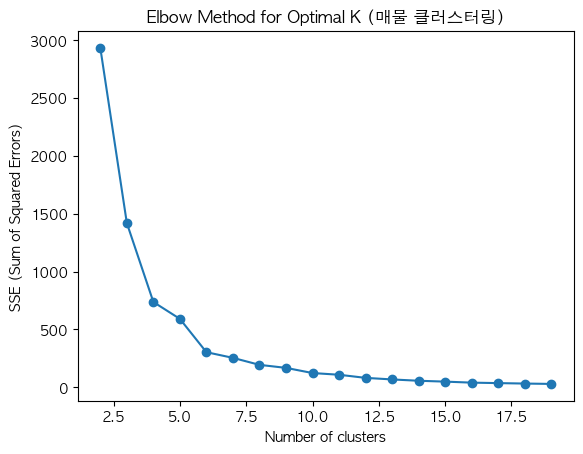

In [380]:
from sklearn.cluster import KMeans
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 최적의 K값 찾기 (Elbow Method)
sse = []
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_m_scaled)
    sse.append(kmeans.inertia_)

# Elbow Plot
plt.plot(range(2, 20), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE (Sum of Squared Errors)')
plt.title('Elbow Method for Optimal K (매물 클러스터링)')
plt.show()


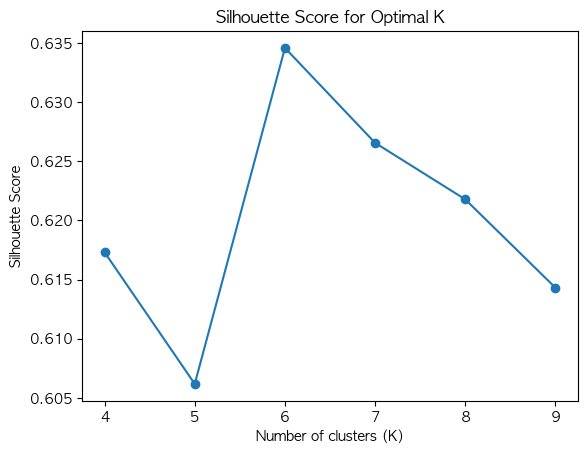

최적의 K값: 6, 최고 실루엣 계수: 0.6346


In [381]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 다양한 K값에 대해 실루엣 계수 계산
silhouette_scores = []
K_range = range(4, 10)  # K 값 범위

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_m_scaled)
    score = silhouette_score(X_m_scaled, labels)
    silhouette_scores.append(score)

# 실루엣 계수 시각화
plt.plot(K_range, silhouette_scores, marker='o', linestyle='-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal K')
plt.show()

# 최적의 K값 출력
best_k = K_range[np.argmax(silhouette_scores)]
print(f'최적의 K값: {best_k}, 최고 실루엣 계수: {max(silhouette_scores):.4f}')


In [382]:
X_m

,전용면적,방수,욕실수
3,36.30,2.0,1.0
5,29.50,2.0,1.0
8,31.55,2.0,2.0
9,39.66,2.0,1.0
10,23.69,1.0,1.0
...,...,...,...
2446,17.50,1.0,1.0
2447,48.95,2.0,1.0
2449,17.50,1.0,1.0
2450,22.87,2.0,1.0


### 계층적 클러스터링

/var/folders/rc/3jzqjhp56_v2qxb49fkb1x880000gn/T/ipykernel_3456/2374563125.py:14: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = linkage(distance_matrix, method='ward')


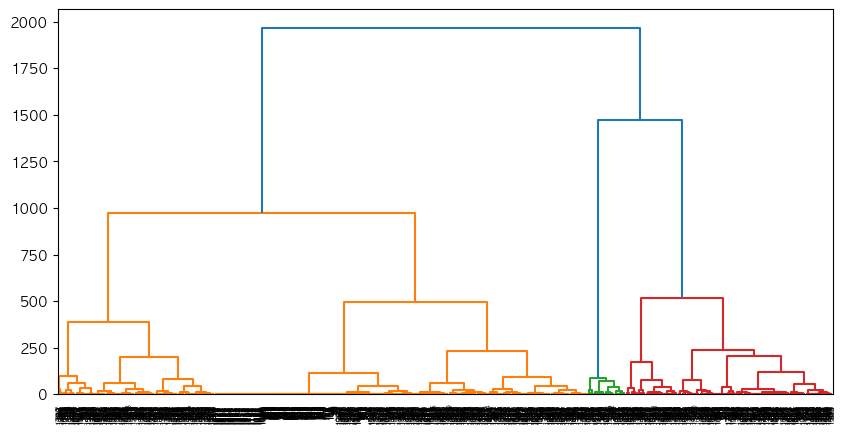

In [383]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist
from sklearn.metrics.pairwise import nan_euclidean_distances

X_m = ttrain3[['전용면적', '방수', '욕실수']]

scaler = StandardScaler()
X_m_scaled = scaler.fit_transform(X_m)

# NaN을 고려한 거리 행렬 생성
distance_matrix = nan_euclidean_distances(X_m_scaled)

# 계층적 클러스터링 수행
linkage_matrix = linkage(distance_matrix, method='ward')

# 덴드로그램 출력
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix)
plt.show()

kmeans 알고리즘으로 알아본 최적의 k값은 6이기 때문에 계층적 군집화의 클러스터 개수 또한 6개로 진행합니다.

In [384]:
from scipy.cluster.hierarchy import fcluster

# 클러스터 개수를 6개로 설정하여 데이터 분류
labels = fcluster(linkage_matrix, t=6, criterion='maxclust')

print("클러스터 라벨:", labels, "/", len(labels))

클러스터 라벨: [6 6 4 ... 2 6 6] / 1665


In [385]:
# Hierarchical Clustering
property_hierarchical_clustering = pd.Series(labels)
property_hierarchical_clustering.index = ttrain3.index
property_hierarchical_clustering

3       6
5       6
8       4
9       5
10      3
       ..
2446    2
2447    5
2449    2
2450    6
2451    6
Length: 1665, dtype: int32

In [386]:
ttrain3["매물_HC"] = property_hierarchical_clustering

In [387]:
ttrain3["매물_HC"].value_counts()

매물_HC
2    430
3    373
1    337
6    333
5    112
4     80
Name: count, dtype: int64

In [388]:
ttrain3[ttrain3.매물_HC == 2]

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,월세+관리비,보증금_월세관리비_비율,전용면적_가격_비율,매물_HC
21,TRAIN_0021,전화확인,3.755,0.0035,19.07,2.0,5.0,서향,1.0,1.0,불가능,17.0,8,a15xR3G4V0,A플랫폼,2024-07-28,0,8.0035,0.001145,0.000060,2
26,TRAIN_0026,현장확인,3.610,0.0035,17.50,6.0,6.0,남서향,1.0,1.0,가능,8.0,8,K86UF7I0P3,C플랫폼,2024-11-18,0,8.0035,0.001191,0.000068,2
28,TRAIN_0028,현장확인,3.545,0.0075,19.83,4.0,5.0,남향,1.0,1.0,불가능,17.0,0,Q42YF3Y0I2,A플랫폼,2025-01-02,0,0.0075,0.002116,0.000107,2
40,TRAIN_0040,현장확인,3.610,0.0044,17.50,3.0,9.0,동향,1.0,1.0,가능,43.0,7,G52Iz8V2B9,C플랫폼,2023-11-26,0,7.0044,0.001413,0.000081,2
41,TRAIN_0041,현장확인,3.240,0.0066,20.26,11.0,14.0,동향,1.0,1.0,가능,21.0,2,G52Iz8V2B9,A플랫폼,2024-12-24,0,2.0066,0.002099,0.000104,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2421,TRAIN_2421,현장확인,1.465,0.0013,17.50,21.0,21.0,서향,1.0,1.0,가능,109.0,9,J07Zn4B0R7,C플랫폼,2025-02-10,0,9.0013,0.001502,0.000086,2
2441,TRAIN_2441,현장확인,1.365,0.0055,19.80,3.0,6.0,남향,1.0,1.0,불가능,4.0,2,l84az9J6A2,C플랫폼,2024-05-13,1,2.0055,0.004176,0.000211,2
2444,TRAIN_2444,현장확인,0.310,0.0037,17.50,2.0,7.0,남서향,1.0,1.0,가능,50.0,0,G52Iz8V2B9,A플랫폼,2024-08-27,0,0.0037,0.011935,0.000682,2
2446,TRAIN_2446,전화확인,3.655,0.0019,17.50,4.0,14.0,남향,1.0,1.0,가능,104.0,10,G38pb6B9C7,C플랫폼,2024-12-10,0,10.0019,0.000793,0.000045,2


/var/folders/rc/3jzqjhp56_v2qxb49fkb1x880000gn/T/ipykernel_3456/3056134862.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="매물_HC")  # 범례 추가


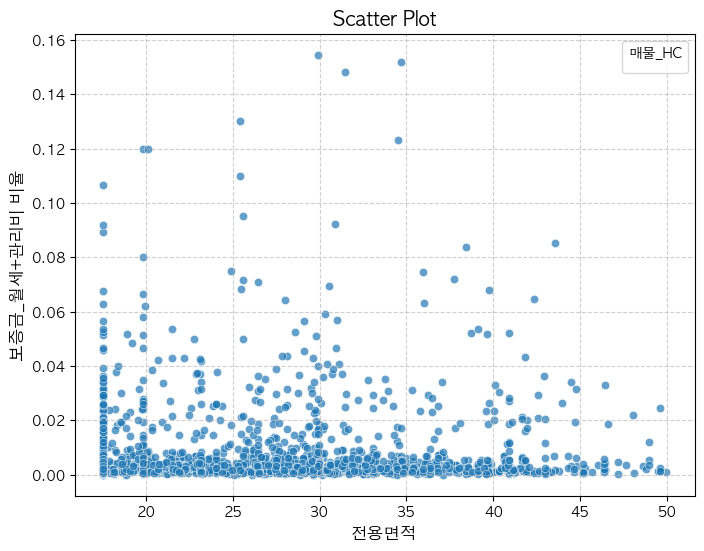

In [364]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# 산점도 시각화
plt.figure(figsize=(8, 6))

# hue 옵션을 추가하여 "매물_HC" 컬럼을 기준으로 색상 지정
sns.scatterplot(x=ttrain3["전용면적"], 
                y=ttrain3["보증금_월세관리비_비율"], 
                alpha=0.7)
plt.title(f"Scatter Plot", fontsize=14)
plt.xlabel("전용면적", fontsize=12)
plt.ylabel("보증금_월세+관리비 비율", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="매물_HC")  # 범례 추가

plt.show()

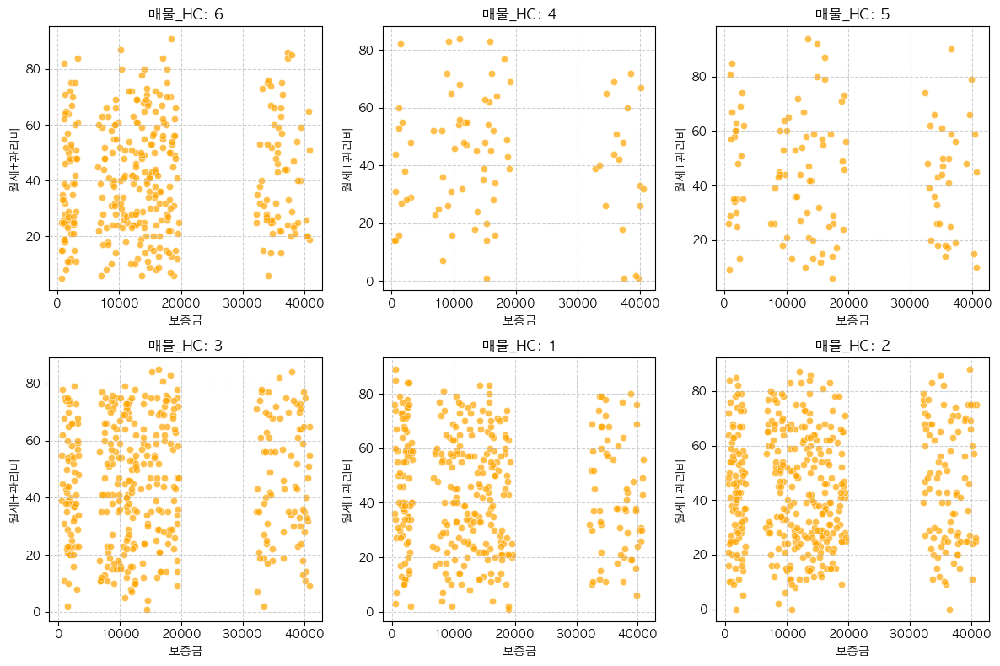

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# 데이터 샘플 (실제 데이터가 있다고 가정)
# ttrain3 = pd.read_csv("your_data.csv") 

# 매물_HC의 고유값 리스트 가져오기
unique_hc_values = ttrain3["매물_HC"].unique()

# 플롯 생성
plt.figure(figsize=(12, 8))

# 각 매물_HC 그룹별 산점도 그리기
for i, hc in enumerate(unique_hc_values, 1):
    plt.subplot(2, 3, i)  # 2행 3열 서브플롯 설정
    subset = ttrain3[ttrain3["매물_HC"] == hc]  # 특정 그룹의 데이터 필터링
    
    sns.scatterplot(x=subset["보증금"], 
                    y=subset["월세+관리비"], 
                    color="orange",  # 색상을 주황색으로 설정
                    alpha=0.7)
    
    plt.title(f"매물_HC: {hc}", fontsize=12)
    plt.xlabel("보증금", fontsize=10)
    plt.ylabel("월세+관리비", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)

# 레이아웃 조정
plt.tight_layout()
plt.show()


### DBSCAN

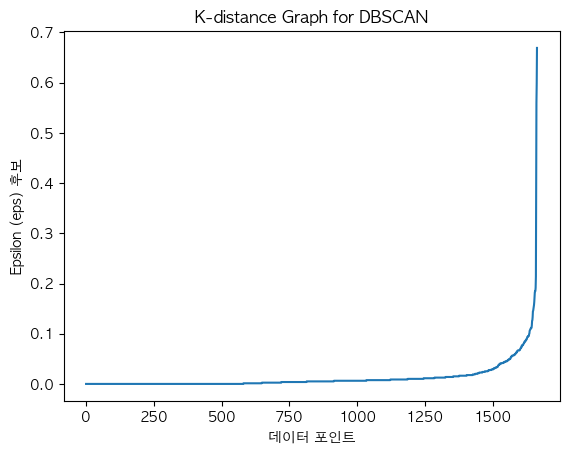

In [389]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# 최근접 이웃 찾기 (4번째 이웃 거리 사용)
neigh = NearestNeighbors(n_neighbors=5)
neigh.fit(X_m_scaled)
distances, indices = neigh.kneighbors(X_m_scaled)

# K-거리 그래프 그리기
distances = np.sort(distances[:, 4], axis=0)  # 4번째 이웃 거리 정렬
plt.plot(distances)
plt.ylabel("Epsilon (eps) 후보")
plt.xlabel("데이터 포인트")
plt.title("K-distance Graph for DBSCAN")
plt.show()


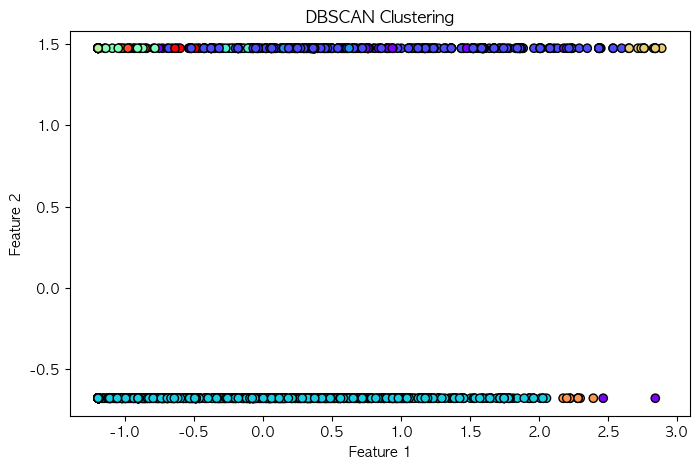

In [390]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# DBSCAN 적용
dbscan = DBSCAN(eps=0.1, min_samples=6) #eps : 두 데이터 포인트가 같은 클러스터에 속할 수 있는 최대 거리(밀집 기준)
y_dbscan = dbscan.fit_predict(X_m_scaled)

# 클러스터링 결과 시각화
plt.figure(figsize=(8, 5))
plt.scatter(X_m_scaled[:, 0], X_m_scaled[:, 1], c=y_dbscan, cmap='rainbow', edgecolors='black')
plt.title("DBSCAN Clustering")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

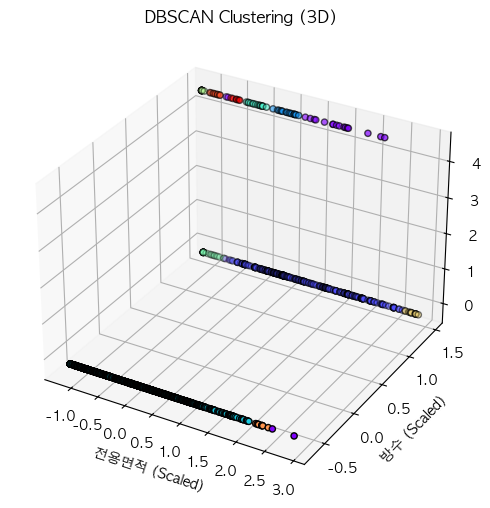

In [391]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_m_scaled[:, 0], X_m_scaled[:, 1], X_m_scaled[:, 2], c=y_dbscan, cmap='rainbow', edgecolors='black')

ax.set_title("DBSCAN Clustering (3D)")
ax.set_xlabel("전용면적 (Scaled)")
ax.set_ylabel("방수 (Scaled)")
ax.set_zlabel("욕실수 (Scaled)")

plt.show()


In [392]:
ttrain3['매물_DBSCAN'] = y_dbscan
ttrain3

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,월세+관리비,보증금_월세관리비_비율,전용면적_가격_비율,매물_HC,매물_DBSCAN
3,TRAIN_0003,현장확인,1.635,0.0003,36.30,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,10.0003,0.000795,0.000022,6,0
5,TRAIN_0005,전화확인,1.530,0.0053,29.50,4.0,3.0,남향,2.0,1.0,가능,1.0,0,Q42YF3Y0I2,A플랫폼,2024-09-12,0,0.0053,0.003464,0.000117,6,0
8,TRAIN_0008,현장확인,1.205,0.0044,31.55,1.0,2.0,북향,2.0,2.0,가능,18.0,3,G52Iz8V2B9,B플랫폼,2024-05-23,0,3.0044,0.003900,0.000124,4,1
9,TRAIN_0009,현장확인,0.795,0.0026,39.66,2.0,3.0,남동향,2.0,1.0,불가능,2.0,0,M90Ph8W9V3,B플랫폼,2024-11-30,0,0.0026,0.003270,0.000082,5,0
10,TRAIN_0010,현장확인,1.875,0.0039,23.69,1.0,15.0,남향,1.0,1.0,불가능,15.0,5,G52Iz8V2B9,A플랫폼,2023-12-16,0,5.0039,0.002347,0.000099,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2446,TRAIN_2446,전화확인,3.655,0.0019,17.50,4.0,14.0,남향,1.0,1.0,가능,104.0,10,G38pb6B9C7,C플랫폼,2024-12-10,0,10.0019,0.000793,0.000045,2,2
2447,TRAIN_2447,서류확인,1.590,0.0055,48.95,3.0,3.0,남향,2.0,1.0,불가능,17.0,0,d22DX4Y4P8,B플랫폼,2024-11-16,0,0.0055,0.003459,0.000071,5,6
2449,TRAIN_2449,전화확인,3.290,0.0061,17.50,8.0,20.0,남서향,1.0,1.0,가능,29.0,10,G52Iz8V2B9,B플랫폼,2024-05-15,0,10.0061,0.002158,0.000123,2,2
2450,TRAIN_2450,현장확인,0.310,0.0040,22.87,8.0,9.0,남동향,2.0,1.0,가능,17.0,8,m69GM9O9B3,B플랫폼,2024-08-06,0,8.0040,0.015484,0.000677,6,0


In [393]:
ttrain3['매물_DBSCAN'].value_counts() #노이즈 ID : -1

매물_DBSCAN
 2    1129
 0     398
 4      33
-1      21
 1      17
 3      15
 5      15
 6      13
 7       9
 8       9
 9       6
Name: count, dtype: int64

노이즈 클러스터에 할당된 샘플 knn으로 재배치 

In [394]:
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd

# 노이즈(-1) 데이터 찾기
noise_mask = (y_dbscan == -1)
non_noise_mask = ~noise_mask

# 노이즈가 아닌 데이터로 KNN 학습
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_m_scaled[non_noise_mask], y_dbscan[non_noise_mask])

# 노이즈 데이터에 대해 KNN으로 클러스터 배정
y_dbscan_filled = y_dbscan.copy()
y_dbscan_filled[noise_mask] = knn.predict(X_m_scaled[noise_mask])

In [395]:
ttrain3['매물_DBSCAN'] = y_dbscan_filled

In [396]:
ttrain3['매물_DBSCAN'].value_counts() #노이즈 ID : -1

매물_DBSCAN
2    1129
0     398
4      34
1      33
3      15
5      15
6      13
7      11
8      10
9       7
Name: count, dtype: int64

In [397]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# import numpy as np

# # 산점도 시각화
# plt.figure(figsize=(8, 6))

# sns.scatterplot(x=ttrain3["전용면적"], 
#                 y=ttrain3["보증금_월세관리비_비율"], 
#                 hue=ttrain3["매물_DBSCAN"],  # 색상을 매물_HC에 따라 다르게 설정
#                 alpha=0.7, 
#                 palette="viridis")  # 색상 팔레트 설정

# plt.title(f"Scatter Plot", fontsize=14)
# plt.xlabel("전용면적", fontsize=12)
# plt.ylabel("보증금_월세+관리비 비율", fontsize=12)

# plt.grid(True, linestyle="--", alpha=0.6)
# plt.legend(title="매물_DBSCAN")  # 범례 추가

# plt.show()

In [99]:
ttrain3[['매물_HC', '매물_DBSCAN']]

,매물_HC,매물_DBSCAN
3,6,0
5,6,0
8,4,1
9,5,0
10,3,2
...,...,...
2446,2,2
2447,5,0
2449,2,2
2450,6,0


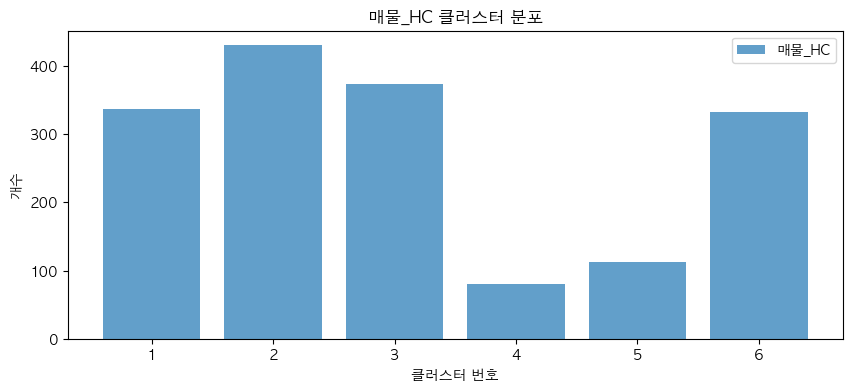

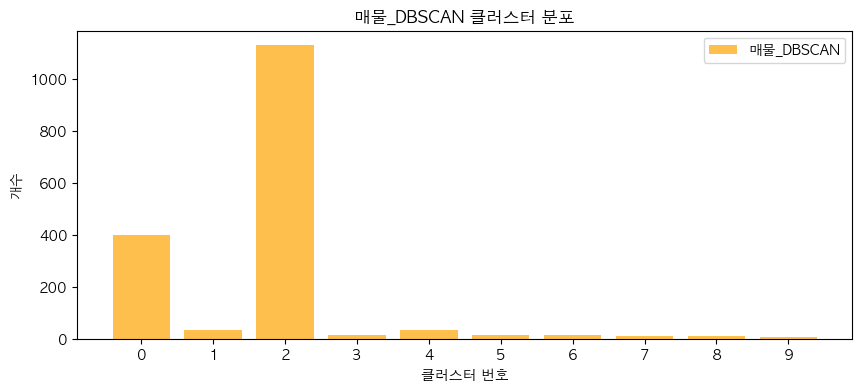

In [398]:
import matplotlib.pyplot as plt

# 매물_HC와 매물_DBSCAN의 분포 계산
hc_counts = ttrain3['매물_HC'].value_counts().sort_index()
dbscan_counts = ttrain3['매물_DBSCAN'].value_counts().sort_index()

# 그래프 그리기 - 매물_HC
plt.figure(figsize=(10, 4))
plt.bar(hc_counts.index, hc_counts.values, alpha=0.7, label='매물_HC')
plt.xlabel('클러스터 번호')
plt.ylabel('개수')
plt.title('매물_HC 클러스터 분포')
plt.xticks(hc_counts.index)
plt.legend()
plt.show()

# 그래프 그리기 - 매물_DBSCAN
plt.figure(figsize=(10, 4))
plt.bar(dbscan_counts.index, dbscan_counts.values, alpha=0.7, color='orange', label='매물_DBSCAN')
plt.xlabel('클러스터 번호')
plt.ylabel('개수')
plt.title('매물_DBSCAN 클러스터 분포')
plt.xticks(dbscan_counts.index)
plt.legend()
plt.show()


매물 클러스터링의 경우 클러스터의 크기가 너무 불균형하지 않고, 상대적으로 균등하게 분포되었기에 매물_HC변수를 사용하는 것이 좋을 듯하다.(하지만 확실히 하기 위해 모델 훈련예측 시켜보기)

(DBSCAN의 경우 이상치(노이즈)가 많은 경우 적절할 수 있다.)

### 지역 클러스터링

가정 : 비슷한 매물의 경우, 주변 지역의 시세에 맞게 가격이 책정된다.

범주형인 매물 클러스터 컬럼을 포함하기 위해 K-means가 아니라 K-medoids와 HDBSCAN을 이용해보려 한다.
- K-Medoids : K-Means와 유사하지만, 중심점을 평균이 아닌 실제 데이터 중 하나로 설정한다. (이상치에 강하다)
- HDBSCAN : 밀도기반 클러스터링(DBSCAN을 개선한 것)

In [399]:
from sklearn.preprocessing import StandardScaler

# 데이터 스케일링
X_m2 = ttrain3[['매물_HC','매물_DBSCAN', '전용면적_가격_비율', '보증금_월세관리비_비율']]
scaler = StandardScaler()
X_m_scaled2 = scaler.fit_transform(X_m2)

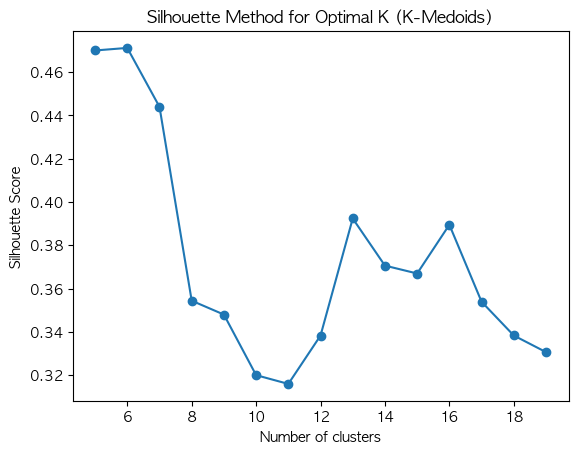

최적의 K 값: 6


In [400]:
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt

# 최적의 K 찾기 (Silhouette Score 사용)
silhouette_scores = []
k_range = range(5, 20)

for k in k_range:
    kmedoids = KMedoids(n_clusters=k, random_state=42)
    labels = kmedoids.fit_predict(X_m_scaled2)
    score = silhouette_score(X_m_scaled2, labels)
    silhouette_scores.append(score)

# 최적 K 시각화
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal K (K-Medoids)')
plt.show()

# 최적 K 값 선택
best_k = k_range[np.argmax(silhouette_scores)]
print(f"최적의 K 값: {best_k}")

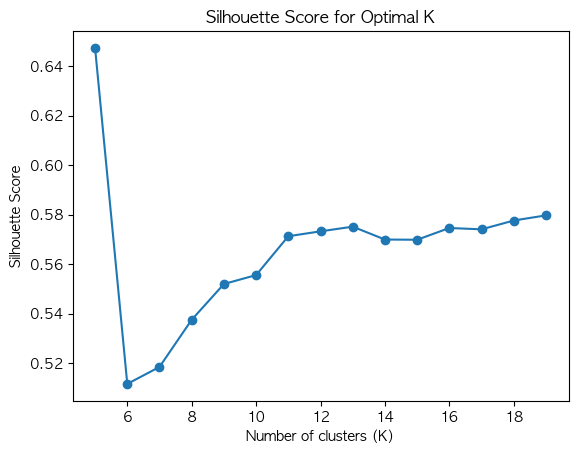

최적의 K값: 5, 최고 실루엣 계수: 0.6473


In [401]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 다양한 K값에 대해 실루엣 계수 계산
silhouette_scores = []
K_range = range(5, 20)  # K 값 범위

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_m_scaled2)
    score = silhouette_score(X_m_scaled2, labels)
    silhouette_scores.append(score)

# 실루엣 계수 시각화
plt.plot(K_range, silhouette_scores, marker='o', linestyle='-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal K')
plt.show()

# 최적의 K값 출력
best_k = K_range[np.argmax(silhouette_scores)]
print(f'최적의 K값: {best_k}, 최고 실루엣 계수: {max(silhouette_scores):.4f}')


In [402]:
# K-Medoids
kmedoids = KMedoids(n_clusters=12, random_state=42)
ttrain3['지역_KMedoids'] = kmedoids.fit_predict(X_m_scaled2)

In [403]:
ttrain3['지역_KMedoids'].value_counts()

지역_KMedoids
6     459
4     336
3     174
9     128
2     118
11    110
10     85
5      66
0      59
8      55
7      39
1      36
Name: count, dtype: int64

In [404]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# import numpy as np

# # 산점도 시각화
# plt.figure(figsize=(8, 6))

# sns.scatterplot(x=ttrain3["보증금"], 
#                 y=ttrain3["월세+관리비"], 
#                 hue=ttrain3["지역_KMedoids"],  # 색상을 매물_HC에 따라 다르게 설정
#                 alpha=0.7, 
#                 palette="viridis")  # 색상 팔레트 설정

# plt.title(f"Scatter Plot", fontsize=14)
# plt.xlabel("보증금", fontsize=12)
# plt.ylabel("월세+관리비", fontsize=12)

# plt.grid(True, linestyle="--", alpha=0.6)
# plt.legend(title="지역_KMedoids")  # 범례 추가

# plt.show()

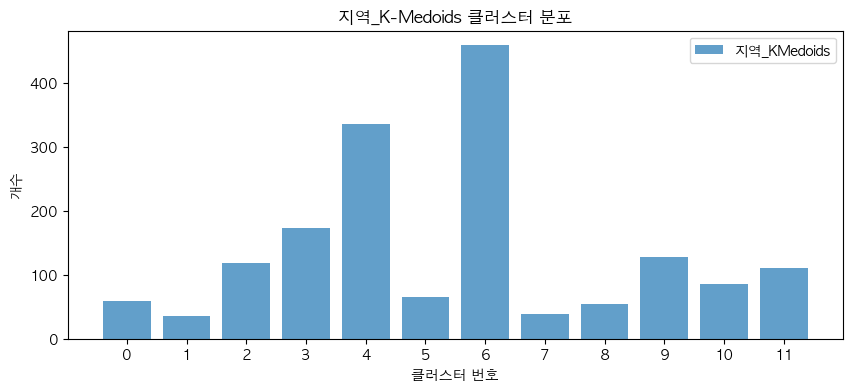

In [405]:
import matplotlib.pyplot as plt

# 지역_kmedoids의 분포 계산
kmedoids_counts = ttrain3['지역_KMedoids'].value_counts().sort_index()

# 그래프 그리기 - 지역 kmedoids
plt.figure(figsize=(10, 4))
plt.bar(kmedoids_counts.index, kmedoids_counts.values, alpha=0.7, label='지역_KMedoids')
plt.xlabel('클러스터 번호')
plt.ylabel('개수')
plt.title('지역_K-Medoids 클러스터 분포')
plt.xticks(kmedoids_counts.index)
plt.legend()
plt.show()

In [406]:
import hdbscan

# HDBSCAN 클러스터링 수행
hdb = hdbscan.HDBSCAN(min_cluster_size=10, min_samples=5, cluster_selection_epsilon = 0.2)
y_hdbscan = hdb.fit_predict(X_m_scaled2)
ttrain3['지역_HDBSCAN'] = y_hdbscan

# 클러스터 개수 확인
ttrain3['지역_HDBSCAN'].value_counts()


지역_HDBSCAN
 10    417
 9     361
 14    282
 12    252
 7      94
-1      82
 2      33
 5      30
 11     17
 13     17
 8      16
 1      15
 6      14
 4      12
 3      12
 0      11
Name: count, dtype: int64

In [407]:
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd

# 노이즈(-1) 데이터 찾기
noise_mask = (y_hdbscan == -1)
non_noise_mask = ~noise_mask

# 노이즈가 아닌 데이터로 KNN 학습
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_m_scaled2[non_noise_mask], y_hdbscan[non_noise_mask])

# 노이즈 데이터에 대해 KNN으로 클러스터 배정
y_hdbscan_filled = y_hdbscan.copy()
y_hdbscan_filled[noise_mask] = knn.predict(X_m_scaled2[noise_mask])

In [408]:
ttrain3['지역_HDBSCAN'] = y_hdbscan_filled
ttrain3['지역_HDBSCAN']

3       12
5       12
8        5
9        7
10       9
        ..
2446    10
2447     3
2449    10
2450    11
2451    12
Name: 지역_HDBSCAN, Length: 1665, dtype: int64

In [409]:
ttrain3['지역_HDBSCAN'].value_counts() #노이즈 ID : -1

지역_HDBSCAN
10    457
9     365
14    283
12    252
7      95
2      35
8      32
5      31
13     28
11     19
1      16
6      14
4      14
3      13
0      11
Name: count, dtype: int64

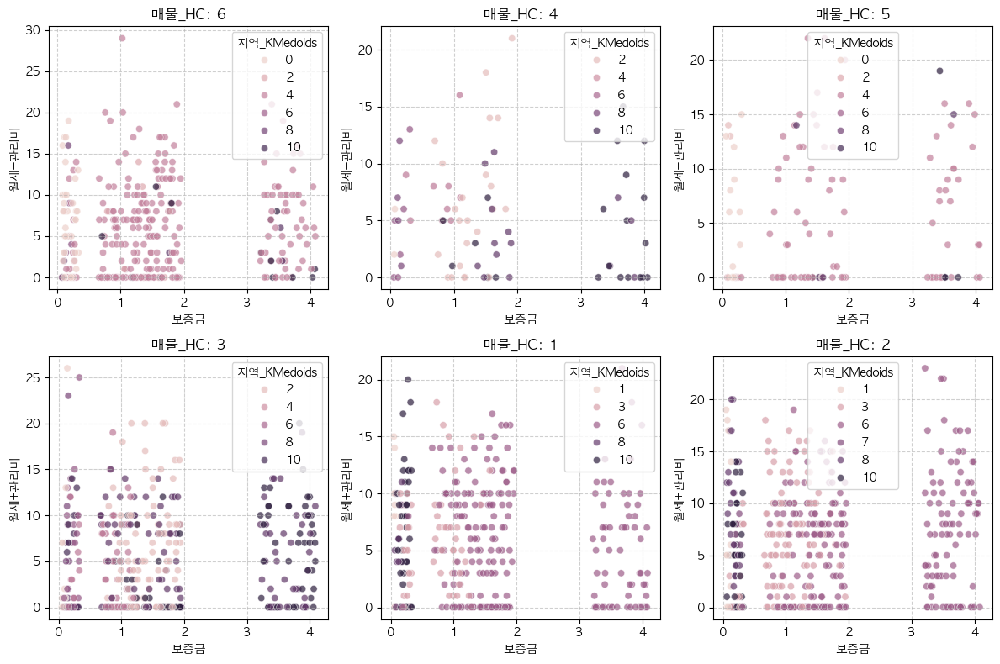

In [410]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

unique_hc_values = ttrain3["매물_HC"].unique()

plt.figure(figsize=(12, 8))

for i, hc in enumerate(unique_hc_values, 1):
    plt.subplot(2, 3, i)  # 2행 3열 서브플롯 설정
    subset = ttrain3[ttrain3["매물_HC"] == hc]
    
    sns.scatterplot(x=subset["보증금"], 
                    y=subset["월세+관리비"], 
                    hue=subset["지역_KMedoids"],
                    alpha=0.7)
    
    plt.title(f"매물_HC: {hc}", fontsize=12)
    plt.xlabel("보증금", fontsize=10)
    plt.ylabel("월세+관리비", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

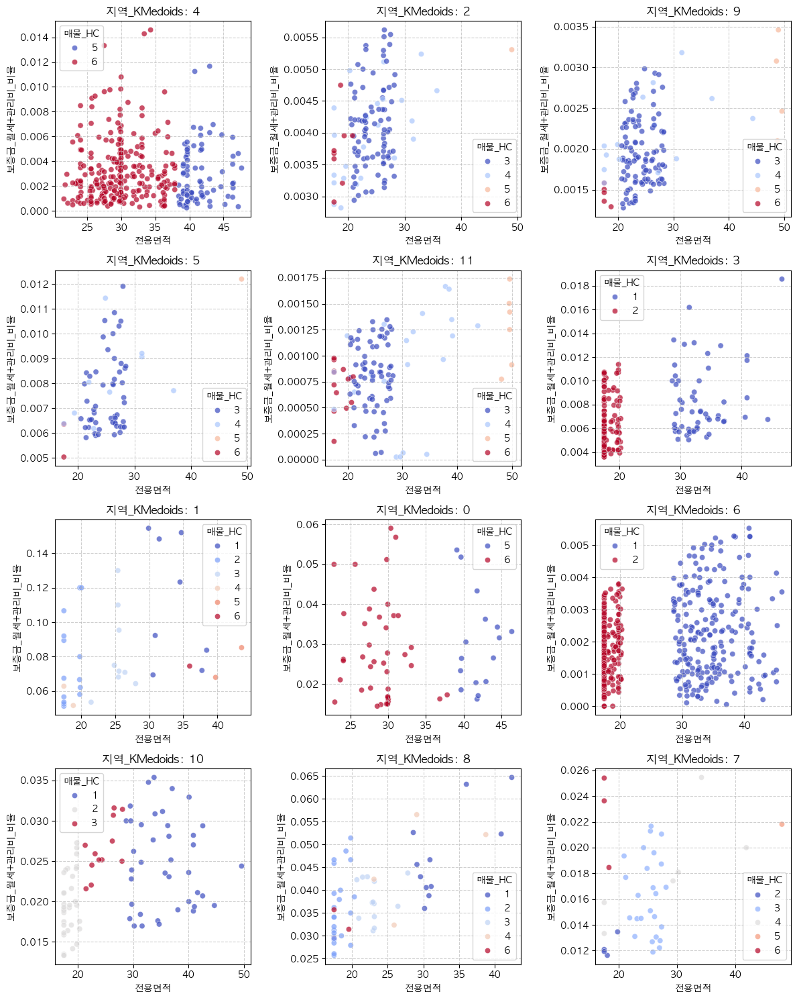

In [412]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

unique_hc_values = ttrain3["지역_KMedoids"].unique()

plt.figure(figsize=(12, 15))

for i, hc in enumerate(unique_hc_values, 1):
    plt.subplot(4, 3, i) 
    subset = ttrain3[ttrain3["지역_KMedoids"] == hc]  # 특정 그룹의 데이터 필터링
    
    sns.scatterplot(x=subset["전용면적"], 
                    y=subset["보증금_월세관리비_비율"], 
                    hue=subset["매물_HC"],
                    palette="coolwarm",
                    alpha=0.7)
    
    plt.title(f"지역_KMedoids: {hc}", fontsize=12)
    plt.xlabel("전용면적", fontsize=10)
    plt.ylabel("보증금_월세+관리비_비율", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

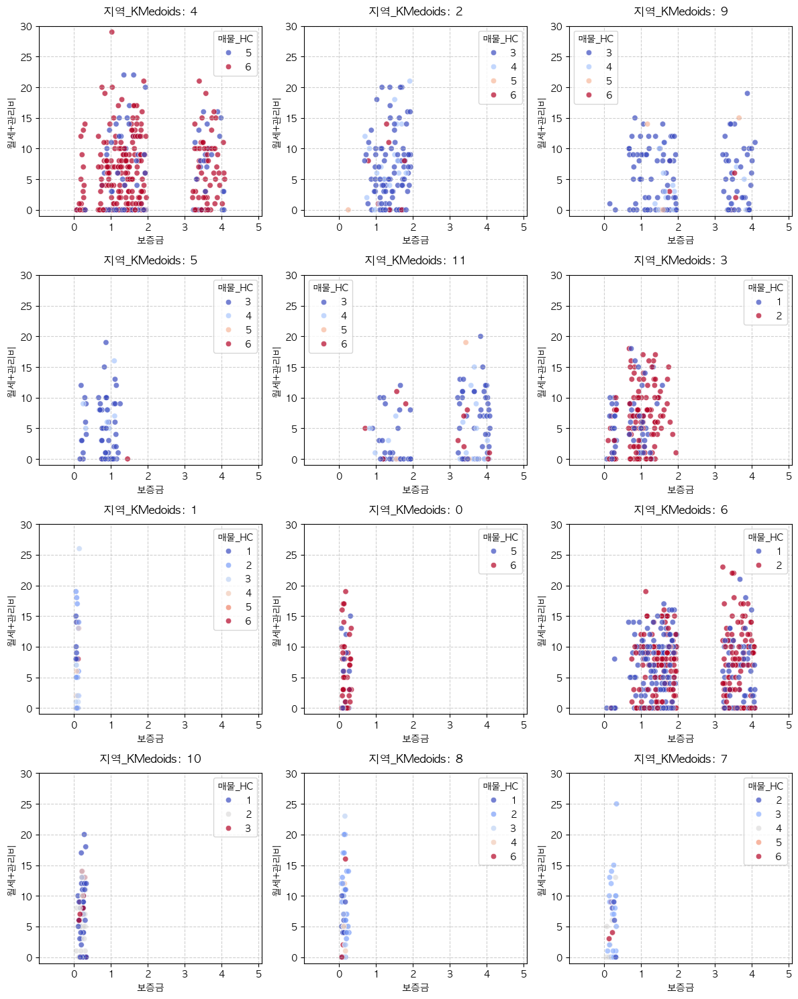

In [443]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# # 로그 변환 (0이 포함될 경우 작은 값 추가)
# ttrain3["log_보증금"] = np.log1p(ttrain3["보증금"])  # log1p(x) = log(x + 1) (0 값 방지)
# ttrain3["log_월세+관리비"] = np.log1p(ttrain3["월세+관리비"])

unique_hc_values = ttrain3["지역_KMedoids"].unique()

plt.figure(figsize=(12, 15))

x_min, x_max = ttrain3["보증금"].min(), ttrain3["보증금"].max()
y_min, y_max = ttrain3["월세+관리비"].min(), ttrain3["월세+관리비"].max()

for i, hc in enumerate(unique_hc_values, 1):
    plt.subplot(4, 3, i) 
    subset = ttrain3[ttrain3["지역_KMedoids"] == hc]  # 특정 그룹의 데이터 필터링
    
    sns.scatterplot(x=subset["보증금"], 
                    y=subset["월세+관리비"], 
                    hue=subset["매물_HC"],
                    palette="coolwarm",
                    alpha=0.7)
    
    plt.title(f"지역_KMedoids: {hc}", fontsize=12, pad=12)
    plt.xlabel("보증금", fontsize=10)
    plt.ylabel("월세+관리비", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.xlim(x_min-1, x_max+1)
    plt.ylim(y_min-1, y_max+1)

plt.subplots_adjust(hspace=0.5)
plt.savefig('./image/지역별매물산점도_보증금_월세관리비.png')
plt.tight_layout()

plt.show()


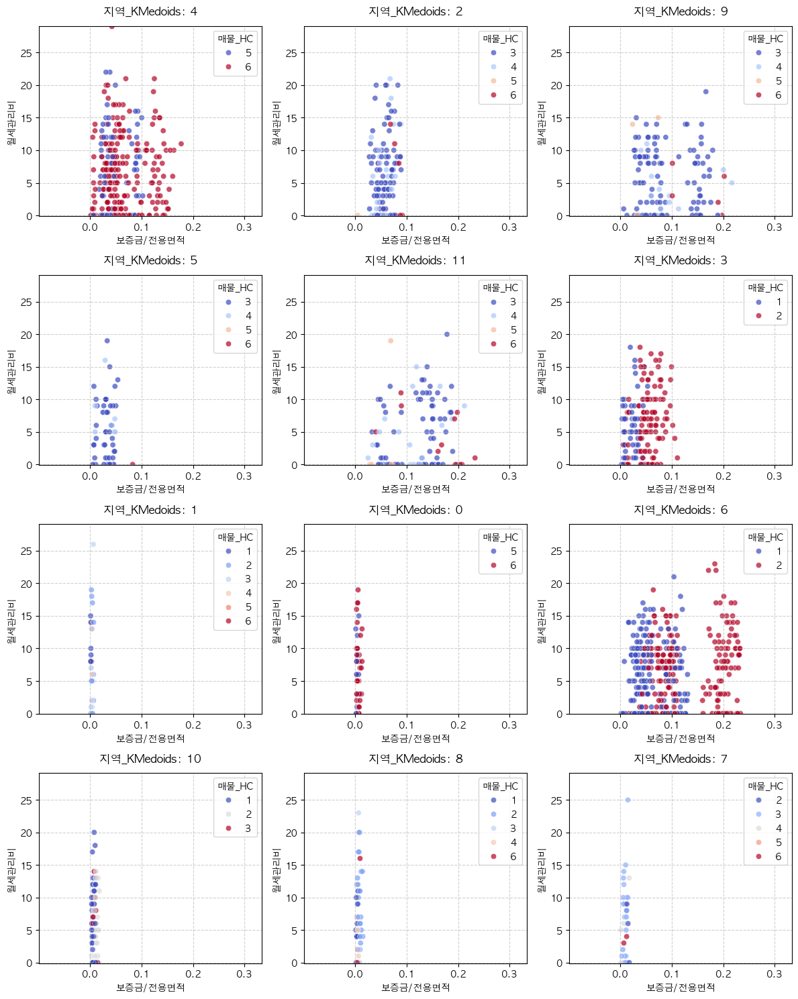

In [452]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# # 로그 변환 (0이 포함될 경우 작은 값 추가)
# ttrain3["log_보증금"] = np.log1p(ttrain3["보증금"])  # log1p(x) = log(x + 1) (0 값 방지)
# ttrain3["log_월세+관리비"] = np.log1p(ttrain3["월세+관리비"])

ttrain3["월세관리비/전용면적"] = ttrain3["월세+관리비"]/ttrain3["전용면적"]
ttrain3["보증금/전용면적"] = ttrain3["보증금"]/ttrain3["전용면적"]

unique_hc_values = ttrain3["지역_KMedoids"].unique()

plt.figure(figsize=(12, 15))

x_min, x_max = ttrain3["보증금/전용면적"].min(), ttrain3["보증금/전용면적"].max()
y_min, y_max = ttrain3["월세+관리비"].min(), ttrain3["월세+관리비"].max()

for i, hc in enumerate(unique_hc_values, 1):
    plt.subplot(4, 3, i) 
    subset = ttrain3[ttrain3["지역_KMedoids"] == hc]  # 특정 그룹의 데이터 필터링
    
    sns.scatterplot(x=subset["보증금/전용면적"], 
                    y=subset["월세+관리비"], 
                    hue=subset["매물_HC"],
                    palette="coolwarm",
                    alpha=0.7)
    
    plt.title(f"지역_KMedoids: {hc}", fontsize=12, pad=12)
    plt.xlabel("보증금/전용면적", fontsize=10)
    plt.ylabel("월세관리비", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.xlim(x_min-0.1, x_max+0.1)
    plt.ylim(y_min-0.1, y_max+0.1)

plt.subplots_adjust(hspace=0.5)
plt.savefig('./image/지역별매물산점도_보증금전용면적_월세관리비.png')
plt.tight_layout()

plt.show()


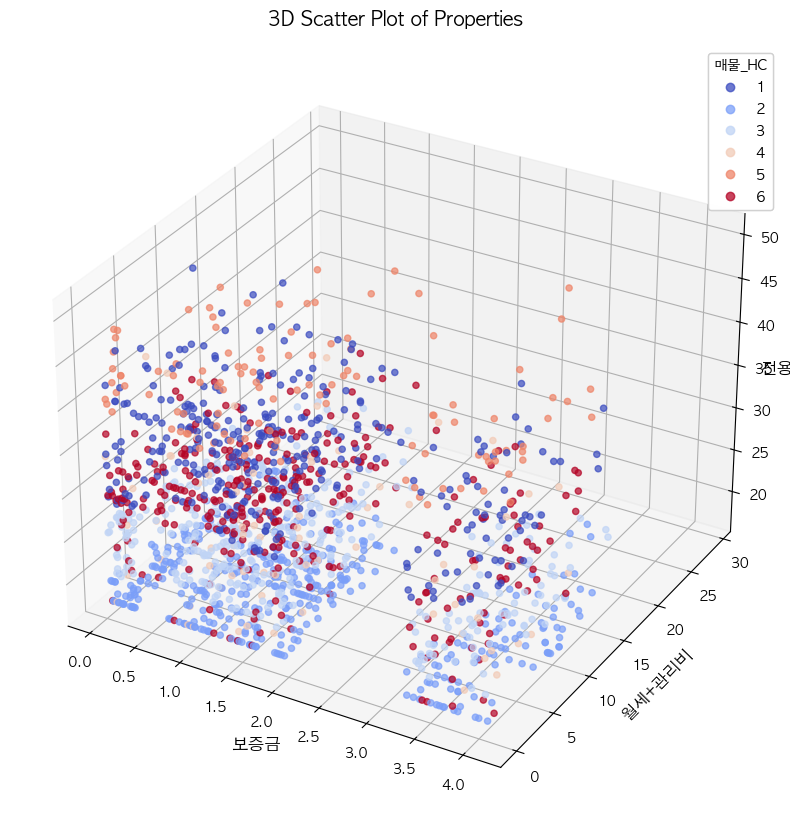

In [456]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Figure 설정
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    ttrain3["보증금"], 
    ttrain3["월세+관리비"], 
    ttrain3["전용면적"], 
    c=ttrain3["매물_HC"], 
    cmap="coolwarm",
    alpha=0.7
)

# 축 레이블 설정
ax.set_xlabel("보증금", fontsize=12)
ax.set_ylabel("월세+관리비", fontsize=12)
ax.set_zlabel("전용면적", fontsize=12)
ax.set_title("3D Scatter Plot of Properties", fontsize=14, pad=15)

# 범례 추가
legend1 = ax.legend(*scatter.legend_elements(), title="매물_HC", loc="upper right")
ax.add_artist(legend1)

# 그리드 및 시각적 조정
ax.grid(True, linestyle="--", alpha=0.6)

# 저장 및 표시
plt.savefig('./image/3D_보증금_월세관리비_전용면적.png', dpi=300, bbox_inches='tight')
plt.show()


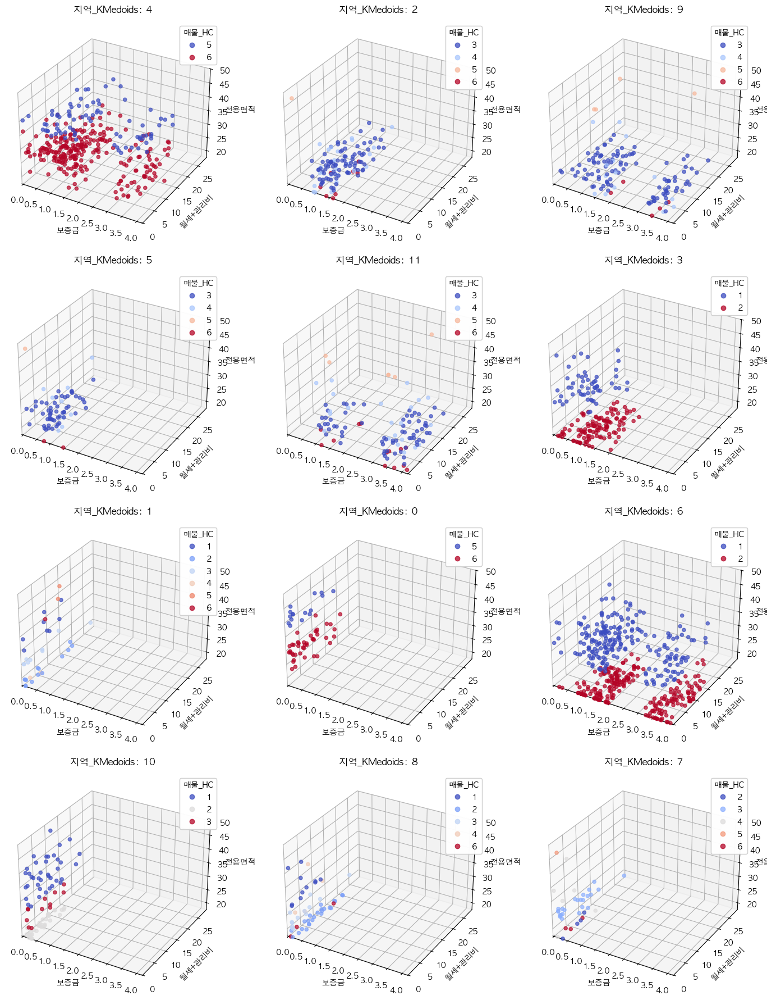

In [455]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Unique KMedoids values
unique_hc_values = ttrain3["지역_KMedoids"].unique()

# Figure 설정
fig = plt.figure(figsize=(15, 18))

x_min, x_max = ttrain3["보증금"].min(), ttrain3["보증금"].max()
y_min, y_max = ttrain3["월세+관리비"].min(), ttrain3["월세+관리비"].max()
z_min, z_max = ttrain3["전용면적"].min(), ttrain3["전용면적"].max()

for i, hc in enumerate(unique_hc_values, 1):
    ax = fig.add_subplot(4, 3, i, projection='3d')
    subset = ttrain3[ttrain3["지역_KMedoids"] == hc]

    # Scatter plot
    scatter = ax.scatter(
        subset["보증금"], 
        subset["월세+관리비"], 
        subset["전용면적"], 
        c=subset["매물_HC"], 
        cmap="coolwarm",
        alpha=0.7
    )

    ax.set_title(f"지역_KMedoids: {hc}", fontsize=12, pad=12)
    ax.set_xlabel("보증금", fontsize=10)
    ax.set_ylabel("월세+관리비", fontsize=10)
    ax.set_zlabel("전용면적", fontsize=10)
    ax.set_xlim(x_min-0.1, x_max+0.1)
    ax.set_ylim(y_min-0.1, y_max+0.1)
    ax.set_zlim(z_min-0.1, z_max+0.1)
    ax.grid(True, linestyle="--", alpha=0.6)

    # 각 서브플롯마다 개별 범례 추가
    legend1 = ax.legend(*scatter.legend_elements(), title="매물_HC")
    ax.add_artist(legend1)

plt.subplots_adjust(hspace=0.5)
plt.savefig('./image/지역별매물_3D_보증금_월세관리비_전용면적_legend.png')
plt.tight_layout()
plt.show()


<function matplotlib.pyplot.show(close=None, block=None)>

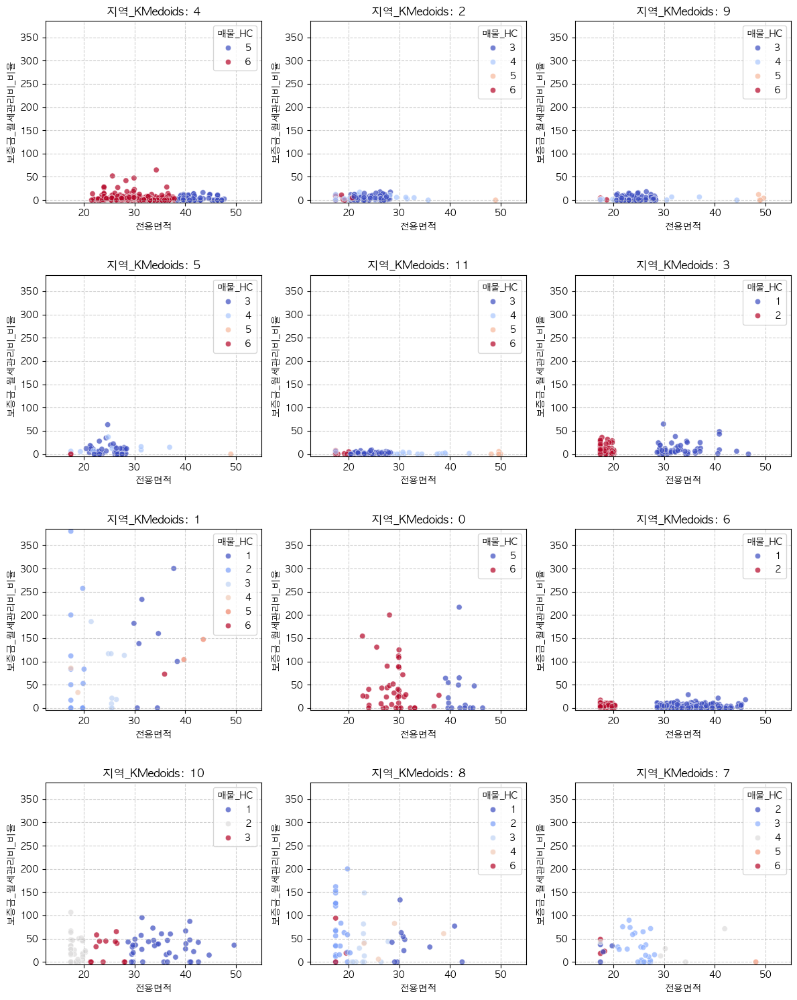

In [448]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# # 로그 변환 (0이 포함될 경우 작은 값 추가)
# ttrain3["log_전용면적"] = np.log1p(ttrain3["전용면적"])  # log1p(x) = log(x + 1) (0 값 방지)
# ttrain3["log_보증금_월세관리비_비율"] = np.log1p(ttrain3["보증금_월세관리비_비율"])

unique_hc_values = ttrain3["지역_KMedoids"].unique()

plt.figure(figsize=(12, 15))

x_min, x_max = ttrain3["전용면적"].min(), ttrain3["전용면적"].max()
y_min, y_max = ttrain3["보증금_월세관리비_비율"].min(), ttrain3["보증금_월세관리비_비율"].max()

for i, hc in enumerate(unique_hc_values, 1):
    plt.subplot(4, 3, i) 
    subset = ttrain3[ttrain3["지역_KMedoids"] == hc]  # 특정 그룹의 데이터 필터링
    
    sns.scatterplot(x=subset["전용면적"], 
                    y=subset["보증금_월세관리비_비율"], 
                    hue=subset["매물_HC"],
                    palette="coolwarm",
                    alpha=0.7)
    
    plt.title(f"지역_KMedoids: {hc}", fontsize=12)
    plt.xlabel("전용면적", fontsize=10)
    plt.ylabel("보증금_월세관리비_비율", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)
    
    plt.xlim(x_min-5, x_max+5)
    plt.ylim(y_min-5, y_max+5)
    

plt.tight_layout()
plt.subplots_adjust(hspace=0.4) 
plt.savefig('./image/지역별매물산점도_전용면적_보증금월세관리비비율.png')
plt.show

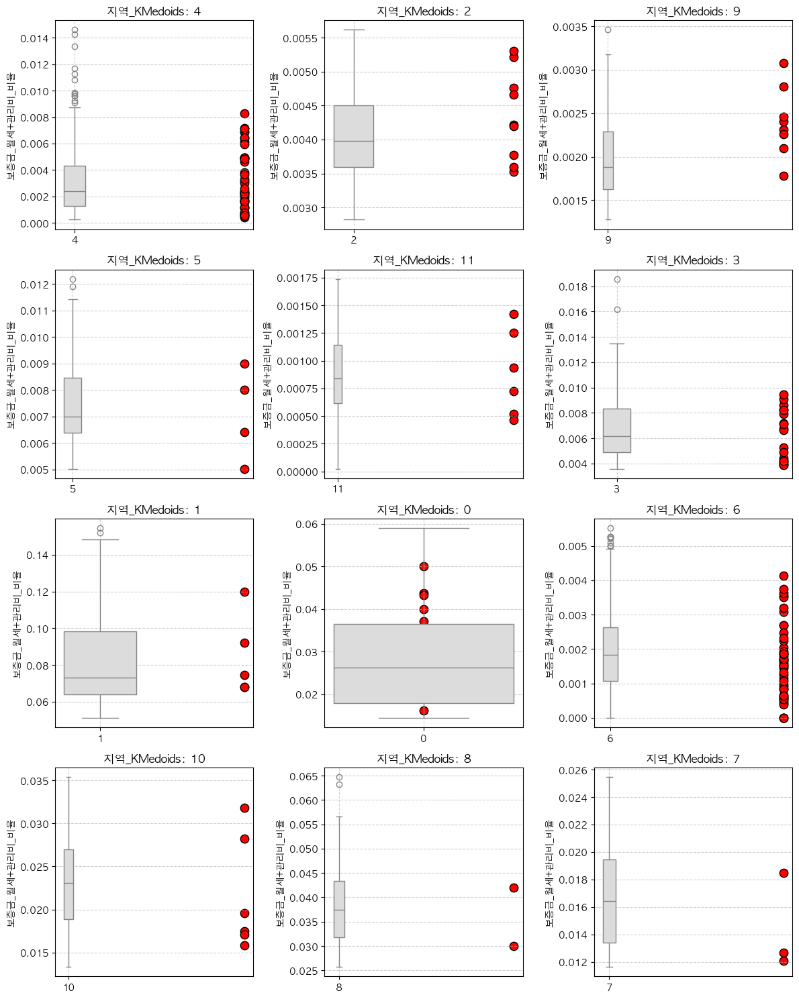

In [250]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# 지역 클러스터 값들 추출
unique_hc_values = ttrain3["지역_KMedoids"].unique()

# 그래프 크기 조정
plt.figure(figsize=(12, 15))

# 각 지역별 박스플롯 생성
for i, hc in enumerate(unique_hc_values, 1):
    plt.subplot(4, 3, i)  # 4행 3열의 서브플롯
    subset = ttrain3[ttrain3["지역_KMedoids"] == hc]  # 특정 클러스터의 데이터 필터링
    subset_hurim = subset[subset["허위매물여부"] == 1]  # 허위매물 데이터 필터링

    # 박스플롯 생성
    sns.boxplot(y=subset["보증금_월세관리비_비율"], 
                x=subset["지역_KMedoids"].astype(str),  # 문자열 변환 (hue와 일치해야 함)
                hue=subset["지역_KMedoids"].astype(str),
                palette="coolwarm",  
                width=0.5,  
                legend=False)  # legend 제거

    # 허위매물 빨간색 원으로 강조 표시
    plt.scatter(x=[hc] * len(subset_hurim), 
                y=subset_hurim["보증금_월세관리비_비율"], 
                color='red', edgecolors='black', 
                s=80, marker='o', label="허위매물")

    plt.title(f"지역_KMedoids: {hc}", fontsize=12)
    plt.xlabel("")
    plt.ylabel("보증금_월세+관리비_비율", fontsize=10)
    plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()


In [575]:
ttrain3

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,매물_HC,매물_DBSCAN,월세+관리비,보증금_월세관리비_비율,전용면적_가격_비율,지역_KMedoids,지역_HDBSCAN
3,TRAIN_0003,현장확인,16350.0,3.0,36.30,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,6,0,13.0,0.000795,0.000022,4,8
5,TRAIN_0005,전화확인,15300.0,53.0,29.50,4.0,3.0,남향,2.0,1.0,가능,1.0,0,Q42YF3Y0I2,A플랫폼,2024-09-12,0,6,0,53.0,0.003464,0.000117,4,8
8,TRAIN_0008,현장확인,12050.0,44.0,31.55,1.0,2.0,북향,2.0,2.0,가능,18.0,3,G52Iz8V2B9,B플랫폼,2024-05-23,0,4,1,47.0,0.003900,0.000124,1,2
9,TRAIN_0009,현장확인,7950.0,26.0,39.66,2.0,3.0,남동향,2.0,1.0,불가능,2.0,0,M90Ph8W9V3,B플랫폼,2024-11-30,0,5,0,26.0,0.003270,0.000082,4,3
10,TRAIN_0010,현장확인,18750.0,39.0,23.69,1.0,15.0,남향,1.0,1.0,불가능,15.0,5,G52Iz8V2B9,A플랫폼,2023-12-16,0,3,2,44.0,0.002347,0.000099,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2446,TRAIN_2446,전화확인,36550.0,19.0,17.50,4.0,14.0,남향,1.0,1.0,가능,104.0,10,G38pb6B9C7,C플랫폼,2024-12-10,0,2,2,29.0,0.000793,0.000045,5,6
2447,TRAIN_2447,서류확인,15900.0,55.0,48.95,3.0,3.0,남향,2.0,1.0,불가능,17.0,0,d22DX4Y4P8,B플랫폼,2024-11-16,0,5,0,55.0,0.003459,0.000071,4,3
2449,TRAIN_2449,전화확인,32900.0,61.0,17.50,8.0,20.0,남서향,1.0,1.0,가능,29.0,10,G52Iz8V2B9,B플랫폼,2024-05-15,0,2,2,71.0,0.002158,0.000123,5,6
2450,TRAIN_2450,현장확인,3100.0,40.0,22.87,8.0,9.0,남동향,2.0,1.0,가능,17.0,8,m69GM9O9B3,B플랫폼,2024-08-06,0,6,0,48.0,0.015484,0.000677,6,7


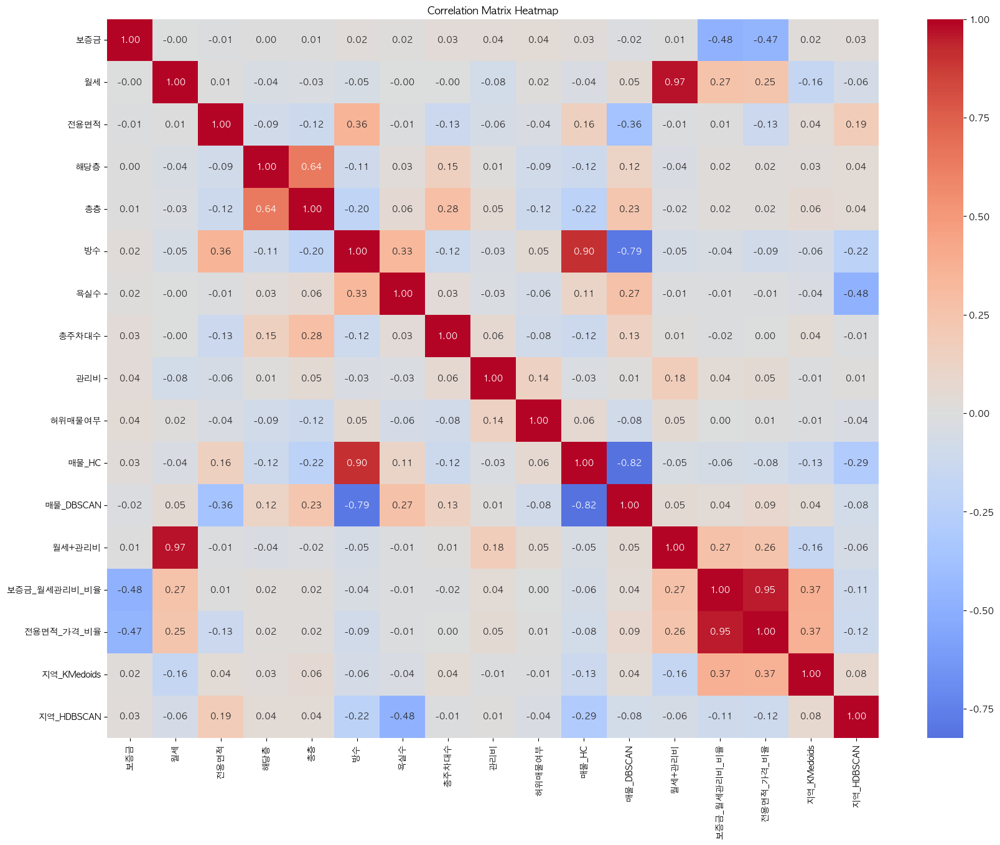

In [576]:
ttrain_cor_df = ttrain3.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr()

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/feature_transformation/correlation_matrix_heatmap_pearson_250204.png", dpi=300, bbox_inches='tight')
plt.show()

모드 변수들이 허위매물 여부를 강하게 설명하지 못하고 있어, 단순한 선형 상관관계로 허위매물을 판별하기 어렵습니다. 따라서 Feature Transformation을 통해 의미 있는 컬럼을 만들어야 합니다.

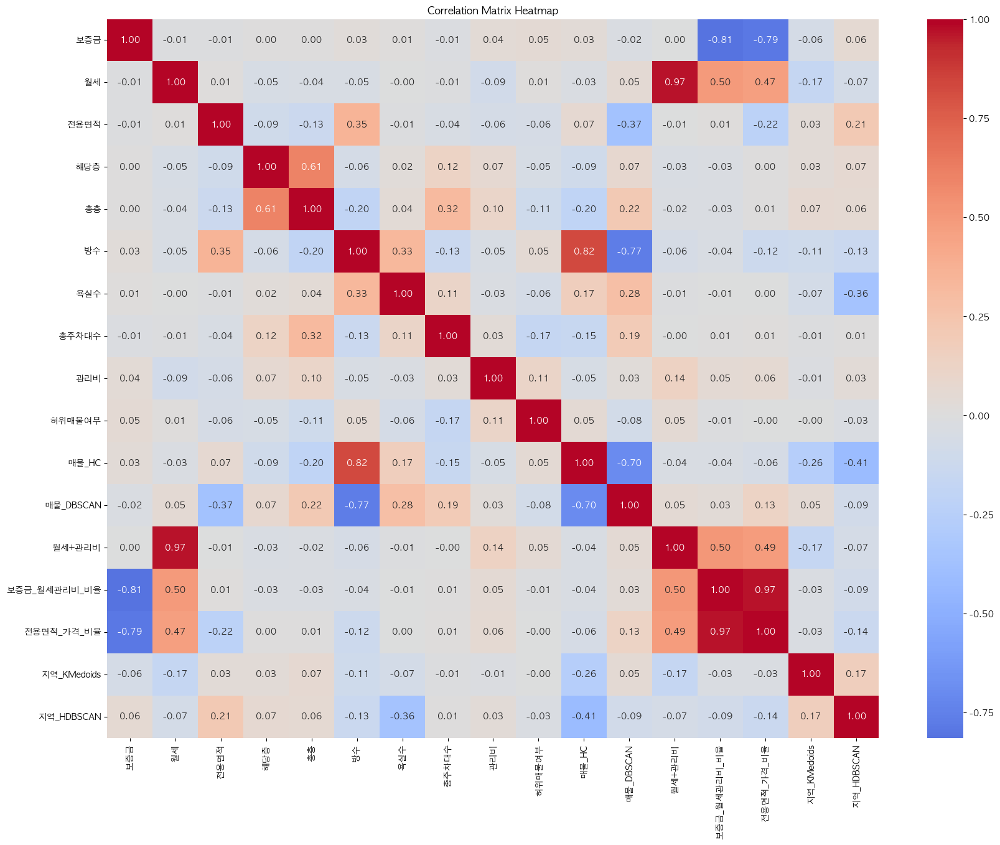

In [577]:
ttrain_cor_df = ttrain3.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr(method='spearman')

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/feature_transformation/correlation_matrix_heatmap_spearman_250204.png", dpi=300, bbox_inches='tight')
plt.show()

In [453]:
import sys
!{sys.executable} -m pip install scikit-learn-extra

  Using cached scikit-learn-extra-0.3.0.tar.gz (818 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-learn-extra: filename=scikit_learn_extra-0.3.0-cp312-cp312-macosx_11_0_arm64.whl size=399986 sha256=761a7f51fb275391f8bd6369a84e2ae627f4a4e3c134393be716a57a6bf34509
  Stored in directory: /Users/kimminyoung/Library/Caches/pip/wheels/17/4d/c3/c6d5d563c1bf8146d059d63be3678abc2f2801fba0aaf5f0b8
Successfully built scikit-learn-extra


### 계절 변수 생성

In [584]:
def get_season(month):
    if month in [3, 4, 5]:
        return '봄'
    elif month in [6, 7, 8]:
        return '여름'
    elif month in [9, 10, 11]:
        return '가을'
    else:
        return '겨울'

ttrain3['게재일'] = pd.to_datetime(ttrain3['게재일'], errors='coerce')
ttrain3['계절'] = ttrain3['게재일'].dt.month.apply(get_season)
ttrain3

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,매물_HC,매물_DBSCAN,월세+관리비,보증금_월세관리비_비율,전용면적_가격_비율,지역_KMedoids,지역_HDBSCAN,계절
3,TRAIN_0003,현장확인,16350.0,3.0,36.30,3.0,9.0,남동향,2.0,1.0,가능,13.0,10,G52Iz8V2B9,A플랫폼,2024-11-26,0,6,0,13.0,0.000795,0.000022,4,8,가을
5,TRAIN_0005,전화확인,15300.0,53.0,29.50,4.0,3.0,남향,2.0,1.0,가능,1.0,0,Q42YF3Y0I2,A플랫폼,2024-09-12,0,6,0,53.0,0.003464,0.000117,4,8,가을
8,TRAIN_0008,현장확인,12050.0,44.0,31.55,1.0,2.0,북향,2.0,2.0,가능,18.0,3,G52Iz8V2B9,B플랫폼,2024-05-23,0,4,1,47.0,0.003900,0.000124,1,2,봄
9,TRAIN_0009,현장확인,7950.0,26.0,39.66,2.0,3.0,남동향,2.0,1.0,불가능,2.0,0,M90Ph8W9V3,B플랫폼,2024-11-30,0,5,0,26.0,0.003270,0.000082,4,3,가을
10,TRAIN_0010,현장확인,18750.0,39.0,23.69,1.0,15.0,남향,1.0,1.0,불가능,15.0,5,G52Iz8V2B9,A플랫폼,2023-12-16,0,3,2,44.0,0.002347,0.000099,2,5,겨울
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2446,TRAIN_2446,전화확인,36550.0,19.0,17.50,4.0,14.0,남향,1.0,1.0,가능,104.0,10,G38pb6B9C7,C플랫폼,2024-12-10,0,2,2,29.0,0.000793,0.000045,5,6,겨울
2447,TRAIN_2447,서류확인,15900.0,55.0,48.95,3.0,3.0,남향,2.0,1.0,불가능,17.0,0,d22DX4Y4P8,B플랫폼,2024-11-16,0,5,0,55.0,0.003459,0.000071,4,3,가을
2449,TRAIN_2449,전화확인,32900.0,61.0,17.50,8.0,20.0,남서향,1.0,1.0,가능,29.0,10,G52Iz8V2B9,B플랫폼,2024-05-15,0,2,2,71.0,0.002158,0.000123,5,6,봄
2450,TRAIN_2450,현장확인,3100.0,40.0,22.87,8.0,9.0,남동향,2.0,1.0,가능,17.0,8,m69GM9O9B3,B플랫폼,2024-08-06,0,6,0,48.0,0.015484,0.000677,6,7,여름


In [587]:
ttrain3['매물_등록_경과일'] = (ttrain3['게재일'].max() - ttrain3['게재일']).dt.days

<Figure size 10000x2500 with 0 Axes>

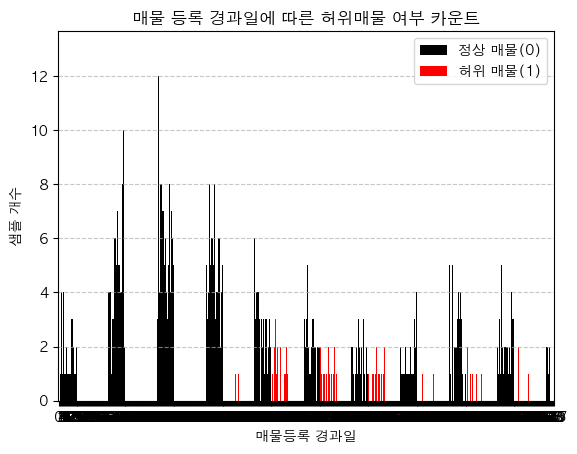

In [596]:
import matplotlib.pyplot as plt
import pandas as pd

# 월별 허위매물 여부(0, 1) 카운트
count_df = ttrain3.groupby(['매물_등록_경과일', '허위매물여부']).size().unstack(fill_value=0)

# 바 차트 그리기
plt.figure(figsize=(100, 25))
count_df.plot(kind='bar', stacked=False, width=0.7, color=['black', 'red'])

# 그래프 스타일 설정
plt.xlabel('매물등록 경과일')
plt.ylabel('샘플 개수')
plt.title('매물 등록 경과일에 따른 허위매물 여부 카운트')
plt.legend(['정상 매물(0)', '허위 매물(1)'])
plt.xticks(rotation=0)  # X축 라벨 가독성 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.show()

In [602]:
ttrain3[(ttrain3.매물_등록_경과일<150)&(ttrain3.허위매물여부==1)]

,ID,매물확인방식,보증금,월세,전용면적,해당층,총층,방향,방수,욕실수,주차가능여부,총주차대수,관리비,중개사무소,제공플랫폼,게재일,허위매물여부,매물_HC,매물_DBSCAN,월세+관리비,보증금_월세관리비_비율,전용면적_가격_비율,지역_KMedoids,지역_HDBSCAN,계절,매물_등록_경과일
230,TRAIN_0230,현장확인,9500.0,65.0,17.5,3.0,6.0,남향,1.0,1.0,불가능,3.0,13,I97SP1K4K9,A플랫폼,2024-10-08,1,2,2,78.0,0.008211,0.000469,3,6,가을,146
2186,TRAIN_2186,현장확인,9300.0,55.0,17.5,4.0,5.0,남향,1.0,1.0,불가능,17.0,11,Q65VU2R1S3,A플랫폼,2024-10-08,1,2,2,66.0,0.007097,0.000406,3,6,가을,146


In [603]:
ttrain3.columns

Index(['ID', '매물확인방식', '보증금', '월세', '전용면적', '해당층', '총층', '방향', '방수', '욕실수',
       '주차가능여부', '총주차대수', '관리비', '중개사무소', '제공플랫폼', '게재일', '허위매물여부', '매물_HC',
       '매물_DBSCAN', '월세+관리비', '보증금_월세관리비_비율', '전용면적_가격_비율', '지역_KMedoids',
       '지역_HDBSCAN', '계절', '매물_등록_경과일'],
      dtype='object')

### 필요 없는 컬럼 제거

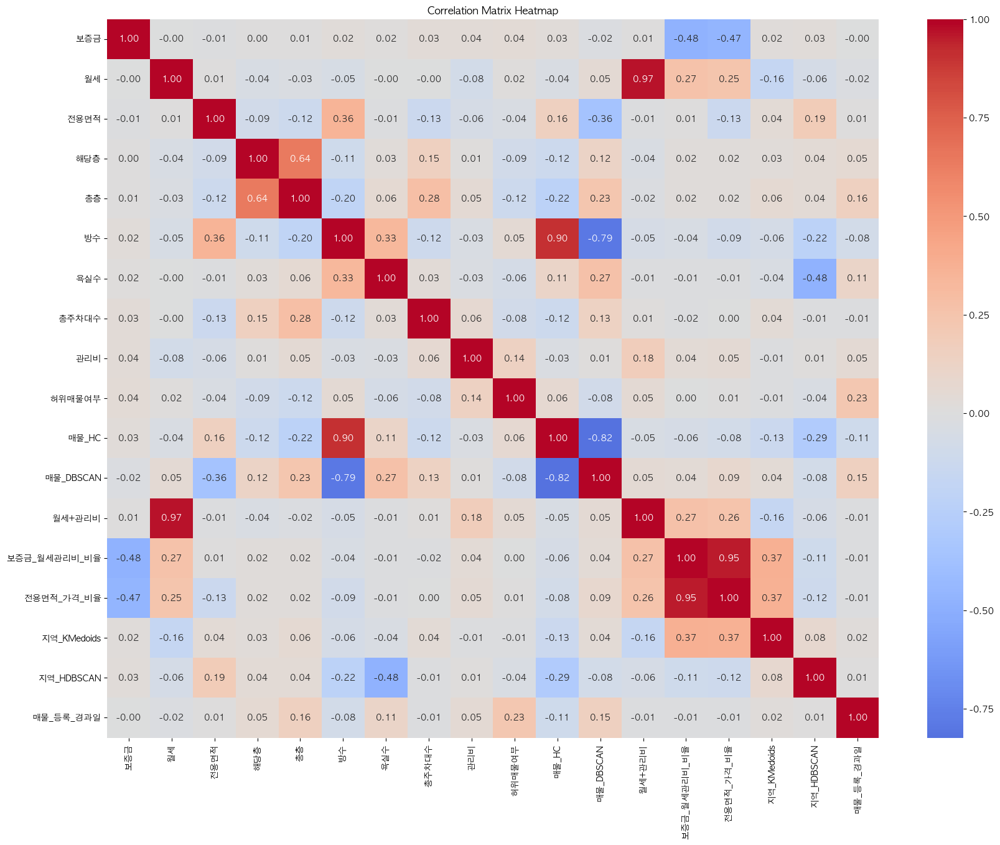

In [613]:
ttrain_cor_df = ttrain3.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr()

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/feature_transformation/correlation_matrix_heatmap_pearson_250205.png", dpi=300, bbox_inches='tight')
plt.show()

모드 변수들이 허위매물 여부를 강하게 설명하지 못하고 있어, 단순한 선형 상관관계로 허위매물을 판별하기 어렵습니다. 따라서 Feature Transformation을 통해 의미 있는 컬럼을 만들어야 합니다.

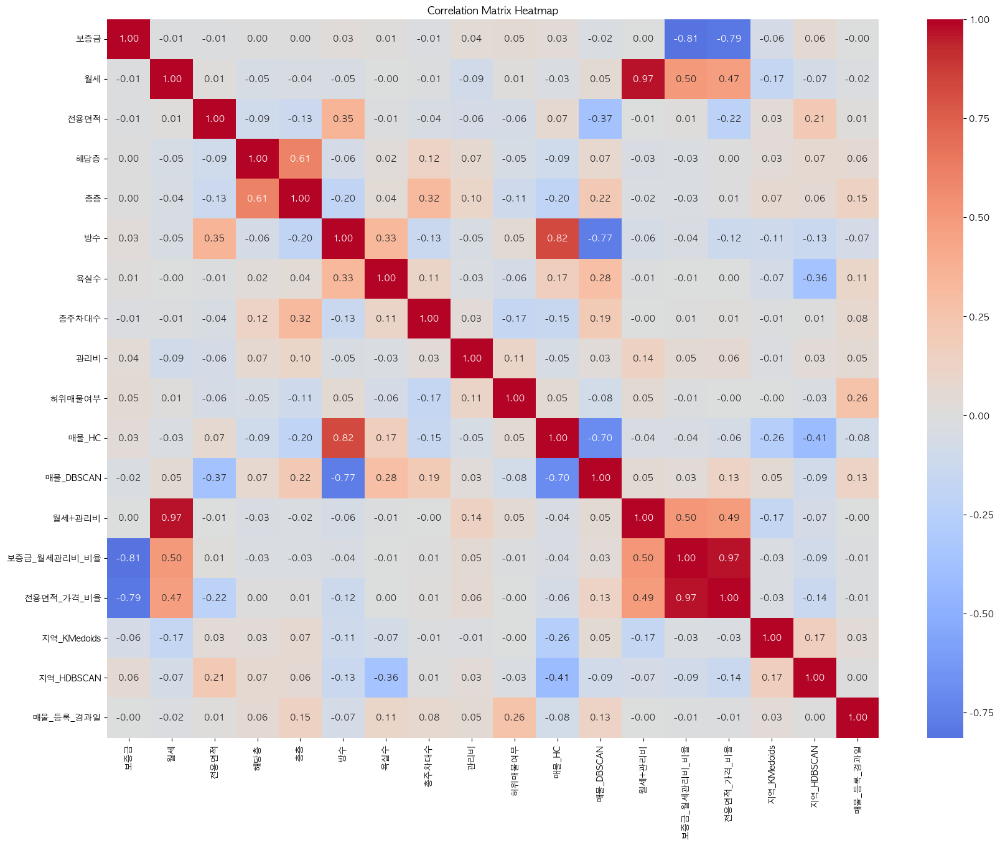

In [614]:
ttrain_cor_df = ttrain3.select_dtypes(include=[np.number])
correlation_matrix = ttrain_cor_df.corr(method='spearman')

# 히트맵 생성
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Correlation Matrix Heatmap")
plt.savefig("./image/feature_transformation/correlation_matrix_heatmap_spearman_250205.png", dpi=300, bbox_inches='tight')
plt.show()

- ID 제거
- 중개사무소, 제공 플랫폼 등 허위매물여부와 관련성 없고, 고유한 값이 많은 컬럼 제거
- 게재일 : 계절이나 매물등록경과일 등 필요에 맞게 전처리한 컬럼 제거
- 월세, 보증금의 경우 모델을 돌려보면서 제거할지 포함할지 정하기
- 보증금_월세관리비_비율 : 전용면적_가격_비율과 상관관계가 높기 때문에 제거(0.97)

In [615]:
ttrain3 = ttrain3.drop(columns = ['ID', '중개사무소', '제공플랫폼', '게재일', '보증금_월세관리비_비율'])
ttrain3.columns

Index(['매물확인방식', '보증금', '월세', '전용면적', '해당층', '총층', '방향', '방수', '욕실수', '주차가능여부',
       '총주차대수', '관리비', '허위매물여부', '매물_HC', '매물_DBSCAN', '월세+관리비', '전용면적_가격_비율',
       '지역_KMedoids', '지역_HDBSCAN', '계절', '매물_등록_경과일'],
      dtype='object')

In [616]:
ttrain3.to_csv('./data/ttrain3.csv', index = False)

## 범주형 데이터 원 핫 인코딩

In [ ]:
ttrain3 = pd.get_dummies(ttrain3, columns=['매물확인방식', '방향', '주차가능여부'], drop_first=True)